# The Effects of Initial Velocity Angle and Nucleic Charge on Classical Electron Orbital Trajectories

**Semester**: Winter 2025

**Name:** Rhea Zhu  

# Table of Contents

<summary><strong>1. Project Overview</strong></summary>

- [1.The Effects of Initial Velocity Angle and Nucleic Charge](#the-effects-of-initial-velocity-angle-and-nucleic-charge-on-classical-electron-orbital-trajectories)
  - [1.1 Overview](#overview)
    - [1.1.1 Experimental Method & Analysis](#experimental-method--analysis)
      - [1.1.1.1 Simulation Introduction](#simulation-introduction)
      - [1.1.1.2 Defining a Stable Orbit](#defining-a-stable-orbit)
      - [1.1.1.3 Programming Analysis](#programming-analysis)
        - [1.1.1.3.1 Programming with Solve_IVP](#programming-with-solve_ivp-2)
      - [1.1.1.4 Analysis Methods](#analysis-methods)
      - [1.1.1.5 Physical Assumptions](#physical-assumptions)



<summary><strong>2. Analysis of Combined Parameters</strong></summary>

- [2. Analysis: Combinations of Initial Velocity Angle and N₂ Charge](#analysis-investigating-combinations-of-initial-velocity-angle-and-n2-charge)
  - [2.1 Part I: Preliminary Orbital Trajectory Analysis](#part-i-preliminary-trial-analysis-understand-orbital-trajectories)
    - [2.1.1 Cycle 1: ($N_2 = N_1$), varying $\theta$](#cycle-1-n_2--n_1-altering-theta)
    - [2.1.2 Cycle 2: ($N_2 = 5N_1$), varying $\theta$](#cycle-2-n_2--5n_1-altering-theta)
    - [2.1.3 Cycle 3: ($N_2 = 10N_1$), varying $\theta$](#cycle-3-n_2--10n_1-altering-theta)
    - [2.1.4 Cycle 4: ($N_2 = 20N_1$), varying $\theta$](#cycle-4-n_2--20n_1-altering-theta)
    - [2.1.5 General Analysis — Part I](#part-i-general-analysis)
  - [2.2 Part II: Discrete Phase-Space Analysis to Detect Stable Orbits](#part-ii-discrete-phase-space-analysis-to-detect-stable-orbits)
    - [2.2.1 Programming for stability detection](#programming-for-stability-detection)
    - [2.2.2 Parameters](#parameters)
    - [2.2.3 Detecting Stable Orbits](#detecting-stable-orbits)
    - [2.2.4 Examples of Periodicity Check](#examples-of-periodicity-check)
    - [2.2.5 Discrete Phase Space Simulation](#part-i-phase-space-simulation-discrete-categories)  
  - [2.3 Part III: Continuous Phase-Space Analysis to Quantify Relative Standard Deviation](#part-ii-of-phase-space-simulation-quantitative-heat-map) 
    - [2.3.1 Analysis for Continuous Quantitative Phase Space Scan](#analysis-for-continuous-quantitative-phase-space-scan)  
    - [2.3.2 Pattern 1: Periodic Collisions](#pattern-1-periodic-collisions)
    - [2.3.3 Pattern 2: Claw-Mark Collisions](#pattern-2-claw-mark-collisions) 
    - [2.3.4 Pattern 3: Neon Band above Lower Thir Region](#pattern-3-neon-band-above-lower-third-region)
    - [2.3.5 Pattern 4: Curves of Periodicity](#pattern-4-curves-of-periodicity)
  - [2.4 Part IV: Numerical Artifacts and Quantification of stability](#part-iv-analyzing-numerical-artifacts-and-quantification-of-stability)

<summary><strong>3. Limitations and Future Work</strong></summary>

- [3. Results & Discussion](#results-and-discussion)
  - [3.1 Part I General Analysis](#part-i-general-analysis)
  - [3.2 Part II General Analysis](#part-ii-general-analysis)
  - [3.3. Limitations & Next Steps](#limitations--next-steps)
    - [3.3.1 Limitations](#technical-limitations)
    - [3.3.2 Next Steps](#next-steps)

<summary><strong>4. Acknowledgements, References, & Appendices</strong></summary>

- [4. Acknowledgements](#acknowledgements)
- [5. References](#references)

##### **Appendix: Code Validation**
- [6. Appendix 1: Code Validation](#appendix-1-code-validation)


# Overview
In this project, I use Solve_IVP to investigate the conditions needed to achieve stable Saturnian trajectories for an electron orbiting two nuclei of variable charge. Specifically, I vary  the electron's initial velocity angle and distance and ask the following: 

**Research Questions** 

1. What electron path trajectories are traced when varying (1) initial velocity angle, and (2) nucleic charge?
2. What combinations of initial velocity angle and nucleic charge create stable orbital trajectories?

In this project, "stability" refers to a sense of periodicity, where the electron's trajectory roughly repeats itself over its entire path, and does not grow/shrink dramatically. We quantitatively define stability as the standard deviation of the electron's orbital periods relative to its average period being less than 10 percent: $$\frac{dP}{P} < 0.1$$

## Experimental Method & Analysis  

### Simulation Introduction
![210Diagram](https://i.imgur.com/GttkjvB.jpeg)

**Figure 1**. Schematic of simulation setup.

1. **Setup**: Two nuclei, call $N_1$ and $N_2$, are vertically placed $1.2 \times 10^{-10}m$ apart. An electron $e$ is placed $5.29 \times 10^{-11}m$ from the point bisecting $N_1$
and $N_2$. $N_1$ has a fixed nucleic charge of $-e^- = 1.6 \times 10^{-19} C$, while $N_2$ is variable
2. **Initial Parameters**: In this simulation, two parameters are explored: initial electron velocity and $N_2$ nucleic charge:
   * *Initial electron velocity angle*: In this experiment, we restrict the domain of $\theta$ to $0 \leq \theta \leq 180^o$. We choose to restrict $\theta$ to two quadrants, since we expect the electron trajectories of domain $\theta$ to $0 \leq \theta \leq 180^o$ to be symmetrical to  $0 \leq \theta \leq -180^o$.
   * *$N_2$ nucleic charge*: Since $N_2$ is a nucleus, its charge is restricted to positive values. So, the range of values for $N_2$ charge, call $c$, is $(c > 0) C$.
4. **Start Simulation**: When the simulation begins, the electron orbits at a speed of $2.18 \times 10^6 m/s$ around the two nuclei; this speed was determined by an electron's speed around a hydrogen atom a Bohr radius away from the nucleus. The electron's trajectory follows the Coulomb force [1]: $$F_{orbit} = \frac{q_1 q_2}{4  \pi \epsilon_0 r^2} \vec{r}$$ However, since the electron is in the presence of two nuclei, its resultant force is the vector sum of both Coulomb forces. So, if we let $c$ be the charge of $N_2$. then $$F_{total} = \frac{e^- c}{4 \pi \epsilon_0 r_{N_2^2}} \vec{r_{N_2}} + \frac{-e^2}{4 \pi \epsilon_0 r_{N_1^2}} \vec{r_{N_1}}$$ 
5. **Outcome**: By varying the initial parameters, we analyze what parametric combinations create stable and unstable orbits. Note that **stable orbits** are *periodic and predictable*, whereas **unstable orbits** are *random and chaotic*.

Note that we define $\theta$ as the angle the velocity vector makes with the horizontal x-axis; that is, $90^o$ corresponds to the vector parallel to the line defined by $N_1$ and $N_2$
 

### Defining orbits

We quantitatively define a stable orbit in two ways:

1. **Periodicity**: The standard deviation between all periods relative to the electron's average period is within 10%. For each time step during a simulation run, the distance between the electron’s current position and its original position is calculated, and the local minima of these distances are found; the time intervals between the local minima represent approximate “periods” of the electron’s trajectory. Using this, the relative standard deviation between the time intervals is calculated; if it is less than 10%, the orbit is deemed periodic. Note that with this definition of periodicity, electrons with high precession, or periodic orbital drift, would be characterized as unstable. This is further discussed in the "Limitations" section of the project.

2. **Electron-nucleis collision**: At any time step, if he electron is within 8.5e-16m of either nucleis, the orbit is unstable. Note that 8.5e-16 m was chosen, since it is the radius of the proton. Therefore, if the electron’s position is within its radius, it is assumed to have collided with the nucleus. Note that whether the electron collides with a nucleus is checked after the electron's full trajectory, which is why the graphed electron paths will seem to show that the electron continues travelling even after colliding with a nucleus. This is discussed in "Limitations".

Using these criterion, we define stable, unstable/quasi-periodic, and collision orbits as the following:

1. **Stable Periodic**: These orbits have relative standard deviations of under 10%, and do not collide with either nucleus. 
2. **Unstable/Quasi-Periodic**: These orbits have relative deviations of over 10%, but also do not collide with either nucleus. 
3. **Collision**: These orbits collide with at least 1 of the 2 nuclei. As a result, periodicity is not checked. 

A more in-depth analysis on orbital stability is conducted in "Defining Stable Orbits" and "Examples of Periodicity Check", where histogram graphs of orbital periods for stable and unstable orbits are compared and contrasted.

### Programming Analysis

#### Programming with Solve_IVP [2]
In this project, we will use the function Solve_IVP to simulate the electron's path trajectories. Solve_IVP is a function in Python's SciPy library, designed to solve ordinary differential equations (ODEs) in initial value problems (IVPs). To do this, Solve_IVP takes initial variables (such as position and velocity) and calls a function specified by the user to calculate the derivatives of those initial states; then, Solve_IVP takes these equations to calculate position and velocity at each specified time step, using a technique similar to Euler's method.

This is useful for the simulation, since we are modelling the components for position $x, y$, velocity $v_x, v_y$, acceleration $a_x, a_y$, and force $F_x, F_y$, where $$F_x = ma_x, a_x = \frac{dv_x}{dt}, v_x = \frac{dx}{dt}$$ and $$F_y = ma_y, a_y = \frac{dv_y}{dt}, v_y = \frac{dy}{dt}$$ 

To use Solve_IVP, we first define the initial state of our electron, with the tuple $(x_0, y_0, v_x0, v_y0)$. We then create a function specifying the differential relationships between these four values. Using the equation for Coulomb force: $$F = \frac{q_1q_2}{4 \pi r^2}$$ We can calculate the component forces on the electron at each time step, then use that to calculate acceleration. The derivative for $x_0$ and $y_0$ woudl then be $v_{x0}$ and $v_{y0}$ respectively, and the derivatives for $v_{x0}$ and $v_{y0}$ are $v_{a0}$ and $a_{y0}$. We return these four values from our function, which Solve_IVP then uses to calculate the trajectory of the electron. 

We execute each simulation over a time span of $1e-14$s. This value was determined via several initial simulation tests over a large range of nucleic charge and initial velocity angle combinations; it was found that 1e-14s was the most appropriate period that both (1) accurately represents the full trajectory of the electrons, and (2) is not too long as to overly prolong the code runtime. 

### Analysis Methods 

This project's analysis will be broken into four portions. 
1. **Preliminary Trial Analysis**: In this section, we manually alter the $N_2$ and $\theta$ parameters and qualitatively observe the trajectories of the electrons as they shift. By conducting these preliminary trials, we gain general knowledge of how nucleic charge and initial velocity angle affect electron orbital trajectories. **Note that stability is not tested here**, since we want to first get a preliminary understanding of the effects of nucleic charge and angles on electron orbital paths. During this preliminary analyses, the time the electron orbits the two nuclei varies across trials; since we simply want to see the trajectory the electron traces over different parameter combinations, we do not need a consistent period, but one that provides representative graphs of the electron's paths.  

2. **Discrete Longitudinal Phase Space Analysis**: In this section, we quantitatively determine if orbits are stable over a wide range in our phase space by running our simulation with $\theta$ and $N_2$ combinations throughout our domains of $0 \leq \theta \leq 90^o$ and $\frac{1}{100}N_1\leq N_2 \leq 100N_1$. We choose the $N_2$ range based on the maximum value of $N_2$ tested in the preliminary trials, which is 100. We take the inverse of 100 for the lower bound of our $N_2$ domain. We also choose our $\theta$ to be restricted to our first quadrant to limit the program's run time; from preliminary trial analysis, the behavior of obtuse angles is very similar to the behavior of acute angles, so we do not expect this restriction to compromise our project's validity. The discrete phase space analysis outputs which combinations of initial velocity angle and $\frac{N_2}{N_1}$ parameters lead to (1) stable, (2) unstable/quasi-periodic, and (3) collision orbits. For each trial, we run the trial for 2.5e-15s; this value was chosen, since it was observed that for various parameter combinations an orbit of 2.5e-15 provided representative descriptions of the electron's trajectory, while not being too large as to have an unreasonably high simulation run time.

3. **Continuous Longitudinal Phase Space Analysis**: In Part III, we extend our discrete phase space by running a continuous phase space analysis on the relative standard deviation of each combination of our phase space parameters; we also increase the resolution of our phase space to more deeply understand the patterns seen in our simulations. This portion of our analysis goes deeper into the justification of stable, unstable, and collision orbits, and also checks the validity of our quantification of stability.

4. **Numerical Artifacts and Quantification of stability**: In this final section, we look at the numerical artifacts present in our continuous longitudinal phase space graph and try to understand why such artifacts are present. We reflect on these results and connect them to possible limitations in our quantification of stability.

### Physical Assumptions  
The following assumptions are made in our simulation: 
1. **Two Exclusive Forces**: The only two forces acting on the electron are those of $N_1$ and $N_2$. We neglect the gravitational forces the electron experiences from $N_1$ and $N_2$, since they are magnitudes weaker than the electrostatic force.
2. **Classical Interpretation**: The simulation assumes an entirely classical interpretation of the setup, using the Coulomb force as the main driver of this project. 
3. **Neglect Relativistic Effects**: Since the electron's velocity is magnitudes smaller than the speed of light, we can also reasonably neglect relativistic effects.


# Analysis: Investigating Combinations of Initial Velocity Angle and N2 Charge

## Part I: Preliminary Trial Analysis To Understand Orbital Trajectories 

In Part I, we manually choose various combinations of $N_2$ and $\theta$ to run the simulation, observing the qualitative characteristics of the electron trajectory. 

For this portion of the analysis, we separate it into four cycles. We firstly set $N_2 = N_1$ and alter $\theta$. We then simulate electron trajectories when $N_2$ is larger, that is, when $N_2 = 5N_1$, and also alter $\theta$. For cycle 3, we do the opposite and set $N_2 = \frac{1}{5}N_1$, and for cycle 4, we let $N_2$ be much larger than $N_1$ where $N_2 = 100N_1$. By picking various ratios of $N_2$ and $N_1$, we take a very broad range of data to capture most of the possible electron path trajectories in the simulation. 

Note that the $\theta$ we pick to alter for each cycle was determined after initial testing, where each $\theta$ analyzed below shows a unique pattern of characteristics. Also, when we use the term "electron path density", we qualitatively refer to the number of periods the electron orbits in the span of time. We say that a path is "localized" if the electron orbital paths are close together and have low electron drift; more informally, a localized electron path is very "bunched together". 

### Cycle 1: $N_2 = N_1$, Altering $\theta$ 

For our first cycle, we let $N_2 = N_1$, and set $\theta = 5^o, 20^o, 90^o, 120^o$. Note that these angles were chosen based on the following unique properties: 

1. $5^o$: Increase in electron path density on the y=0 axis. 
2. $20^o$: Electron path density is very localized, with the paths having extremely low orbital drift
3. $90^o$: A full ellipsoid is traced. 
4. $120^o$: An ellipsoid with a smaller eccentricity is traced, with a lower electron path density.

#### Trial 1: $\theta = 5^o$

In [5]:
# SIMULATION CODE

# Import useful libraries
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
import math 

# Constants 

k = 8.99e9            # Coulomb constant, N·m²/C²
e = -1.6e-19          # Electron charge magnitude, C
n1 = 1.6e-19          # Nucleus 1 charge 
me = 9.109e-31        # Electron mass, kg
r0 = 5.29e-11         # Bohr radius, m 

distance = 1.2 * 10**(-10) #vertical distance between two nuclei, m
y1 = distance / 2  # N1 y coordinate, m 
x1 = 0             # N1 x coordinate, m
y2 = -distance / 2 # N2 x coordinate, m
x2 = 0             # N2 y coordinate, m 


def get_trajectory(n2, angle, T):
    # Initial Velocity
    v0 = 2.18e6  # initial velocity (m/s)  
    theta = math.radians(angle) #convert angle to radians, rad
    vx0 = math.cos(theta) * v0  # initial x velocity (m/s)
    vy0 = math.sin(theta) * v0  # initial y velocity (m/s)
    state0 = (r0, 0, vx0, vy0)  # (x0, y0, vx0, vy0) (m,m,m/s,m/s)

    t_span = (0, T) # span for simulation to run 
    

    # Nuclei coordinates
    # We define the coordinate (0,0) to be the halfway point between N1 and N2
    distance = 1.2 * 10**(-10) #vertical distance between two nuclei, m
    y1 = distance / 2  # N1 y coordinate, m 
    x1 = 0             # N1 x coordinate, m
    y2 = -distance / 2 # N2 x coordinate, m
    x2 = 0             # N2 y coordinate, m

    # Get your solution from solve_ivp    
    sol1 = solve_ivp(diff_eqns, t_span, state0, rtol=1e-9, atol=1e-9) 
    return sol1

# Define your diff_eqns function
def diff_eqns(t, state):
    x, y, vx, vy = state #state variables in timestep, m, m, m/s, m/s

    
    r1x = x - x1 #x distance between electron & N1, m
    r1y = y - y1 #y distance between electron & N1, m
    r1 = np.sqrt(r1x**2+r1y**2) #distance between N1 and electron

    r2x = x - x2 #x distance between electron & N2, m
    r2y = y - y2 #y distance between electron & N2, m 
    r2 = np.sqrt(r2x**2+r2y**2) #distance between N2 and electron
    

    # Calculate the magnitude of the force 

    # Calculate force & acceleration components for N1
    fx1 = k * e * n1 * r1x / r1**3
    fy1 = k * e * n1 * r1y / r1**3

    # Calculate force & acceleration components for N1
    fx2= k * e * n2 * r2x / r2**3
    fy2 = k * e * n2 * r2y / r2**3 

    fx = fx1 + fx2 
    fy = fy1 + fy2

    # Calculate acceleration
    accx = fx/me 
    accy = fy/me  

    # Return differentials
    return vx, vy, accx, accy 

def plot_trajectory(sol1, top, T, c):
    # Plot y vs x for theta = 5
    fig, ax = plt.subplots(1, 3)
    fig.set_size_inches(14, 9)
    fig.suptitle(f'Electron Orbital Trajectory: N2 = {n2/n1: 0.2g} N1, Theta = {angle}', fontsize=16, fontweight='bold')
    plt.subplots_adjust(top=top) 

    ax[2].plot(sol1.y[0], sol1.y[1], label = "Trajectory",c = "cornflowerblue") 
    ax[2].set_aspect("equal") 
    ax[2].set_title(f"Time Span = {T} s") 
    ax[2].set_xlabel("x (m)")
    ax[2].set_ylabel(" y (m) ")
    ax[2].grid(True) 
    ax[2].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
    ax[2].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
    ax[2].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
    ax[2].legend(loc='upper left', fontsize=9) 

    # Get the one-third index
    idx1 = len(sol1.t) // 3

    # Plot only the first one-third of the data
    ax[1].plot(sol1.y[0][:idx1], sol1.y[1][:idx1], label="Trajectory", c="cornflowerblue")
    ax[1].set_aspect("equal") 
    ax[1].set_title(f"Time Span = (1/3) * {T} s") 
    ax[1].set_xlabel("x (m)")
    ax[1].set_ylabel(" y (m) ")
    ax[1].grid(True) 
    ax[1].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
    ax[1].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
    ax[1].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
    ax[1].legend(loc='upper left', fontsize=9) 

    # Get the one-tenth index
    idx2 = len(sol1.t) // 8

    # Plot only the first one-third of the data
    ax[0].plot(sol1.y[0][:idx2], sol1.y[1][:idx2], label="Trajectory", c="cornflowerblue")
    ax[0].set_aspect("equal") 
    ax[0].set_title(f"Time Span = (1/8) * {T}s") 
    ax[0].set_xlabel("x (m)")
    ax[0].set_ylabel(" y (m) ")
    ax[0].grid(True) 
    ax[0].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
    ax[0].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
    ax[0].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
    ax[0].legend(loc='upper left', fontsize=9) 

    # Find global min and max for x and y
    x_min, x_max = 1.2 * sol1.y[0].min(), 1.2 * sol1.y[0].max()
    y_min, y_max = 1.2 * sol1.y[1].min(), 1.2 * sol1.y[1].max()

    # Apply limits to all subplots
    for a in ax:
        a.set_xlim(x_min, x_max)
        a.set_ylim(y_min, c * y_max)

    plt.show()


**Code Block Summary**: This block creates the function to calculate the trajectory of the electron given n2 and angle, using Solve_IVP and the differential equations function, which models the Coulomb force. A function for plotting a trajectory is also created.

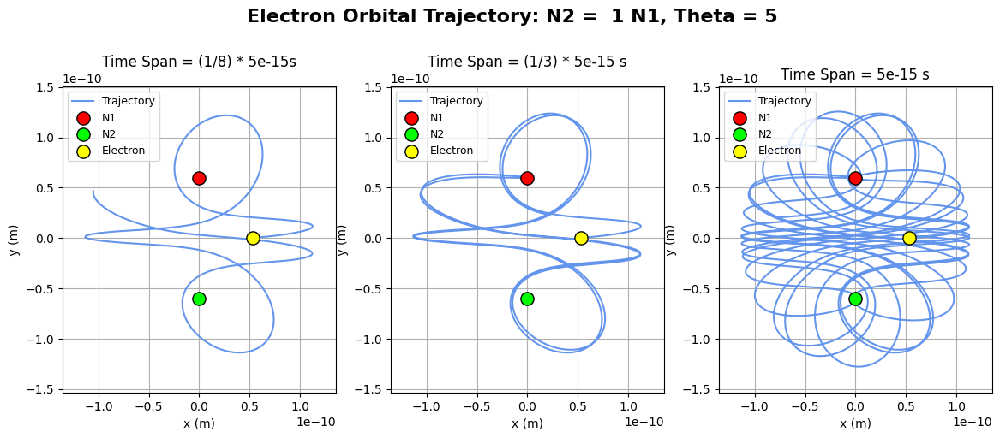

In [34]:
# Parameters to vary
n2 = 1.6e-19  # Nucleus 2 charge
angle = 5   # Launch angle in degrees
T = 5e-15 # time for simulation to run, s

sol1 = get_trajectory(n2, angle, T)
plot_trajectory(sol1, 1.25, T, 1)

**Figure 2**. The electron follows a trajectory first to $N_1$, then loops around to $N_2$. The density of the electron's trajectory is significantly higher towards the $y=0$ axis, and overall traces an ellipsoid-like shape.

**Code Block Summary**: This block simulates the electron's trajectory when $\theta = 5$. A function is defined to determine the Coulomb forces and acceleration on the electron at any given time step, which are then returned for Solve_IVP to use. Sol1 outputs the electron's positions and velocities at each time step. A graph of three subplots for the electron's trajectory is made. The three time plots represent different time spans to highlight both the path the electron takes and the overall shape it traces. 

#### Trial 2: $\theta = 20^o$

Next, we investigate electron trajectories when $N_1$ and $N_2$ have equal charges while varying $\theta$.

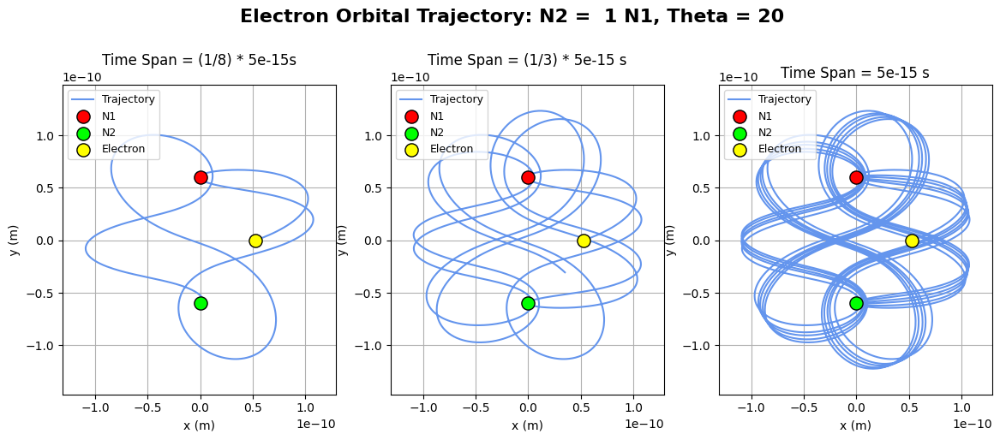

In [35]:
# Parameters to vary
n2 = 1.6e-19  # Nucleus 2 charge
angle = 20   # Launch angle in degrees
T = 0.5e-14 # time for simulation to run, s

sol1 = get_trajectory(n2, angle, T)
plot_trajectory(sol1, 1.25, T, 1)

**Figure 3**. Similar to $\theta = 20$, electron follows a trajectory first to $N_1$, then loops around to $N_2$. The cycles in the electron's path are much closer together, indicating that the oribit is more periodic.

**Code Block Summary**: This block simulates the electron's trajectory when $\theta = 20$. A function is defined to determine the Coulomb forces and acceleration on the electron at any given time step, which are then returned for Solve_IVP to use. Sol1 outputs the electron's positions and velocities at each time step. A graph of three subplots for the electron's trajectory is made. The three time plots represent different time spans to highlight both the path the electron takes and the overall shape it traces. 

#### Trial 3: $\theta = 90^o$

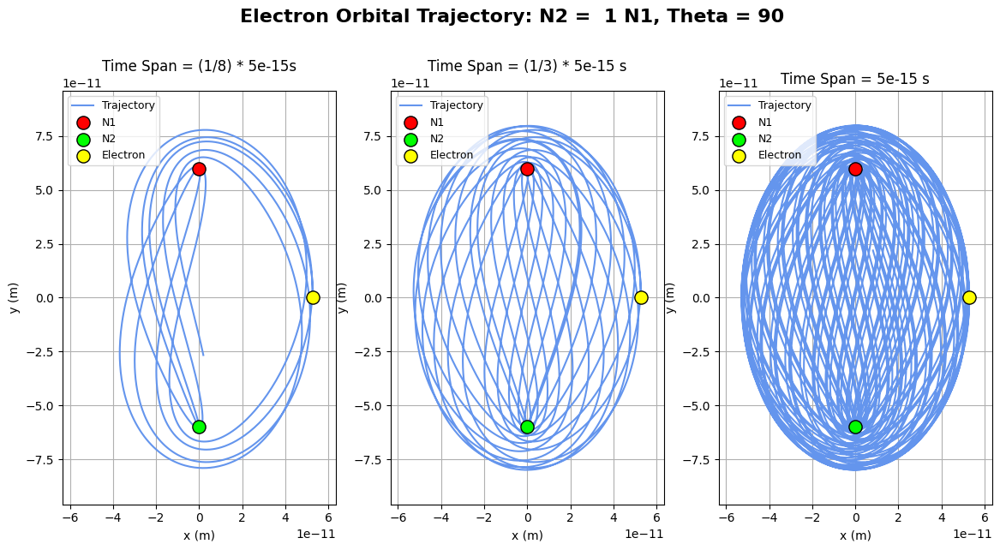

In [36]:
# Parameters to vary
n2 = 1.6e-19  # Nucleus 2 charge
angle = 90   # Launch angle in degrees
T = 0.5e-14 # time for simulation to run, s

sol1 = get_trajectory(n2, angle, T)
plot_trajectory(sol1, 1.1, T, 1)

**Figure 4**. Again, the electron follows a trajectory first to $N_1$, then loops around to $N_2$. The overall density of the electron's path is larger and the semi-major axis is much higher.

**Code Block Summary**: This block simulates the electron's trajectory when $\theta = 90$. A function is defined to determine the Coulomb forces and acceleration on the electron at any given time step, which are then returned for Solve_IVP to use. Sol1 outputs the electron's positions and velocities at each time step. A graph of three subplots for the electron's trajectory is made. The three time plots represent different time spans to highlight both the path the electron takes and the overall shape it traces. 

#### Trial 4: $\theta = 120^o$

Finally, we investigate electron trajectories when $N_1$ and $N_2$ have equal charges while varying $\theta$.

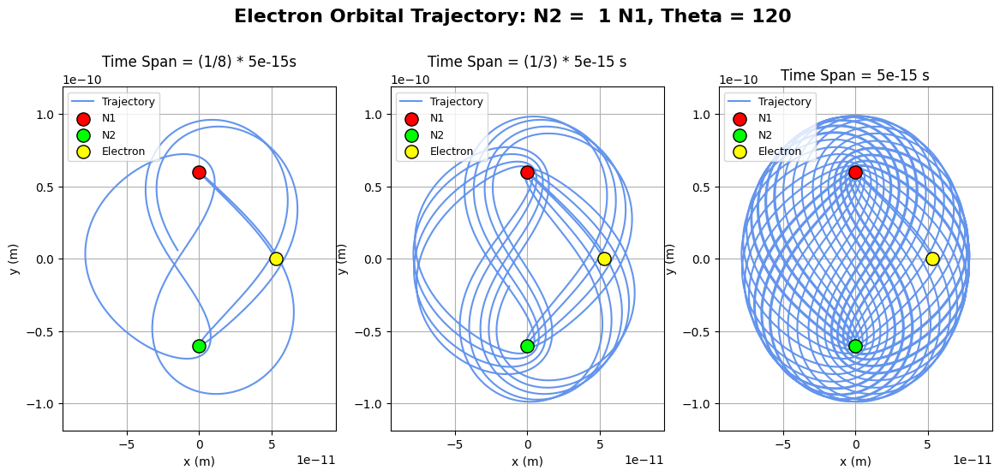

In [37]:
# Parameters to vary
n2 = 1.6e-19  # Nucleus 2 charge
angle = 120   # Launch angle in degrees
T = 0.5e-14 # time for simulation to run, s

sol1 = get_trajectory(n2, angle, T)
plot_trajectory(sol1,1.2, T, 1)

**Figure 5**. The electron follows a trajectory first to $N_1$, then loops around to $N_2$. Whiel it traces on overall ellptical shape like the others, compared to the other angles, this trajectory's ellipsoid is more spherical.

**Code Block Summary**: This block simulates the electron's trajectory when $\theta = 120$. A function is defined to determine the Coulomb forces and acceleration on the electron at any given time step, which are then returned for Solve_IVP to use. Sol1 outputs the electron's positions and velocities at each time step. A graph of three subplots for the electron's trajectory is made. The three time plots represent different time spans to highlight both the path the electron takes and the overall shape it traces. 

#### Cycle 1 Analysis 

From cycle 1, we notice the following: 

* **Ellipsoid**: Across all four trials, the electron trajectories trace an ellipsoid pattern, where the electron first loops up towards $N_1$, down towards $N_2$, and back up to $N_1$, and repeats.
* **Semi-Major Axis**: As the angle nears 90, the semimajor axis of an ellipsoid increases. This is due to the increase in the electron's vertical velocity; since the y-component of electron velocity is highest at 90 degrees, so is the y-distance the electron travels.
* **Angle**: While the angle does not change the overall shape the electron traces, we see that the "density" of the shape changes. For instance, when $\theta = 20$, the electron paths are much denser and periodic. Furthermore, when $\theta = 5$, we see a density increase along the $y=0$ axis, since the initial horizontal velocity component is large.

### Cycle 2: $N_2 = 5N_1$, Altering $\theta$ 

For our second cycle, we let $N_2 = 5N_1$, and we set $\theta = 5^o, 90^o, 135^o$. Note that these angles were chosen based on the following unique properties: 

1. $5^o$: An extremely dense, half-ellipsoid is traced, resembling a bowl. 
2. $90^o$: A half-ellipsoid with extremely low orbital drift and curved upper portion is traced.
3. $135^o$: A half-ellipsoid with a lowly curved upper portion is traced, with roughly equal electron path density everywhere.

#### Trial 1: $\theta = 5^o$

We investigate electron trajectories when $N_2 = 5N_1$ have equal charges and $\theta = 5^o$.


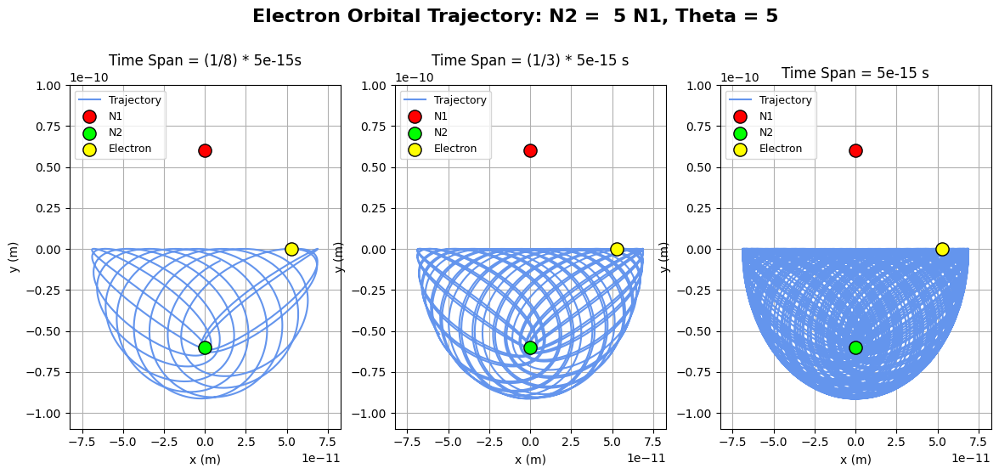

In [39]:
# Parameters to vary
n2 = 5 * 1.6e-19  # Nucleus 2 charge
angle = 5   # Launch angle in degrees
T = 0.5e-14 # time for simulation to run, s

sol1 = get_trajectory(n2, angle, T)

# Plot y vs x for theta = 5
fig, ax = plt.subplots(1, 3)
fig.set_size_inches(14, 9)
fig.suptitle(f'Electron Orbital Trajectory: N2 = {n2/n1: 0.2g} N1, Theta = {angle}', fontsize=16, fontweight='bold')
plt.subplots_adjust(top=1.2) 

ax[2].plot(sol1.y[0], sol1.y[1], label = "Trajectory",c = "cornflowerblue") 
ax[2].set_aspect("equal") 
ax[2].set_title(f"Time Span = {T} s") 
ax[2].set_xlabel("x (m)")
ax[2].set_ylabel(" y (m) ")
ax[2].grid(True) 
ax[2].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
ax[2].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
ax[2].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
ax[2].legend(loc='upper left', fontsize=9) 

# Get the one-third index
idx1 = len(sol1.t) // 3

# Plot only the first one-third of the data
ax[1].plot(sol1.y[0][:idx1], sol1.y[1][:idx1], label="Trajectory", c="cornflowerblue")
ax[1].set_aspect("equal") 
ax[1].set_title(f"Time Span = (1/3) * {T} s") 
ax[1].set_xlabel("x (m)")
ax[1].set_ylabel(" y (m) ")
ax[1].grid(True) 
ax[1].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
ax[1].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
ax[1].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
ax[1].legend(loc='upper left', fontsize=9) 

# Get the one-tenth index
idx2 = len(sol1.t) // 8

# Plot only the first one-third of the data
ax[0].plot(sol1.y[0][:idx2], sol1.y[1][:idx2], label="Trajectory", c="cornflowerblue")
ax[0].set_aspect("equal") 
ax[0].set_title(f"Time Span = (1/8) * {T}s") 
ax[0].set_xlabel("x (m)")
ax[0].set_ylabel(" y (m) ")
ax[0].grid(True) 
ax[0].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
ax[0].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
ax[0].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
ax[0].legend(loc='upper left', fontsize=9) 

# Find global min and max for x and y
x_min, x_max = 1.2 * sol1.y[0].min(), 1.2 * sol1.y[0].max()
y_min, y_max = 1.2 * sol1.y[1].min(), 1.2 * sol1.y[1].max()

# Apply limits to all subplots
for a in ax:
    a.set_xlim(x_min, x_max)
    a.set_ylim(y_min, 1e-10)

plt.show()

**Figure 6.** The electron follows a trajectory that solely orbits $N_2$. Due to this, the distance the electron travels each period is much shorter, indicating a smaller period. As a result, the density of the electron's trajectory is high, and overall traces a bowl-like shape.

**Code Block Summary**: This block simulates the electron's trajectory when $\theta = 5$. A function is defined to determine the Coulomb forces and acceleration on the electron at any given time step, which are then returned for Solve_IVP to use. Sol1 outputs the electron's positions and velocities at each time step. A graph of three subplots for the electron's trajectory is made. The three time plots represent different time spans to highlight both the path the electron takes and the overall shape it traces. 

#### Trial 2: $\theta = 90^o$

We investigate electron trajectories when $N_2 = 5N_1$ have equal charges and $\theta = 90^0$.



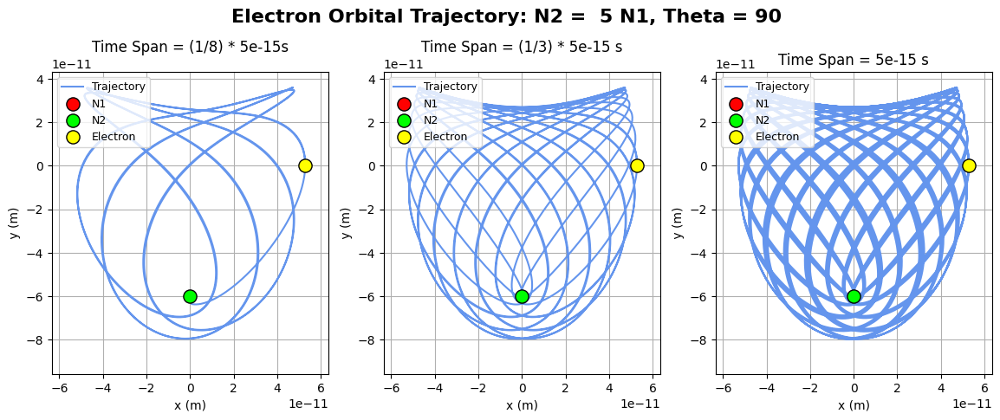

In [40]:
# Parameters to vary
n2 = 5 * 1.6e-19  # Nucleus 2 charge
angle = 90   # Launch angle in degrees
T = 0.5e-14 # time for simulation to run, s

sol1 = get_trajectory(n2, angle, T)
plot_trajectory(sol1, 1.3, T, 1)

**Figure 7**. The electron follows a trajectory solely orbiting $N_2$. However, due to its initial y-velocity component resulting from $\theta = 90$, the electron reaches closer to $N_1$ before reversing direction towards $N_2$. This results in a partial-ellipsoid like shape.

**Code Block Summary**: This block simulates the electron's trajectory when $\theta = 90$. A function is defined to determine the Coulomb forces and acceleration on the electron at any given time step, which are then returned for Solve_IVP to use. Sol1 outputs the electron's positions and velocities at each time step. A graph of three subplots for the electron's trajectory is made. The three time plots represent different time spans to highlight both the path the electron takes and the overall shape it traces. 

#### Trial 3: $\theta = 135^o$

Finally, we investigate electron trajectories when $N_2 = 5N_1$ have equal charges and $\theta = 135^0$.

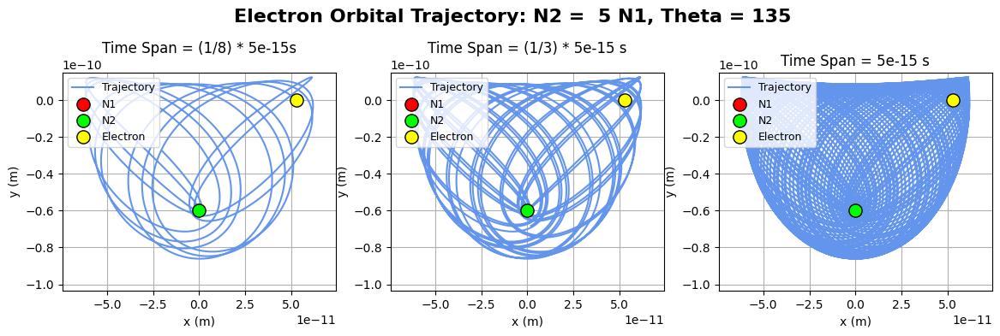

In [41]:
# Parameters to vary
n2 = 5 * 1.6e-19  # Nucleus 2 charge
angle = 135   # Launch angle in degrees
T = 0.5e-14 # time for simulation to run, s

sol1 = get_trajectory(n2, angle, T)
plot_trajectory(sol1, 1.4, T, 1)

**Figure 8**. Again, the electron follows a trajectory solely orbiting $N_2$. We see that the bowl-like curve is roughly halfway between when $\theta = 0$ and $\theta = 90$. This is expected, since the initial vertical velocity component is in between those of the two angles.

**Code Block Summary**: This block simulates the electron's trajectory when $\theta = 135$. A function is defined to determine the Coulomb forces and acceleration on the electron at any given time step, which are then returned for Solve_IVP to use. Sol1 outputs the electron's positions and velocities at each time step. A graph of three subplots for the electron's trajectory is made. The three time plots represent different time spans to highlight both the path the electron takes and the overall shape it traces. 

#### Cycle 2 Analysis 

From cycle 2, we notice the following: 

* **Partial Ellipsoid**: Across all three trials, we see that a partial ellipsoid is traced by the electron trajectories. This is due to the strong Coulomb force of $N_2$; since $N_2 = 5N_1$, the force of $N_2$ on the electron is significantly more than $N_1$, leading the electron to only orbit $N_2$. However, this coefficient of $5$ is not large enough such that the electron's orbit creates a whole ellipsoid around $N_2$, indicating to effect of $N_1$ on the electron; instead, we see that the electron traces bowl-like shapes.
* **Curve of Partial Ellipsoid**: We see that as $\theta$ nears 90 degrees, the curve of the partial ellipsoid increases, such that the electron approaches $N_1$ more closely. This can be explained due to the initial velocity components of teh electron. At $\theta = 90$, the electron's velocity is purely in the y-direction. As a result, it takes a longer time for the $N_2$ Coulomb force to decelerate the electron and reverse its direction back towards $N_2$, allowing the electron to travel closer to $N_1$ each cycle.
* **Electron Path Density**: We see that the curves traced by the electron trajectory are much denser than in cycle 1. This is due to its orbital path; due to the large $N_2$, the electron is confined to only orbit $N_2$, meaning that the distance travelled per period is less. So, for the same time span, the electron travels more periods, increasing trajectory density.

### Cycle 3: $N_2 = \frac{1}{5}N_1$, Altering $\theta$ 

For our third cycle, we let $N_2 = \frac{1}{5}N_1$, and we set $\theta = 70, 90, 135$. Note that these angles were chosen based on the following unique properties: 

1. $90^o$: A ring is traced
2. $70^o$: A ring with a much thicker width is traced due to its horizontal velocity component.
3. $135^o$: The ring diverges into a en electron orbit that traces an overall ellipsoid shape.

#### Trial 1: $\theta = 70^o$

We investigate electron trajectories when $N_2 = \frac{1}{5}N_1$ have equal charges and $\theta = 70^o$.

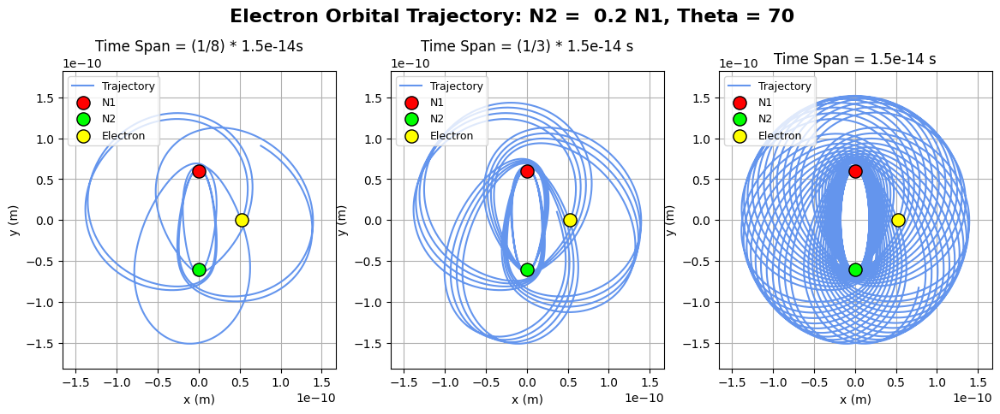

In [42]:
# Parameters to vary
n2 = 0.2 * 1.6e-19  # Nucleus 2 charge
angle = 70   # Launch angle in degrees
T = 1.5e-14 # time for simulation to run, s

sol1 = get_trajectory(n2, angle, T)
plot_trajectory(sol1, 1.3, T, 1)

**Figure 9**. Again, the electron orbits both $N_1$ and $N_2$ in a ring-like shape. We see that the ring is more spherical due to the horizontal velocity component; since there is less y component in the electron's speed, it does not travel past $N_1$ and $N_2$ as much as instead immediately reverses direction. 

**Code Block Summary**: This block simulates the electron's trajectory when $\theta = 70$. A function is defined to determine the Coulomb forces and acceleration on the electron at any given time step, which are then returned for Solve_IVP to use. Sol1 outputs the electron's positions and velocities at each time step. A graph of three subplots for the electron's trajectory is made. The three time plots represent different time spans to highlight both the path the electron takes and the overall shape it traces. 

#### Trial 2: $\theta = 90^o$

We investigate electron trajectories when $N_2 = \frac{1}{5}N_1$ have equal charges and $\theta = 90^o$.


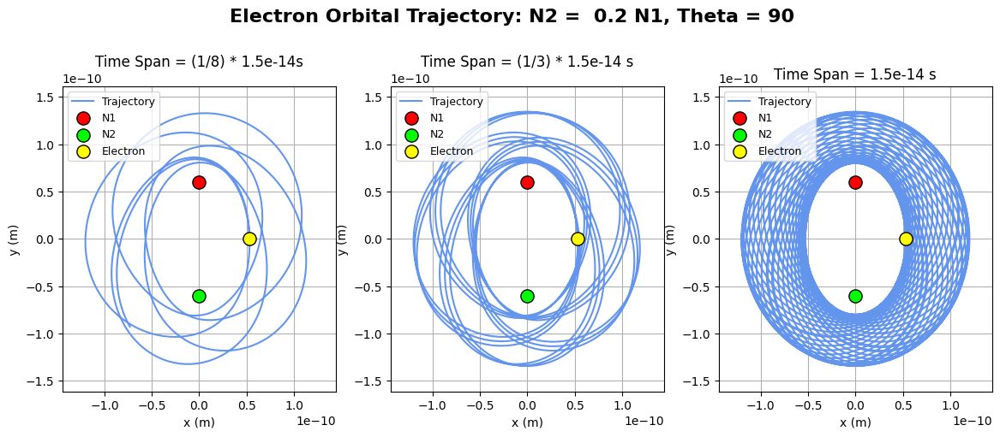

In [43]:
# Parameters to vary
n2 = 0.2 * 1.6e-19  # Nucleus 2 charge
angle = 90   # Launch angle in degrees
T = 1.5e-14 # time for simulation to run, s

sol1 = get_trajectory(n2, angle, T)
plot_trajectory(sol1, 1.25, T, 1)

**Figure 10.** The electron follows a trajectory that solely orbits both $N_1$ and $N_2$. Unlike Cycles 1 and 2, the path that the electron traces is ring-like, where it only travels outside a 2-dimensional ellipse. 

**Code Block Summary**: This block simulates the electron's trajectory when $\theta = 90$. A function is defined to determine the Coulomb forces and acceleration on the electron at any given time step, which are then returned for Solve_IVP to use. Sol1 outputs the electron's positions and velocities at each time step. A graph of three subplots for the electron's trajectory is made. The three time plots represent different time spans to highlight both the path the electron takes and the overall shape it traces. 

#### Trial 3: $\theta = 135^o$

Finally, we investigate electron trajectories when $N_2 = \frac{1}{5}N_1$ have equal charges and $\theta = 135^0$.

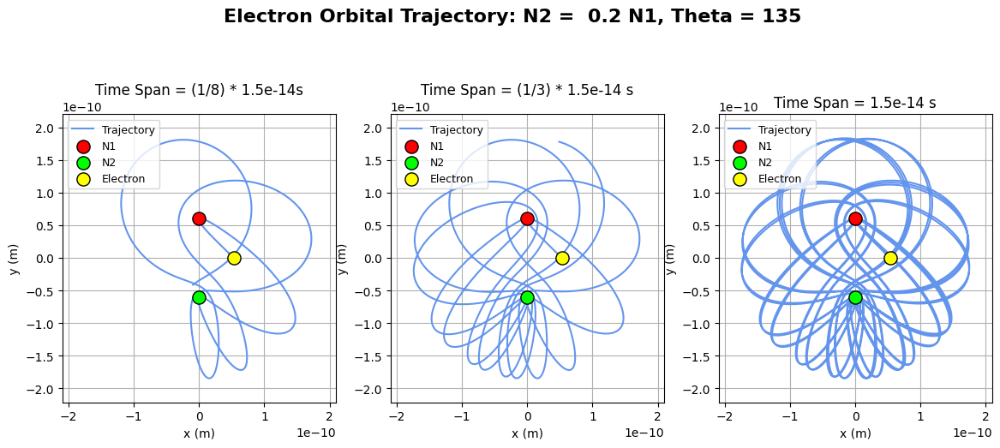

In [44]:
# Parameters to vary
n2 = 0.2 * 1.6e-19  # Nucleus 2 charge
angle = 135  # Launch angle in degrees
T = 1.5e-14 # time for simulation to run, s

sol1 = get_trajectory(n2, angle, T)
plot_trajectory(sol1, 1.2, T, 1)

**Figure 11**. The electron traces an elliptical-like journey in a chaotic manner/ The lack of enough vertical velocity deters the electron to move past each proton before reversing direction in a ring shape.

**Code Block Summary**: This block simulates the electron's trajectory when $\theta = 135$. A function is defined to determine the Coulomb forces and acceleration on the electron at any given time step, which are then returned for Solve_IVP to use. Sol1 outputs the electron's positions and velocities at each time step.

#### Cycle 3 Analysis 

From cycle 3, we notice the following: 

* **Ring Shape**: When $\theta$ is close to 90, we see that the electron traces a ring-like shape. This is due to the large y-velocity component; there is enough vertical speed for the electron to travel past the protons before reversing direction. This behavior is only seen when $N_2$ has a small nucleic charge, reducing its Coulomb force on the electron. As $\theta$ moves away from 90, the ring thickens due to the decrease in y-velocity. 
* **Diverging from a Ring**: Eventually, when $\theta$ is no longer near 90 degrees, we see that the electron no longer traces a ring-like shape, and instead establishes a pattern similar to what is seen in Cycle 2.

### Cycle 4: $N_2 = 100N_1$, Altering $\theta$ 

For our final cycle, we let $N_2 = 100N_1$, and we set $\theta = 90, 45,20$. Note that these angles were chosen to show the range of drifts the electron experiences when orbiting a nuclei with charge $100N_1$.

In [45]:
def get_trajectory(n2, angle, T):
    # Initial Velocity
    v0 = 2.18e6  # initial velocity (m/s)  
    theta = math.radians(angle) #convert angle to radians, rad
    vx0 = math.cos(theta) * v0  # initial x velocity (m/s)
    vy0 = math.sin(theta) * v0  # initial y velocity (m/s)
    state0 = (r0, 0, vx0, vy0)  # (x0, y0, vx0, vy0) (m,m,m/s,m/s)

    t_span = (0, T) # span for simulation to run 
    

    # Nuclei coordinates
    # We define the coordinate (0,0) to be the halfway point between N1 and N2
    distance = 1.2 * 10**(-10) #vertical distance between two nuclei, m
    y1 = distance / 2  # N1 y coordinate, m 
    x1 = 0             # N1 x coordinate, m
    y2 = -distance / 2 # N2 x coordinate, m
    x2 = 0             # N2 y coordinate, m

    # Get your solution from solve_ivp    
    sol1 = solve_ivp(diff_eqns, t_span, state0, rtol=1e-9, atol=1e-9) 
    return sol1

# Define your diff_eqns function
def diff_eqns(t, state):
    x, y, vx, vy = state #state variables in timestep, m, m, m/s, m/s

    
    r1x = x - x1 #x distance between electron & N1, m
    r1y = y - y1 #y distance between electron & N1, m
    r1 = np.sqrt(r1x**2+r1y**2) #distance between N1 and electron

    r2x = x - x2 #x distance between electron & N2, m
    r2y = y - y2 #y distance between electron & N2, m 
    r2 = np.sqrt(r2x**2+r2y**2) #distance between N2 and electron
    

    # Calculate the magnitude of the force 

    # Calculate force & acceleration components for N1
    fx1 = k * e * n1 * r1x / r1**3
    fy1 = k * e * n1 * r1y / r1**3

    # Calculate force & acceleration components for N1
    fx2= k * e * n2 * r2x / r2**3
    fy2 = k * e * n2 * r2y / r2**3 

    fx = fx1 + fx2 
    fy = fy1 + fy2

    # Calculate acceleration
    accx = fx/me 
    accy = fy/me  

    # Return differentials
    return vx, vy, accx, accy 

def plot_trajectory1(sol1, top, T, c):
    # Plot y vs x for theta = 5
    fig, ax = plt.subplots(1, 3)
    fig.set_size_inches(14, 9)
    fig.suptitle(f'Electron Orbital Trajectory: N2 = {n2/n1: 0.2g} N1, Theta = {angle}', fontsize=16, fontweight='bold')
    plt.subplots_adjust(top=top) 

    ax[2].plot(sol1.y[0], sol1.y[1], label = "Trajectory",c = "cornflowerblue") 
    ax[2].set_aspect("equal") 
    ax[2].set_title(f"Time Span = {T} s") 
    ax[2].set_xlabel("x (m)")
    ax[2].set_ylabel(" y (m) ")
    ax[2].grid(True) 
    ax[2].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
    ax[2].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
    ax[2].legend(loc='upper left', fontsize=9) 

    # Get the one-third index
    idx1 = len(sol1.t) // 3

    # Plot only the first one-third of the data
    ax[1].plot(sol1.y[0][:idx1], sol1.y[1][:idx1], label="Trajectory", c="cornflowerblue")
    ax[1].set_aspect("equal") 
    ax[1].set_title(f"Time Span = (1/3) * {T} s") 
    ax[1].set_xlabel("x (m)")
    ax[1].set_ylabel(" y (m) ")
    ax[1].grid(True) 
    ax[1].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
    ax[1].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
    ax[1].legend(loc='upper left', fontsize=9) 

    # Get the one-tenth index
    idx2 = len(sol1.t) // 8

    # Plot only the first one-third of the data
    ax[0].plot(sol1.y[0][:idx2], sol1.y[1][:idx2], label="Trajectory", c="cornflowerblue")
    ax[0].set_aspect("equal") 
    ax[0].set_title(f"Time Span = (1/8) * {T}s") 
    ax[0].set_xlabel("x (m)")
    ax[0].set_ylabel(" y (m) ")
    ax[0].grid(True) 
    ax[0].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
    ax[0].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
    ax[0].legend(loc='upper left', fontsize=9) 

    # Find global min and max for x and y
    x_min, x_max = 1.2 * sol1.y[0].min(), 1.2 * sol1.y[0].max()
    y_min, y_max = 1.2 * sol1.y[1].min(), 1.2 * sol1.y[1].max()

    # Apply limits to all subplots
    for a in ax:
        a.set_xlim(x_min, x_max)
        a.set_ylim(y_min, c * y_max)

    plt.show()

**Code Block Summary**: This block creates three subplots for the electron's trajectory. The three time plots represent different tiem spans to highlight both the path the electron takes and the overall shape it traces. 

#### Trial 1: $\theta = 45^o$

We investigate electron trajectories when $N_2 = 100N_1$ have equal charges and $\theta = 90^o$.

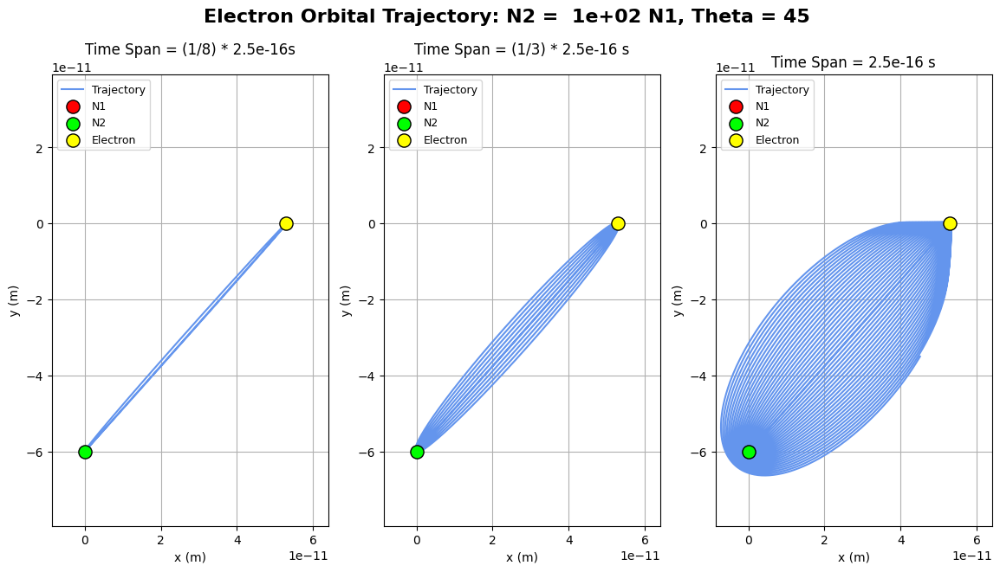

In [46]:
# Parameters to vary
n2 = 100 * 1.6e-19  # Nucleus 2 charge
angle = 45  # Launch angle in degrees
T = 2.5e-16 # time for simulation to run, s

sol1 = get_trajectory(n2, angle, T)
plot_trajectory(sol1, 1.1, T, 80)


**Figure 12.** The electron follows a trajectory that solely orbits $N_2$. Unlike Cycle 2, since the force on $N_2$ is magnitudes larger tha $N_1$, the effect on $N_1$ is negligible, making teh electron follow an elliptical path around the electron. Note that due to the initial conditions of the electron, (such as velocity), the electron's paths still drift, forming a shape resemblimg a thick rubber band. 

**Code Block Summary**: This block simulates the electron's trajectory when $\theta = 45$. A function is defined to determine the Coulomb forces and acceleration on the electron at any given time step, which are then returned for Solve_IVP to use. Sol1 outputs the electron's positions and velocities at each time step.

#### Trial 2: $\theta = 90^o$

We investigate electron trajectories when $N_2 = 100N_1$ have equal charges and $\theta = 90^o$.

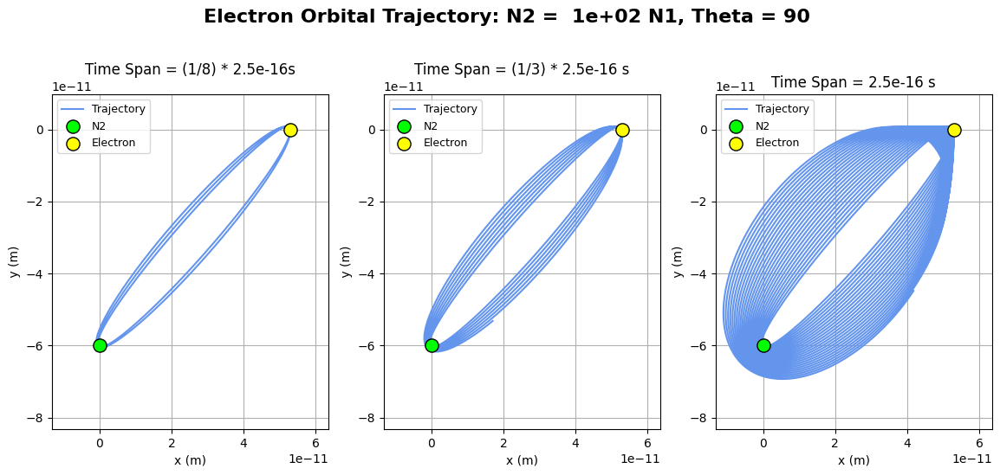

In [47]:
# Parameters to vary
n2 = 100 * 1.6e-19  # Nucleus 2 charge
angle = 90   # Launch angle in degrees
T = 2.5e-16 # time for simulation to run, s

sol1 = get_trajectory(n2, angle, T)
plot_trajectory1(sol1, 1.2, T, 10) 

**Figure 13**. Again, the electron orbits both $N_2$ in an ellipse. However, we notice that the elliptical "hole" in the previous trial is not present anymore. This indicates that the drift velocity of every period is lower. 

**Code Block Summary**: This block simulates the electron's trajectory when $\theta = 90$. A function is defined to determine the Coulomb forces and acceleration on the electron at any given time step, which are then returned for Solve_IVP to use. Sol1 outputs the electron's positions and velocities at each time step.

#### Trial 3: $\theta = 20$

We investigate electron trajectories when $N_2 = 100N_1$ have equal charges and $\theta = 20^o$.

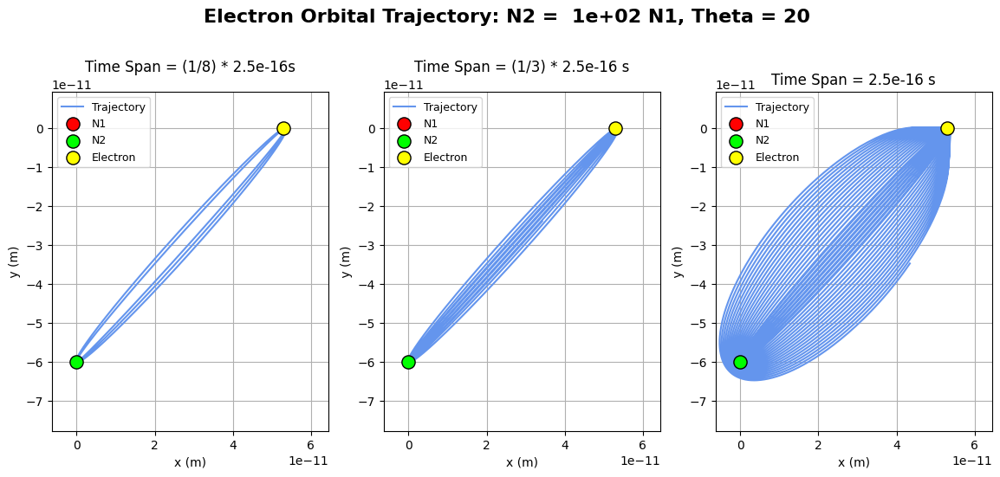

In [48]:
# Parameters to vary
n2 = 100 * 1.6e-19  # Nucleus 2 charge
angle = 20  # Launch angle in degrees
T = 2.5e-16 # time for simulation to run, s

sol1 = get_trajectory(n2, angle, T)
plot_trajectory(sol1, 1.2, T, 80)

**Figure 14**. Again, the electron orbits both $N_2$ in an ellipse. However, the electron experiences less drift to the the the angle. 

**Code Block Summary**: This block simulates the electron's trajectory when $\theta = 20$. A function is defined to determine the Coulomb forces and acceleration on the electron at any given time step, which are then returned for Solve_IVP to use. Sol1 outputs the electron's positions and velocities at each time step.

#### Cycle 4 Analysis 

From cycle 4, we notice the following: 

* **Flat Ellipsoid**: The electron only orbits $N_2$ in an elliptic shape due to its large force compared to $N_1$. Crucially, the electron's trajectory is different from that of cycle 1; while electrons form a full, 3-dimensional ellipsoid in cycle 1, the electron creates a flat, rubber-band-like shape in cycle 4. This is due to the drift the electron experiences across time
* **Symmetric electron path**: Unlike in the other cycles, cycle 4 results show how the electron's trajectory every period is unchaotic; its 3-dimensional shape is due not to the variations within one period, but due to the electron's drift. 
* **Drift**: As we alter the angle, the electron's trajectory shift changes, due to the respective y and x components of initial velocity. Specifically, as $\theta$ moves away from 90 degrees, the drift decreases. 

From Part I of analysis, we qualitatively show that there are for main categories of shapes traced by electron orbits: full ellipsoids, partial ellipsoid, rings, and "rubber bands". In the next section, we quantify orbital stability by conducting a discrete longitudinal phase space analysis.

## Part II: Discrete Phase-Space Analysis to Detect Stable Orbits 

In Part II, we add additional event detection to quantitatively detect stable orbits across a phase space of $N_2$ and $\theta$. As detailed in "Overview", we define three categories of orbits: 

1. **Stable Periodic**: These orbits have relative standard deviations of under 10%, and do not collide with either nucleus. 
2. **Unstable/Quasi-Periodic**: These orbits have relative deviations of over 10%, but also do not collide with either nucleus. 
3. **Collision**: These orbits collide with at least 1 of the 2 nuclei. As a result, periodicity is not checked.

### Programming for stability detection

To determine stability, we must check for (1) periodicity and (2) electron-proton collision. To check for periodicity, we create a function that calculates the negative distance between the electron and its original position for each time step. We then use SciPy’s “find_peaks” function to determine the local minima of each of the distances; since the function finds the local maxima, we insert the negative of each distance value into an array into "find_peaks" to determine the local minima. The times of each of these distances is then indexed out of the solution array outputted by Solve_IVP, and the periods are calculated by subtracting the times from each other. The relative standard deviation is then calculated and compared to the 5% threshold. 

For electron-proton collision, we create functions to calculate the distance between the electron and both protons at all time-steps. Each distance is then compared with the distance threshold of 8.5e-16m to determine if an electron-proton collision occurs.

### Parameters 

We set each simulation to run for $2.5 e -15$ s; this was the longest time the code could run for the phase space to output results in less than 1.5 hours. We run 9000 simulations in our phase space domains of $0 \leq \theta \leq 90^o$ and $\frac{1}{100}N_1 \leq N_2 \leq 100N_1$ by creating a 90-element linear space for $\theta$ and a 100-element linear space for $N_2$. As a reminder, $\theta = 0$ refers to the initial velocity vector parallel with the positive x-axis, and $\theta = 90$ refers to the initial velocity vector parallel with the line defined by $N_1$ and $N_2$. 

### Detecting Stable Orbits 

The code below checks for stable orbits across the chosen phase space.

In [14]:
# SIMULATION CODE
# Import useful libraries
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
from scipy.signal import find_peaks
import math 
import time

# Fixed Constants
k = 8.99e9            # Coulomb constant, N·m²/C²
e = -1.6e-19          # Electron charge magnitude, C
n1 = 1.6e-19          # Nucleus 1 charge 
me = 9.109e-31        # Electron mass, kg
r0 = 5.29e-11         # Bohr radius, m 

# Orbital time
T = 2.5e-15  # time for simulation to run, s

# Nuclei coordinates
# We define the coordinate (0,0) to be the halfway point between N1 and N2
distance = 1.2e-10  # vertical distance between two nuclei, m
y1 = distance / 2   # N1 y coordinate, m 
x1 = 0              # N1 x coordinate, m
y2 = -distance / 2  # N2 x coordinate, m
x2 = 0              # N2 y coordinate, m

# Initial Velocity
v0 = 2.18e6  # initial velocity (m/s)

# Define your diff_eqns function
def diff_eqns(t, state):
    x, y, vx, vy = state  # state variables in timestep, m, m, m/s, m/s
    
    r1x = x - x1  # x distance between electron & N1, m
    r1y = y - y1  # y distance between electron & N1, m
    r1 = np.sqrt(r1x**2 + r1y**2)  # distance between N1 and electron
    r2x = x - x2  # x distance between electron & N2, m
    r2y = y - y2  # y distance between electron & N2, m 
    r2 = np.sqrt(r2x**2 + r2y**2)  # distance between N2 and electron
    
    # Avoid singularities
    r1 = max(r1, 1e-20)
    r2 = max(r2, 1e-20)
    
    # Calculate force & acceleration components for N1
    fx1 = k * e * n1 * r1x / r1**3
    fy1 = k * e * n1 * r1y / r1**3
    # Calculate force & acceleration components for N2
    fx2 = k * e * n2 * r2x / r2**3
    fy2 = k * e * n2 * r2y / r2**3 
    fx = fx1 + fx2 
    fy = fy1 + fy2
    # Calculate acceleration
    accx = fx / me 
    accy = fy / me  
    # Return differentials
    return vx, vy, accx, accy

**Code Block Summary**: This above code sets the initial constants used in the rest of the simulation. It also defines the differential equations needed to be inputted into Solve_IVP, including vertical velocity, horizontal velocity, vertical acceleration, and horizontal acceleration. These were calculated using the equation for Coulomb's force.

In [13]:
# NEW DETECTION FUNCTIONS

def check_collision(sol, collision_threshold=8.5e-16):
    # Calculate distances to each nucleus at all time steps
    r1 = np.sqrt((sol.y[0] - x1)**2 + (sol.y[1] - y1)**2)
    r2 = np.sqrt((sol.y[0] - x2)**2 + (sol.y[1] - y2)**2)
    
    # Check collision with nucleus 1
    collision_n1_indices = np.where(r1 < collision_threshold)[0]
    # Check collision with nucleus 2
    collision_n2_indices = np.where(r2 < collision_threshold)[0]
    collided = False
    
    if len(collision_n1_indices) > 0:
        collided = True
    elif len(collision_n2_indices) > 0:
        collided = True
    return collided

**Code Block Summary**: The above code defines a function that checks for electron-proton collisions. For each time step, the function calculates the distance between the electron and its original position. Using this, it compares each difference to the collision threshold to output a boolean of whether the electron experiences a collision.

In [12]:
def check_periodicity(sol, rel_std_threshold=0.10):
    if len(sol.t) < 10:
        return False, None
    
    # Calculate distance from starting position
    x0, y0 = sol.y[0][0], sol.y[1][0]
    distances = np.sqrt((sol.y[0] - x0)**2 + (sol.y[1] - y0)**2)
    
    # Find local minima (returns to starting region)
    try:
        peaks, _ = find_peaks(-distances, distance=len(distances)//20)
    except:
        return False, None
    
    if len(peaks) < 2:
        return False, None
    
    # Calculate periods
    periods = np.diff(sol.t[peaks])
    
    if len(periods) < 2:
        return False, None
    
    # Calculate relative standard deviation
    period_mean = np.mean(periods)
    period_std = np.std(periods)
    period_std_rel = period_std / period_mean
    
    # Check if variation is within threshold
    is_periodic = period_std_rel < rel_std_threshold
    
    return is_periodic

**Code Block Summary**: The above code defines a function that checks for periodicity. For each time step, the function calculates the distance between the electron and its original position. Using this, the local minima of the distances are calculated, and the times for each of these "peaks" are found. The difference between each time is then calculated to be the "period" of each cycle, and the relative standard deviation is calculated and compared to the threshold relative standard deviation.

In [11]:
def analyze_single_orbit(angle, n2_value):
    try:
        # Set up initial conditions
        theta = math.radians(angle)
        vx0 = math.cos(theta) * v0
        vy0 = math.sin(theta) * v0
        state0 = (r0, 0, vx0, vy0)
        
        # Set n2 as global for diff_eqns to use
        global n2
        n2 = n2_value
        
        # Run simulation
        t_span = (0, T)
        sol = solve_ivp(diff_eqns, t_span, state0, 
                       rtol=1e-9, atol=1e-9, 
                       max_step=1e-17)
        
        # Check for collision first
        collided = check_collision(sol)
        if collided:
            return 2  # Collision
        
        # Check periodicity
        is_periodic = check_periodicity(sol)
        if is_periodic:
            return 0  # Stable periodic
        else:
            return 1  # Unstable
            
    except Exception as e:
        return 3  # Error

**Code Block Summary**: The above code integrates the previous two functions to analyze a single orbit. The code is the same as the code used in Part I, except it incorporates the collision and periodicity checks into a single function.

In [10]:
# PHASE SPACE SCAN 

def scan_phase_space_2d(n_theta=30, n_n2=40):
    print("="*70)
    print("2D PHASE SPACE SCAN: THETA vs N2")
    print("="*70)
    
    # Phase space ranges
    theta_range = np.linspace(0, 90, n_theta)  # 0 to 90 degrees
    n2_n1_ratios = np.logspace(-2, 2, n_n2)    # 0.01 to 100 (N1/100 to 100*N1)
    n2_range = n1 * n2_n1_ratios
    
    print(f"Theta axis: {n_theta} points from 0° to 90°")
    print(f"N2 axis: {n_n2} points from N1/100 to 100*N1")
    print(f"  N2/N1 range: {n2_n1_ratios[0]:.3f} to {n2_n1_ratios[-1]:.1f}")
    print(f"  N2 range: {n2_range[0]:.3e} to {n2_range[-1]:.3e} C")
    print(f"Total simulations: {n_theta * n_n2}")
    print(f"Simulation time per orbit: {T:.2e} s")
    print("="*70 + "\n")
    
    # Initialize results grid
    results_grid = np.zeros((n_n2, n_theta))
    
    total_sims = n_theta * n_n2
    sim_count = 0
    start_time = time.time()
    
    # Run simulations
    for i, n2_val in enumerate(n2_range):
        print(f"\nN2/N1 = {n2_val/n1:.3f} ({i+1}/{n_n2})")
        for j, angle_val in enumerate(theta_range):
            sim_count += 1
            
            # Progress update every 5 simulations
            if sim_count % 5 == 0 or sim_count == total_sims:
                elapsed = time.time() - start_time
                rate = sim_count / elapsed if elapsed > 0 else 0
                eta = (total_sims - sim_count) / rate if rate > 0 else 0
                print(f"  Progress: {sim_count}/{total_sims} ({100*sim_count/total_sims:.1f}%) "
                      f"| Rate: {rate:.1f} sim/s | ETA: {eta:.0f}s", end='\r')
            
            # Analyze this configuration
            status = analyze_single_orbit(angle_val, n2_val)
            results_grid[i, j] = status
    
    elapsed = time.time() - start_time
    print(f"\n\nScan completed in {elapsed:.1f}s ({elapsed/60:.1f} min)")
    print(f"Average: {elapsed/total_sims:.2f}s per simulation\n")
    
    # Print statistics
    n_stable = np.sum(results_grid == 0)
    n_unstable = np.sum(results_grid == 1)
    n_collision = np.sum(results_grid == 2)
    n_error = np.sum(results_grid == 3)
    
    print("Results Summary:")
    print(f"  Stable periodic:      {n_stable:4d} ({100*n_stable/total_sims:.1f}%)")
    print(f"  Unstable/quasi:       {n_unstable:4d} ({100*n_unstable/total_sims:.1f}%)")
    print(f"  Collision:            {n_collision:4d} ({100*n_collision/total_sims:.1f}%)")
    print(f"  Error:                {n_error:4d} ({100*n_error/total_sims:.1f}%)")
    print("="*70 + "\n")
    
    return results_grid, theta_range, n2_range

**Code Block Summary**: The above code incorporates the previous code block to scan the entire phase space. It includes a progress check, where the progress rate is updated every 5 simulations. At the end, the function returns an array of all the results for each of the 9000 simulations.

In [9]:
# Plotting results

def plot_phase_space_2d(results_grid, theta_range, n2_range):
    from matplotlib.colors import ListedColormap
    
    fig = plt.figure(figsize=(14, 10))
    
    # Create meshgrid
    theta_grid, n2_grid = np.meshgrid(theta_range, n2_range)
    n2_n1_grid = n2_grid / n1
    
    # Define colormap
    colors = ["#6420a6", "#b5318c", "#f48d47", "#f6e724"]
    cmap = ListedColormap(colors)
    labels = ['Stable Periodic', 'Unstable/Quasi-periodic', 'Collision', 'Error']
    
    # Main 2D phase space plot
    ax = fig.add_subplot(111)
    
    im = ax.pcolormesh(theta_grid, n2_n1_grid, results_grid, 
                       cmap=cmap, vmin=0, vmax=3, shading='auto',
                       edgecolors='face', linewidth=0)
    
    ax.set_xlabel('Initial Velocity Angle θ (degrees)', fontsize=14, fontweight='bold')
    ax.set_ylabel('Charge Ratio N2/N1', fontsize=14, fontweight='bold')
    ax.set_title('Phase Space: Orbital Stability Map\nθ ∈ [0°, 90°], N2 ∈ [N1/100, 100×N1] \n V0 = 2.18e6 m/s (Fixed) ', 
                 fontsize=16, fontweight='bold', pad=20)
    
    # Use log scale for N2/N1
    ax.set_yscale('log')
    
    # Set y-axis limits and ticks
    ax.set_ylim([0.01, 100])
    ax.set_yticks([0.01, 0.1, 1, 10, 100])
    ax.set_yticklabels(['0.01', '0.1', '1', '10', '100'])
    
    # Set x-axis limits
    ax.set_xlim([0, 90])
    
    # Add grid
    ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.5, color='gray')
    
    # Add reference line at N2 = N1
    ax.axhline(y=1, color='white', linestyle='--', linewidth=2.5, 
               alpha=0.8, label='N2 = N1 (equal charges)')
    
    # Add reference lines for key angles
    ax.axvline(x=0, color='white', linestyle=':', linewidth=1.5, alpha=0.5)
    ax.axvline(x=45, color='white', linestyle=':', linewidth=1.5, alpha=0.5)
    ax.axvline(x=90, color='white', linestyle=':', linewidth=1.5, alpha=0.5)
    
    # Create legend for stability regions
    from matplotlib.patches import Patch
    
    # Add colorbar
    cbar = plt.colorbar(im, ax=ax, ticks=[0.375, 1.125, 1.875, 2.625], 
                       pad=0.02, aspect=30)
    cbar.ax.set_yticklabels(labels, fontsize=10)
    cbar.ax.tick_params(size=0)
    
    # Add text annotations for interesting regions
    ax.text(5, 0.015, 'Low angle\nLow charge', fontsize=9, 
           bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    ax.text(85, 80, 'High angle\nHigh charge', fontsize=9, ha='right',
           bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    plt.tight_layout()
    plt.savefig('phase_space_2d_theta_vs_n2.png', dpi=300, bbox_inches='tight')
    print("Plot saved as 'phase_space_2d_theta_vs_n2.png'")
    plt.show()
    
    return fig

**Code Block Summary**: Given the grid of results calculated from the previous block, this function plots all the data into one graph and returns the figure.

### Examples of Periodicity Check 

As an example, below is a histogram of periods generated by the periodicity check function, when $\theta = 35$ and $N_2 = 0.8N_1$. **This is a stable orbit**.


ORBITAL PERIOD STATISTICS
Number of complete orbits: 15
Mean period: 3.08e-16 s
Standard deviation: 3.61e-19 s
Relative std dev: 0.12%
Minimum period: 3.07e-16 s
Maximum period: 3.08e-16 s
Range: 1.42e-18 s 

Is the orbit periodic? Yes


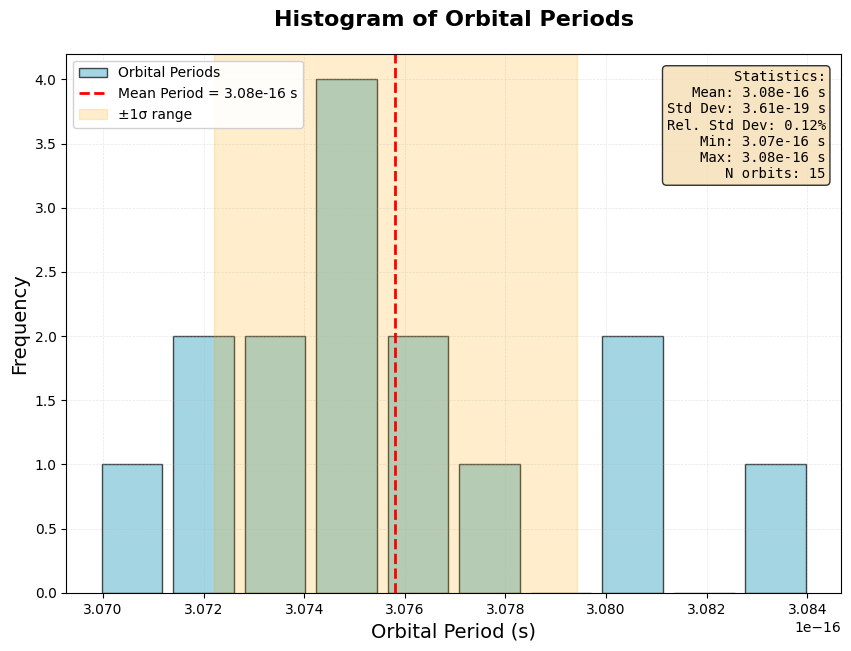

In [ ]:
# Set up initial conditions


angle = 35
theta = math.radians(angle)
vx0 = math.cos(theta) * v0
vy0 = math.sin(theta) * v0
state0 = (r0, 0, vx0, vy0) 

T = 5e-15  # time for simulation to run, s

# Set n2 as global for diff_eqns to use
n2 = 0.8 * 1.6e-19

# Run simulation
t_span = (0, T)
sol = solve_ivp(diff_eqns, t_span, state0, 
rtol=1e-9, atol=1e-9, 
max_step=1e-17) 

# Check Periodicity
is_periodic = check_periodicity(sol)

# Generate Graph of Periods  
# Calculate distance from starting position
x0, y0 = sol.y[0][0], sol.y[1][0]
distances = np.sqrt((sol.y[0] - x0)**2 + (sol.y[1] - y0)**2)

# Find local minima (returns to starting region)
peaks, _ = find_peaks(-distances, distance=len(distances)//20)

# Calculate periods
periods = np.diff(sol.t[peaks])

# Calculate relative standard deviation
period_mean = np.mean(periods)
period_std = np.std(periods)
period_std_rel = period_std / period_mean 

n = []
for i in range(len(periods)):
    n.append(i+1)



# Make histogram of periods
figsize = (10, 7)
plt.figure(figsize=figsize)

# Create histogram
counts, bins, patches = plt.hist(periods, bins=10, color="#7cc4d6", 
                                  rwidth=0.85, label='Orbital Periods', 
                                  edgecolor='black', alpha=0.7)
# Graph vertical line at mean period
plt.axvline(x=period_mean, color='red', linestyle='--', linewidth=2, 
            label=f'Mean Period = {period_mean:.2e} s') 



stats_text = f'Statistics:\n' \
             f'Mean: {period_mean:.2e} s\n' \
             f'Std Dev: {period_std:.2e} s\n' \
             f'Rel. Std Dev: {period_std_rel:.2%}\n' \
             f'Min: {np.min(periods):.2e} s\n' \
             f'Max: {np.max(periods):.2e} s\n' \
             f'N orbits: {len(periods)}'

props = dict(boxstyle='round', facecolor='wheat', alpha=0.8)
plt.text(0.98, 0.97, stats_text, transform=plt.gca().transAxes, 
         fontsize=10, verticalalignment='top', horizontalalignment='right',
         bbox=props, family='monospace')

# Grid for easier reading
plt.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)

plt.axvspan(period_mean - period_std, period_mean + period_std, 
            alpha=0.2, color='orange', label='±1σ range')

# Legend
plt.legend(loc='upper left', fontsize=10, framealpha=0.9)

plt.title('Histogram of Orbital Periods', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Orbital Period (s)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

print("\n" + "="*50)
print("ORBITAL PERIOD STATISTICS")
print("="*50)
print(f"Number of complete orbits: {len(periods)}")
print(f"Mean period: {period_mean:.2e} s")
print(f"Standard deviation: {period_std:.2e} s")
print(f"Relative std dev: {period_std_rel:.2%}")
print(f"Minimum period: {np.min(periods):.2e} s")
print(f"Maximum period: {np.max(periods):.2e} s")
print(f"Range: {np.max(periods) - np.min(periods):.2e} s \n")
print(f"Is the orbit periodic? {'Yes' if is_periodic else 'No'}")
print("="*50)


**Figure 15**. A roughly-Gaussian distribution is seen for the orbital periods of a stable orbit. standard deviation is 0.12%.

On the contrary, below is a histogram of periods generated by the periodicity check function, when $\theta = 40$ and $N_2 = 50N_1$. **This is a quasi-periodic, unstable orbit**.


ORBITAL PERIOD STATISTICS
Number of complete orbits: 18
Mean period: 2.76e-16 s
Standard deviation: 6.13e-17 s
Relative std dev: 22.21%
Minimum period: 1.72e-16 s
Maximum period: 3.55e-16 s
Range: 1.83e-16 s 

Is the orbit periodic? No


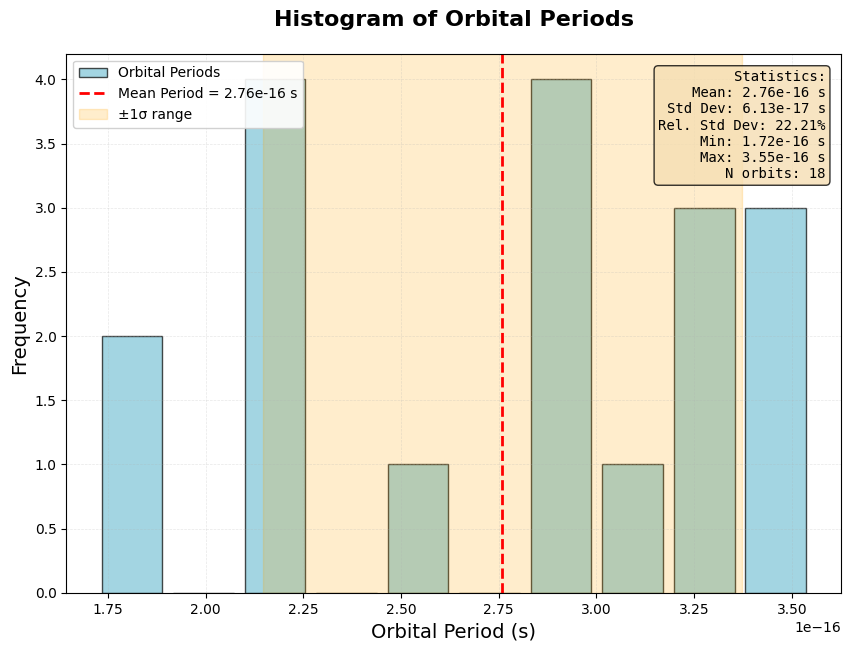

In [23]:
# Set up initial conditions


angle = 40
theta = math.radians(angle)
vx0 = math.cos(theta) * v0
vy0 = math.sin(theta) * v0
state0 = (r0, 0, vx0, vy0) 

T = 5e-15  # time for simulation to run, s

# Set n2 as global for diff_eqns to use
n2 = 60 * 1.6e-19

# Run simulation
t_span = (0, T)
sol = solve_ivp(diff_eqns, t_span, state0, 
rtol=1e-9, atol=1e-9, 
max_step=1e-17) 

# Check Periodicity
is_periodic = check_periodicity(sol)

# Generate Graph of Periods  
# Calculate distance from starting position
x0, y0 = sol.y[0][0], sol.y[1][0]
distances = np.sqrt((sol.y[0] - x0)**2 + (sol.y[1] - y0)**2)

# Find local minima (returns to starting region)
peaks, _ = find_peaks(-distances, distance=len(distances)//20)

# Calculate periods
periods = np.diff(sol.t[peaks])

# Calculate relative standard deviation
period_mean = np.mean(periods)
period_std = np.std(periods)
period_std_rel = period_std / period_mean 

n = []
for i in range(len(periods)):
    n.append(i+1)



# Make histogram of periods
figsize = (10, 7)
plt.figure(figsize=figsize)

# Create histogram
counts, bins, patches = plt.hist(periods, bins=10, color="#7cc4d6", 
                                  rwidth=0.85, label='Orbital Periods', 
                                  edgecolor='black', alpha=0.7)
# Graph vertical line at mean period
plt.axvline(x=period_mean, color='red', linestyle='--', linewidth=2, 
            label=f'Mean Period = {period_mean:.2e} s') 



stats_text = f'Statistics:\n' \
             f'Mean: {period_mean:.2e} s\n' \
             f'Std Dev: {period_std:.2e} s\n' \
             f'Rel. Std Dev: {period_std_rel:.2%}\n' \
             f'Min: {np.min(periods):.2e} s\n' \
             f'Max: {np.max(periods):.2e} s\n' \
             f'N orbits: {len(periods)}'

props = dict(boxstyle='round', facecolor='wheat', alpha=0.8)
plt.text(0.98, 0.97, stats_text, transform=plt.gca().transAxes, 
         fontsize=10, verticalalignment='top', horizontalalignment='right',
         bbox=props, family='monospace')

# Grid for easier reading
plt.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)

plt.axvspan(period_mean - period_std, period_mean + period_std, 
            alpha=0.2, color='orange', label='±1σ range')

# Legend
plt.legend(loc='upper left', fontsize=10, framealpha=0.9)

plt.title('Histogram of Orbital Periods', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Orbital Period (s)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

print("\n" + "="*50)
print("ORBITAL PERIOD STATISTICS")
print("="*50)
print(f"Number of complete orbits: {len(periods)}")
print(f"Mean period: {period_mean:.2e} s")
print(f"Standard deviation: {period_std:.2e} s")
print(f"Relative std dev: {period_std_rel:.2%}")
print(f"Minimum period: {np.min(periods):.2e} s")
print(f"Maximum period: {np.max(periods):.2e} s")
print(f"Range: {np.max(periods) - np.min(periods):.2e} s \n")
print(f"Is the orbit periodic? {'Yes' if is_periodic else 'No'}")
print("="*50)





**Figure 16**. A random distribution of orbital periods can be seen for an unstable orbit. Relative standard deviation is 22.21%.

We see that the periods for the latter is much more randomnly distributed, indicating a higher relative standard uncertainty and overall unstable orbit.

### Part I Phase Space Simulation: Discrete Categories

In [32]:
# MAIN CODE

# Run phase space scan
print("\n" + "="*70)
input("Press Enter to start 2D phase space scan...")

'''results_grid, theta_range, n2_range = scan_phase_space_2d(n_theta=10, n_n2=10)

# Plot results
plot_phase_space_2d(results_grid, theta_range, n2_range)

# Save results
np.savez('phase_space_2d_results.npz', 
         results_grid=results_grid,
         theta_range=theta_range,
         n2_range=n2_range,
         n1=n1)
print("\nResults saved to 'phase_space_2d_results.npz'")'''

'results_grid, theta_range, n2_range = scan_phase_space_2d(n_theta=10, n_n2=10)\n\n# Plot results\nplot_phase_space_2d(results_grid, theta_range, n2_range)\n\n# Save results\nnp.savez(\'phase_space_2d_results.npz\', \n         results_grid=results_grid,\n         theta_range=theta_range,\n         n2_range=n2_range,\n         n1=n1)\nprint("\nResults saved to \'phase_space_2d_results.npz\'")'

**Code Block Summary**. The above code is the main code function that executes the phase space scan, incorporating all previous functions. The graph si saved as an npz file after compiling.

#### Image of Phase-Space Simulation
![FinalProduct](https://i.imgur.com/DDITgYi.png)

**Figure 17**. Image of the phase-space simulation. As the $N_2/N_1$ ratio increases, the number of periodic orbits decreases, and is replaced by unstable orbits and collisions.

From the phase space simulation, we see that as $\frac{N_2}{N_1}$ increases, the number of periodic orbits decreases and is replaced by unstable orbits, and as it further increases, those unstable orbits transition into collisions. However, we also see the effect of initial velocity angle on stabilities: specifically, there seems to be a curving band of stable orbits above the typical region, as well as an area on the right of the phase space of stable, unstable, and collision orbits. We pick 1 $N_2, \theta$ combination for each of these regions and observe their electron trajectories. 

We first redefine analyze_single_orbit() to take period as a parameter. Note that the time spans we use to plot each region will be different; this is because we want to show a representative amount of the electron's trajectory for each plot, which we cannot do at a constant time span. However, the time span used to determine collisions and periodicity is constant.

In [17]:
# Redefine analyze orbit with period as a parameter

def analyze_single_orbit(angle, n2_value,T):
    # Set up initial conditions
    theta = math.radians(angle)
    v0 = 2.18e6  # initial velocity (m/s) 
    vx0 = math.cos(theta) * v0
    vy0 = math.sin(theta) * v0
    state0 = (r0, 0, vx0, vy0)
    
    # Set n2 as global for diff_eqns to use
    global n2
    n2 = n2_value
    # Run simulation
    t_span = (0, T)
    sol = solve_ivp(diff_eqns, t_span, state0, 
                    rtol=1e-9, atol=1e-9, 
                    max_step=1e-17)
    
    # Check for collision first
    collided = check_collision(sol)
    if collided:
        return 2, sol  # Collision
    
    # Check periodicity
    is_periodic = check_periodicity(sol)
    if is_periodic:
        return 0, sol  # Stable periodic
    else:
        return 1, sol  # Unstable
            

#### Region 1: Lower Third 
![Typical](https://i.imgur.com/wNkSzAw.png) 
**Figure 18**. Image of Region 1: Lower Third.

We first analyze a stable trajectory in the lower third region of the phase space graph. We set $N_2 = 0.05N_1$ and $\theta = 20$.

Status: Stable periodic orbit


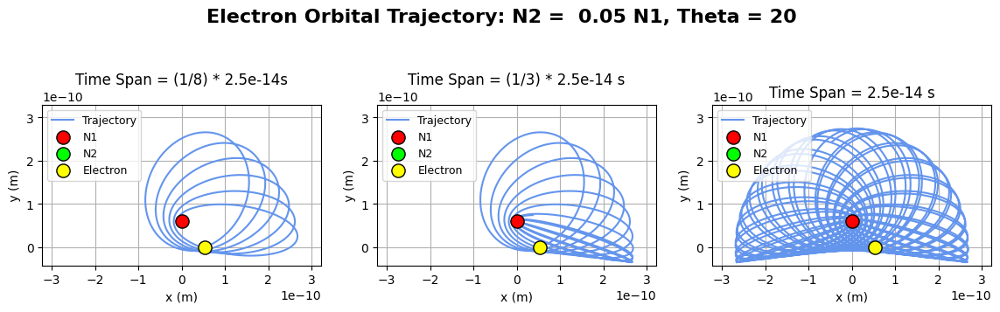

In [72]:
# Region 1: Typical Region
T = 2.5e-15 # time for simulation to run, s 
T1 = 2.5e-14
n2 = 0.05 * 1.6e-19 
angle = 20 
result, sol = analyze_single_orbit(angle, n2,T) 
if result == 0:
    print("Status: Stable periodic orbit")
elif result == 1:
    print("Status: Unstable orbit")
elif result == 2:
    print("Status: Collision with nucleus")

sol1 = get_trajectory(n2, angle, T1)
plot_trajectory(sol1, 1.4, T1, 1)

**Figure 19**. Electron orbital trajectory when $N_2 = 0.05N_1$. Electron solely orbits $N_1$. and does so along elliptical paths that create a partial-ellipsoid like shape. This is a stable periodic orbit.

#### Region 2: Curving Band 

![Curve](https://i.imgur.com/ZfbTYxP.png)

**Figure 20**. Image of Region 2: Curving Band

Next, we analyze a stable trajectory in the region with the curving band. We set $N_2 = 0.8N_1$ and $\theta = 35$.

Stable periodic orbit


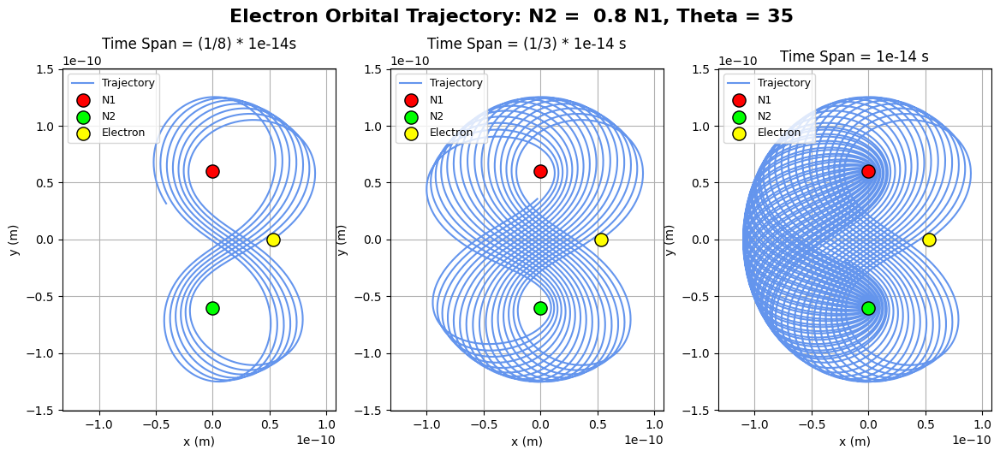

In [73]:
# Region 2: Curving Band
T = 2e-15  # time for simulation to run, s
n2 = 0.8 * 1.6e-19 
angle = 35
result, sol = analyze_single_orbit(angle, n2,T) 
if result == 0:
    print("Stable periodic orbit")
elif result == 1:
    print("Unstable orbit")
elif result == 2:
    print("Collision with nucleus")

T1 = 1e-14
sol1 = get_trajectory(n2, angle, T1)
plot_trajectory(sol1, 1.25, T1, 1)

**Figure 21**. Electron orbital trajectory when $N_2 = 0.8N_1$ and $\theta = 35$. Electron orbits both $N_1$ and $N_2$ in a figure-eight pattern, tracing our an ellipsoid. This is a stable periodic orbit.

#### Region 3: Chaotic Region 
![Chaotic](https://i.imgur.com/dewEIyl.png)

**Figure 22**. Image of Region 3: Chaotic.



Finally, we analyze a stable orbit in the region of the phase space diagram with stable, unstable, and collision orbits.

Stable periodic orbit


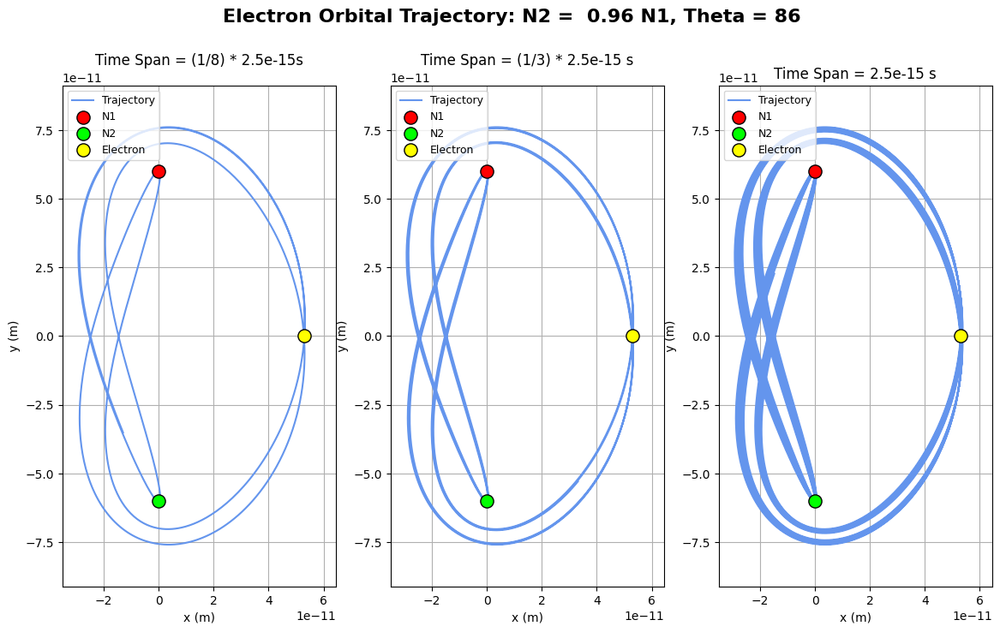

In [20]:
# Region 3: Chaotic Region
T = 2.5e-15  # time for simulation to run, s

n2 = 1.54e-19 #0.9625 * 1.6
angle = 86
result, sol = analyze_single_orbit(angle, n2,T) 

if result == 0:
    print("Stable periodic orbit")  

elif result == 1:
    print("Unstable orbit")
elif result == 2:
    print("Collision with nucleus")

T1 = 2.5e-15
sol1 = get_trajectory(n2, angle, T1)
plot_trajectory(sol1, 1, T1, 1)

**Figure 23**. Electron trajectory when $N_2 = 0.9625 N_1$ and $\theta = 86$. Electron orbits both $N_1$ and $N_2$ in a loop, tracing out a whole three-dimensional ellipsoid shape. This is a stable periodic orbit.

While this orbit in the chaotic region seems very stable, we observe what occurs after altering $N_2$ by $0.005e-19$ C.

Collision with nucleus


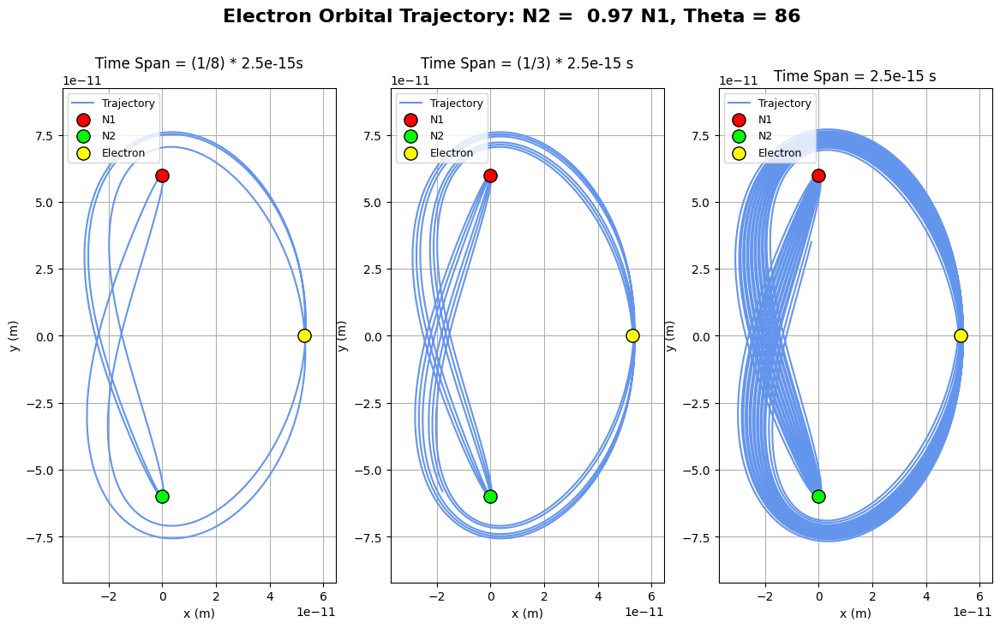

In [75]:
# Region 3: Chaotic Region
T = 2.5e-15  # time for simulation to run, s

n2 = 1.545e-19 #0.9625 * 1.6
angle = 86
result, sol = analyze_single_orbit(angle, n2,T) 

if result == 0:
    print("Stable periodic orbit")
elif result == 1:
    print("Unstable orbit")
elif result == 2:
    print("Collision with nucleus")

T1 = 2.5e-15
sol1 = get_trajectory(n2, angle, T1)
plot_trajectory(sol1, 1, T1, 1)

**Figure 24**. At $N_2 = 0.9656N_1$, the electron exhibits a collision with a nucleus. This is a collision orbit.

From Part II, we see some preliminary patterns emerging from our discrete phase space. In Part III, we extend this to a continuous hear map plotting relative standard deviation.

## Part III: Continuous Phase-Space Analysis to Quantify Relative Standard Deviation

In the final part of our analysis, we extend our discrete phase-space simulation into a quantitative heat map. Instead of showing the the stepwise categories of orbit, we display a continuous heat map of the relative standard deviations of each orbit in our phase space. However, if the orbit is a collision orbit, we override its value on the heat map with a solid red colour to indicate its collision. We first slightly alter our previous code to output a continuous heat map, the execute the main function. Then, we run a **continuous phase scan of 200 000 simulations**, rendering in slightly over 24 hours.


2D QUANTITATIVE PHASE SPACE SCAN: Period Variability
Theta axis: 400 points from 0° to 90°
N2 axis: 500 points from N1/100 to 100*N1
  N2/N1 range: 0.010 to 100.0
Total simulations: 200000


N2/N1 = 0.010 (1/500)
  Progress: 400/200000 (0.2%) | Rate: 42.3 sim/s | ETA: 4720s
N2/N1 = 0.010 (2/500)
  Progress: 800/200000 (0.4%) | Rate: 42.2 sim/s | ETA: 4717s
N2/N1 = 0.010 (3/500)
  Progress: 1200/200000 (0.6%) | Rate: 42.3 sim/s | ETA: 4697s
N2/N1 = 0.011 (4/500)
  Progress: 1600/200000 (0.8%) | Rate: 42.3 sim/s | ETA: 4693s
N2/N1 = 0.011 (5/500)
  Progress: 2000/200000 (1.0%) | Rate: 42.2 sim/s | ETA: 4689s
N2/N1 = 0.011 (6/500)
  Progress: 2400/200000 (1.2%) | Rate: 42.2 sim/s | ETA: 4684s
N2/N1 = 0.011 (7/500)
  Progress: 2800/200000 (1.4%) | Rate: 42.2 sim/s | ETA: 4676s
N2/N1 = 0.011 (8/500)
  Progress: 3200/200000 (1.6%) | Rate: 42.2 sim/s | ETA: 4665s
N2/N1 = 0.012 (9/500)
  Progress: 3600/200000 (1.8%) | Rate: 42.1 sim/s | ETA: 4663s
N2/N1 = 0.012 (10/500)
  Progress: 4000/20000

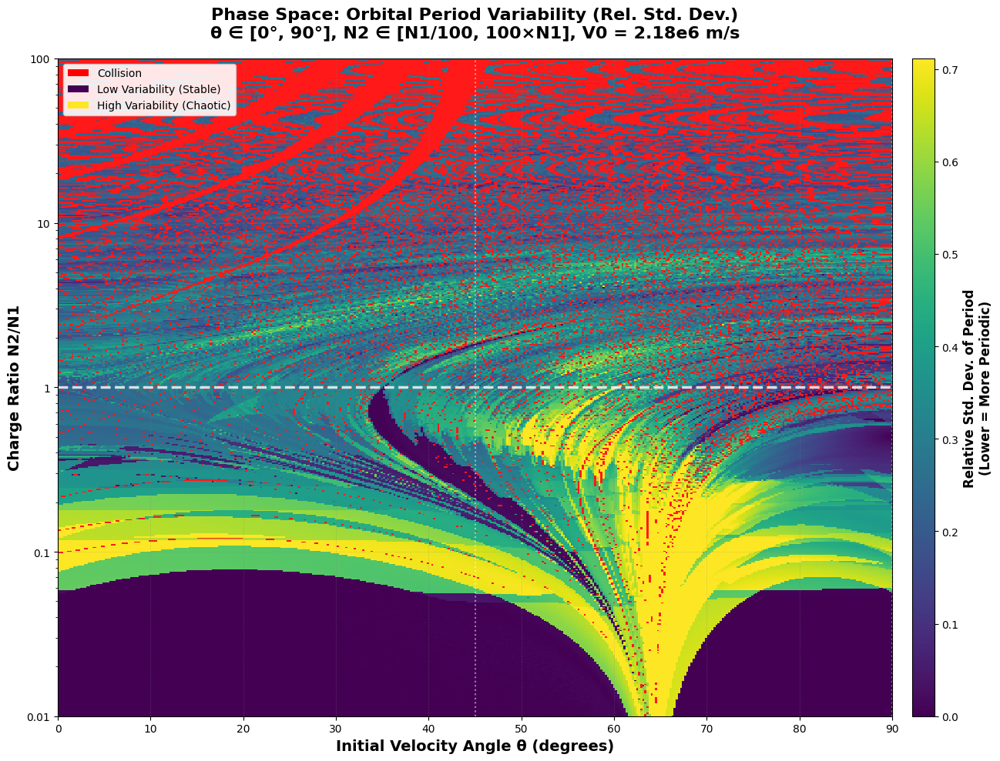


Results saved to 'lowphase_space_heatmap_results.npz'


In [2]:
# Import useful libraries
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
from scipy.signal import find_peaks
import math 
import time

# Fixed Constants
k = 8.99e9            # Coulomb constant, N·m²/C²
e = -1.6e-19          # Electron charge magnitude, C
n1 = 1.6e-19          # Nucleus 1 charge 
me = 9.109e-31        # Electron mass, kg
r0 = 5.29e-11         # Bohr radius, m 

# Orbital time
T = 2.5e-15  # time for simulation to run, s

# Nuclei coordinates
distance = 1.2e-10  # vertical distance between two nuclei, m
y1 = distance / 2   # N1 y coordinate, m 
x1 = 0              # N1 x coordinate, m
y2 = -distance / 2  # N2 x coordinate, m
x2 = 0              # N2 y coordinate, m

# Initial Velocity
v0 = 2.18e6  # initial velocity (m/s)

# Define your diff_eqns function
def diff_eqns(t, state):
    x, y, vx, vy = state
    
    r1x = x - x1
    r1y = y - y1
    r1 = np.sqrt(r1x**2 + r1y**2)
    r2x = x - x2
    r2y = y - y2
    r2 = np.sqrt(r2x**2 + r2y**2)
    
    # Avoid singularities
    r1 = max(r1, 1e-20)
    r2 = max(r2, 1e-20)
    
    # Calculate force & acceleration components for N1
    fx1 = k * e * n1 * r1x / r1**3
    fy1 = k * e * n1 * r1y / r1**3
    # Calculate force & acceleration components for N2
    fx2 = k * e * n2 * r2x / r2**3
    fy2 = k * e * n2 * r2y / r2**3 
    fx = fx1 + fx2 
    fy = fy1 + fy2
    # Calculate acceleration
    accx = fx / me 
    accy = fy / me  
    # Return differentials
    return vx, vy, accx, accy

# REVISED DETECTION FUNCTIONS

def check_collision(sol, collision_threshold=8.5e-16):
    r1 = np.sqrt((sol.y[0] - x1)**2 + (sol.y[1] - y1)**2)
    r2 = np.sqrt((sol.y[0] - x2)**2 + (sol.y[1] - y2)**2)
    
    collision_n1_indices = np.where(r1 < collision_threshold)[0]
    collision_n2_indices = np.where(r2 < collision_threshold)[0]
    
    if len(collision_n1_indices) > 0 or len(collision_n2_indices) > 0:
        return True
    return False

def calculate_period_std(sol):
    # Calculate distance from starting position
    x0, y0 = sol.y[0][0], sol.y[1][0]
    distances = np.sqrt((sol.y[0] - x0)**2 + (sol.y[1] - y0)**2)
    
    # Find local minima (returns to starting region)
    try:
        peaks, _ = find_peaks(-distances, distance=len(distances)//20)
    except:
        return None
    
    if len(peaks) < 2:
        return None
    
    # Calculate periods
    periods = np.diff(sol.t[peaks])
    
    if len(periods) < 2:
        return None
    
    # Calculate relative standard deviation
    period_mean = np.mean(periods)
    period_std = np.std(periods)
    
    if period_mean == 0:
        return None
    
    period_std_rel = period_std / period_mean
    
    return period_std_rel

def analyze_single_orbit_quantitative(angle, n2_value):
    try:
        # Set up initial conditions
        theta = math.radians(angle)
        vx0 = math.cos(theta) * v0
        vy0 = math.sin(theta) * v0
        state0 = (r0, 0, vx0, vy0)
        
        # Set n2 as global for diff_eqns to use
        global n2
        n2 = n2_value
        
        # Run simulation
        t_span = (0, T)
        sol = solve_ivp(diff_eqns, t_span, state0, 
                       rtol=1e-9, atol=1e-9, 
                       max_step=1e-17)
        
        # Check for collision first
        collided = check_collision(sol)
        if collided:
            return -1  # Collision marker
        
        # Calculate period variability
        rel_std = calculate_period_std(sol)
        return rel_std
            
    except Exception as e:
        return None  # Error

# PHASE SPACE SCAN 

def scan_phase_space_2d_quantitative(n_theta=30, n_n2=40):
    print("="*70)
    print("2D QUANTITATIVE PHASE SPACE SCAN: Period Variability")
    print("="*70)
    
    # Phase space ranges
    theta_range = np.linspace(0, 90, n_theta)
    n2_n1_ratios = np.logspace(-2, 2, n_n2)
    n2_range = n1 * n2_n1_ratios
    
    print(f"Theta axis: {n_theta} points from 0° to 90°")
    print(f"N2 axis: {n_n2} points from N1/100 to 100*N1")
    print(f"  N2/N1 range: {n2_n1_ratios[0]:.3f} to {n2_n1_ratios[-1]:.1f}")
    print(f"Total simulations: {n_theta * n_n2}")
    print("="*70 + "\n")
    
    # Initialize results grid (use NaN for missing data)
    results_grid = np.full((n_n2, n_theta), np.nan)
    
    total_sims = n_theta * n_n2
    sim_count = 0
    start_time = time.time()
    
    # Run simulations
    for i, n2_val in enumerate(n2_range):
        print(f"\nN2/N1 = {n2_val/n1:.3f} ({i+1}/{n_n2})")
        for j, angle_val in enumerate(theta_range):
            sim_count += 1
            
            if sim_count % 5 == 0 or sim_count == total_sims:
                elapsed = time.time() - start_time
                rate = sim_count / elapsed if elapsed > 0 else 0
                eta = (total_sims - sim_count) / rate if rate > 0 else 0
                print(f"  Progress: {sim_count}/{total_sims} ({100*sim_count/total_sims:.1f}%) "
                      f"| Rate: {rate:.1f} sim/s | ETA: {eta:.0f}s", end='\r')
            
            # Analyze this configuration
            rel_std = analyze_single_orbit_quantitative(angle_val, n2_val)
            results_grid[i, j] = rel_std if rel_std is not None else np.nan
    
    elapsed = time.time() - start_time
    print(f"\n\nScan completed in {elapsed:.1f}s ({elapsed/60:.1f} min)")
    print(f"Average: {elapsed/total_sims:.2f}s per simulation\n")
    
    # Print statistics
    n_collision = np.sum(results_grid == -1)
    n_valid = np.sum(~np.isnan(results_grid) & (results_grid != -1))
    n_error = np.sum(np.isnan(results_grid))
    
    valid_data = results_grid[(~np.isnan(results_grid)) & (results_grid != -1)]
    
    print("Results Summary:")
    print(f"  Valid orbits:         {n_valid:4d} ({100*n_valid/total_sims:.1f}%)")
    print(f"  Collisions:           {n_collision:4d} ({100*n_collision/total_sims:.1f}%)")
    print(f"  Errors:               {n_error:4d} ({100*n_error/total_sims:.1f}%)")
    
    if len(valid_data) > 0:
        print(f"\nPeriod Rel. Std. Dev. Statistics (valid orbits):")
        print(f"  Min:     {np.min(valid_data):.6f}")
        print(f"  Max:     {np.max(valid_data):.6f}")
        print(f"  Mean:    {np.mean(valid_data):.6f}")
        print(f"  Median:  {np.median(valid_data):.6f}")
    
    print("="*70 + "\n")
    
    return results_grid, theta_range, n2_range

# PLOTTING RESULTS

def plot_phase_space_heatmap(results_grid, theta_range, n2_range):
    import matplotlib.colors as mcolors
    
    fig = plt.figure(figsize=(14, 10))
    
    # Create meshgrid
    theta_grid, n2_grid = np.meshgrid(theta_range, n2_range)
    n2_n1_grid = n2_grid / n1
    
    # Separate collision and non-collision data
    collision_mask = (results_grid == -1)
    data_for_heatmap = results_grid.copy()
    data_for_heatmap[collision_mask] = np.nan  # Hide collisions from main heatmap
    
    ax = fig.add_subplot(111)
    
    # Plot main heat map (period variability)
    im = ax.pcolormesh(theta_grid, n2_n1_grid, data_for_heatmap,
                       cmap='viridis', shading='auto',
                       vmin=0, vmax=np.nanpercentile(data_for_heatmap, 95))
    
    # Overlay collision regions in red
    collision_data = np.where(collision_mask, 1, np.nan)
    ax.pcolormesh(theta_grid, n2_n1_grid, collision_data,
                  cmap=mcolors.ListedColormap(['#ff0000']), 
                  shading='auto', alpha=0.9)
    
    ax.set_xlabel('Initial Velocity Angle θ (degrees)', fontsize=14, fontweight='bold')
    ax.set_ylabel('Charge Ratio N2/N1', fontsize=14, fontweight='bold')
    ax.set_title('Phase Space: Orbital Period Variability (Rel. Std. Dev.)\n' +
                 'θ ∈ [0°, 90°], N2 ∈ [N1/100, 100×N1], V0 = 2.18e6 m/s', 
                 fontsize=16, fontweight='bold', pad=20)
    
    # Use log scale for N2/N1
    ax.set_yscale('log')
    ax.set_ylim([0.01, 100])
    ax.set_yticks([0.01, 0.1, 1, 10, 100])
    ax.set_yticklabels(['0.01', '0.1', '1', '10', '100'])
    ax.set_xlim([0, 90])
    
    # Add grid
    ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.5, color='gray')
    
    # Add reference lines
    ax.axhline(y=1, color='white', linestyle='--', linewidth=2.5, 
               alpha=0.8, label='N2 = N1')
    ax.axvline(x=0, color='white', linestyle=':', linewidth=1.5, alpha=0.5)
    ax.axvline(x=45, color='white', linestyle=':', linewidth=1.5, alpha=0.5)
    ax.axvline(x=90, color='white', linestyle=':', linewidth=1.5, alpha=0.5)
    
    # Add colorbar for period variability
    cbar = plt.colorbar(im, ax=ax, pad=0.02, aspect=30)
    cbar.set_label('Relative Std. Dev. of Period\n(Lower = More Periodic)', 
                   fontsize=12, fontweight='bold')
    
    # Add legend for collision regions
    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor='#ff0000', label='Collision'),
        Patch(facecolor='#440154', label='Low Variability (Stable)'),
        Patch(facecolor='#fde724', label='High Variability (Chaotic)')
    ]
    ax.legend(handles=legend_elements, loc='upper left', fontsize=10,
             framealpha=0.9)
    
    plt.tight_layout()
    plt.savefig('phase_space_heatmap_quantitative.png', dpi=300, bbox_inches='tight')
    print("Heat map saved as 'phase_space_heatmap_quantitative.png'")
    plt.show()
    
    return fig

# MAIN CODE

# Run phase space scan
print("\n" + "="*70)
input("Press Enter to start quantitative phase space scan...")

results_grid, theta_range, n2_range = scan_phase_space_2d_quantitative(n_theta=400, n_n2=500)

# Plot results
plot_phase_space_heatmap(results_grid, theta_range, n2_range)

# Save results
np.savez('phase_space_heatmap_results.npz', 
         results_grid=results_grid,
         theta_range=theta_range,
         n2_range=n2_range,
         n1=n1)
print("\nResults saved to 'lowphase_space_heatmap_results.npz'")

**Figure 25**. Image of quantitative heat map. Similar patterns are seen as compared to the discrete phase space diagram. Notably, there is a stark contrast in relative standard deviation between the lower third region and the neon band above it. Collisions increase as the charge ratio increases.

**Code Block Summary**. The above code adapts the previous code for a discrete quantitative phase space scan to a continuous one, with relative standard deviation of an electron's orbital period as a function of initial velocity angle and charge ratio.

![Streaks](https://i.imgur.com/fGStRzk.png) ![Neon](https://i.imgur.com/9qUpHJf.png) ![Quasi](https://i.imgur.com/1uPVanA.png)

**Figure 26**. Zoomed-in images of patterns found in the quantitative phase space scan. From top to bottom: Collision patterns, neon bands, curves of periodicity & quasi-periodicity.

### Analysis for Continuous Quantitative Phase Space Scan 

The above phase space scan was run for 200000 simulations, and is hence much more detailed and informative. We see that the continuous heat map outlines similar patterns compared to the discrete phase-space diagram. However, there are several additional observations we can make using relative standard deviation:

1.  **Collision Patterns**: Unlike the discrete phase space, we see that the collision orbits (in red) follow interesting patterns as the charge ratio increases. For instance, we see three curves of collisions on the left side of the graph. Furthermore, along the top of the graph, the collisions trace out a distinct pattern that looks somewhat like the feathers of a bird. Again, this is something that the previous phase span did not show.
2. **Neon band above lower third region**: We see that there is a neon band right above the lower third region of stable orbits (purple), indicating a large number of unstable orbits along a curve. The transition between stable to unstable orbits (purple to green to yellow) is surprisingly very sudden, with no indication of a gradual change in relative standard deviation 
3. **Curves of periodicity & quasi-periodicity**: When the charge ratio is between 1 and 10, we see curves of quasi-periodicity, characterised by distinct colour (such as neon, turquoise, and purple). The curves of quasi-periodicity are especially interesting behaviour because they could never be detected just by a discrete phase space analysis. These curves connect down to the lower regions of the graph and are seen as streaks that follow a counterclockwise path top down. We also see a curve of periodicity in the centre of the graph, seen as a purple streak.

For this portion of the analysis, we look at these patterns in more detail.


We first create two new functions that allow for a partial phase space scan of our domain: This will allow us to "zoom into" specific regions we wish to study.

In [71]:
# Import useful libraries
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
from scipy.signal import find_peaks
import math 
import time

# Fixed Constants
k = 8.99e9            # Coulomb constant, N·m²/C²
e = -1.6e-19          # Electron charge magnitude, C
n1 = 1.6e-19          # Nucleus 1 charge 
me = 9.109e-31        # Electron mass, kg
r0 = 5.29e-11         # Bohr radius, m 

# Orbital time
T = 2.5e-15  # time for simulation to run, s

# Nuclei coordinates
distance = 1.2e-10  # vertical distance between two nuclei, m
y1 = distance / 2   # N1 y coordinate, m 
x1 = 0              # N1 x coordinate, m
y2 = -distance / 2  # N2 x coordinate, m
x2 = 0              # N2 y coordinate, m

# Initial Velocity
v0 = 2.18e6  # initial velocity (m/s)

# Define your diff_eqns function
def diff_eqns(t, state):
    x, y, vx, vy = state
    
    r1x = x - x1
    r1y = y - y1
    r1 = np.sqrt(r1x**2 + r1y**2)
    r2x = x - x2
    r2y = y - y2
    r2 = np.sqrt(r2x**2 + r2y**2)
    
    # Avoid singularities
    r1 = max(r1, 1e-20)
    r2 = max(r2, 1e-20)
    
    # Calculate force & acceleration components for N1
    fx1 = k * e * n1 * r1x / r1**3
    fy1 = k * e * n1 * r1y / r1**3
    # Calculate force & acceleration components for N2
    fx2 = k * e * n2 * r2x / r2**3
    fy2 = k * e * n2 * r2y / r2**3 
    fx = fx1 + fx2 
    fy = fy1 + fy2
    # Calculate acceleration
    accx = fx / me 
    accy = fy / me  
    # Return differentials
    return vx, vy, accx, accy

# REVISED DETECTION FUNCTIONS

def check_collision(sol, collision_threshold=8.5e-16):
    r1 = np.sqrt((sol.y[0] - x1)**2 + (sol.y[1] - y1)**2)
    r2 = np.sqrt((sol.y[0] - x2)**2 + (sol.y[1] - y2)**2)
    
    collision_n1_indices = np.where(r1 < collision_threshold)[0]
    collision_n2_indices = np.where(r2 < collision_threshold)[0]
    
    if len(collision_n1_indices) > 0 or len(collision_n2_indices) > 0:
        return True
    return False

def calculate_period_std(sol):
    # Calculate distance from starting position
    x0, y0 = sol.y[0][0], sol.y[1][0]
    distances = np.sqrt((sol.y[0] - x0)**2 + (sol.y[1] - y0)**2)
    
    # Find local minima (returns to starting region)
    try:
        peaks, _ = find_peaks(-distances, distance=len(distances)//20)
    except:
        return None
    
    if len(peaks) < 2:
        return None
    
    # Calculate periods
    periods = np.diff(sol.t[peaks])
    
    if len(periods) < 2:
        return None
    
    # Calculate relative standard deviation
    period_mean = np.mean(periods)
    period_std = np.std(periods)
    
    if period_mean == 0:
        return None
    
    period_std_rel = period_std / period_mean
    
    return period_std_rel

def analyze_single_orbit_quantitative(angle, n2_value):
    try:
        # Set up initial conditions
        theta = math.radians(angle)
        vx0 = math.cos(theta) * v0
        vy0 = math.sin(theta) * v0
        state0 = (r0, 0, vx0, vy0)
        
        # Set n2 as global for diff_eqns to use
        global n2
        n2 = n2_value
        
        # Run simulation
        t_span = (0, T)
        sol = solve_ivp(diff_eqns, t_span, state0, 
                       rtol=1e-9, atol=1e-9, 
                       max_step=1e-17)
        
        # Check for collision first
        collided = check_collision(sol)
        if collided:
            return -1  # Collision marker
        
        # Calculate period variability
        rel_std = calculate_period_std(sol)
        return rel_std
            
    except Exception as e:
        return None  # Error

def scan_phase_space_partial(n_theta, n_n2, theta_min, theta_max, n_min, n_max):
    print("="*70)
    print("PARTIAL 2D QUANTITATIVE PHASE SPACE SCAN: Period Variability")
    print("="*70)
    
    # Phase space ranges
    n1 = 1.6e-19
    theta_range = np.linspace(theta_min, theta_max, n_theta)
    n2_n1_ratios = np.linspace(n_min, n_max, n_n2)
    n2_range = n1 * n2_n1_ratios
    
    print(f"Theta axis: {n_theta} points from 0° to 90°")
    print(f"N2 axis: {n_n2} points from N1/100 to 100*N1")
    print(f"  N2/N1 range: {n2_n1_ratios[0]:.3f} to {n2_n1_ratios[-1]:.1f}")
    print(f"Total simulations: {n_theta * n_n2}")
    print("="*70 + "\n")
    
    # Initialize results grid (use NaN for missing data)
    results_grid = np.full((n_n2, n_theta), np.nan)
    
    total_sims = n_theta * n_n2
    sim_count = 0
    start_time = time.time()
    
    # Run simulations
    for i, n2_val in enumerate(n2_range):
        print(f"\nN2/N1 = {n2_val/n1:.3f} ({i+1}/{n_n2})")
        for j, angle_val in enumerate(theta_range):
            sim_count += 1
            
            if sim_count % 15 == 0 or sim_count == total_sims:
                elapsed = time.time() - start_time
                rate = sim_count / elapsed if elapsed > 0 else 0
                eta = (total_sims - sim_count) / rate if rate > 0 else 0
                print(f"  Progress: {sim_count}/{total_sims} ({100*sim_count/total_sims:.1f}%) "
                      f"| Rate: {rate:.1f} sim/s | ETA: {eta:.0f}s", end='\r')
            
            # Analyze this configuration
            rel_std = analyze_single_orbit_quantitative(angle_val, n2_val)
            results_grid[i, j] = rel_std if rel_std is not None else np.nan
    
    elapsed = time.time() - start_time
    print(f"\n\nScan completed in {elapsed:.1f}s ({elapsed/60:.1f} min)")
    print(f"Average: {elapsed/total_sims:.2f}s per simulation\n")
    
    # Print statistics
    n_collision = np.sum(results_grid == -1)
    n_valid = np.sum(~np.isnan(results_grid) & (results_grid != -1))
    n_error = np.sum(np.isnan(results_grid))
    
    valid_data = results_grid[(~np.isnan(results_grid)) & (results_grid != -1)]
    
    print("Results Summary:")
    print(f"  Valid orbits:         {n_valid:4d} ({100*n_valid/total_sims:.1f}%)")
    print(f"  Collisions:           {n_collision:4d} ({100*n_collision/total_sims:.1f}%)")
    print(f"  Errors:               {n_error:4d} ({100*n_error/total_sims:.1f}%)")
    
    if len(valid_data) > 0:
        print(f"\nPeriod Rel. Std. Dev. Statistics (valid orbits):")
        print(f"  Min:     {np.min(valid_data):.6f}")
        print(f"  Max:     {np.max(valid_data):.6f}")
        print(f"  Mean:    {np.mean(valid_data):.6f}")
        print(f"  Median:  {np.median(valid_data):.6f}")
    
    print("="*70 + "\n")
    
    return results_grid, theta_range, n2_range

# PLOTTING RESULTS

def plot_phase_space_partial(results_grid, theta_range, n2_range, theta_min, theta_max,n_min, n_max):
    import matplotlib.colors as mcolors
    
    fig = plt.figure(figsize=(10, 8))
    
    # Create meshgrid
    theta_grid, n2_grid = np.meshgrid(theta_range, n2_range)
    n2_n1_grid = n2_grid / n1
    
    # Separate collision and non-collision data
    collision_mask = (results_grid == -1)
    data_for_heatmap = results_grid.copy()
    data_for_heatmap[collision_mask] = np.nan  # Hide collisions from main heatmap
    
    ax = fig.add_subplot(111)
    
    # Plot main heat map (period variability)
    im = ax.pcolormesh(theta_grid, n2_n1_grid, data_for_heatmap,
                       cmap='viridis', shading='auto',
                       vmin=0, vmax=np.nanpercentile(data_for_heatmap, 95))
    
    # Overlay collision regions in red
    collision_data = np.where(collision_mask, 1, np.nan)
    ax.pcolormesh(theta_grid, n2_n1_grid, collision_data,
                  cmap=mcolors.ListedColormap(['#ff0000']), 
                  shading='auto', alpha=0.9)
    
    ax.set_xlabel('Initial Velocity Angle θ (degrees)', fontsize=14, fontweight='bold')
    ax.set_ylabel('Charge Ratio N2/N1', fontsize=14, fontweight='bold')
    ax.set_title('Phase Space: Orbital Period Variability (Rel. Std. Dev.)\n' +
                 'θ ∈ [0°, 90°], N2 ∈ [N1/100, 100×N1], V0 = 2.18e6 m/s', 
                 fontsize=16, fontweight='bold', pad=20)
    
    # Use log scale for N2/N1
    ax.set_ylim([n_min, n_max])
    #ax.set_yticks([0.01, 0.1, 1, 10, 100])
   #ax.set_yticklabels(['0.01', '0.1', '1', '10', '100'])
    ax.set_xlim([theta_min, theta_max])
    
    # Add grid
    ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.5, color='gray')
    
    # Add reference lines
    ax.axhline(y=1, color='white', linestyle='--', linewidth=2.5, 
               alpha=0.8, label='N2 = N1')
    ax.axvline(x=0, color='white', linestyle=':', linewidth=1.5, alpha=0.5)
    ax.axvline(x=45, color='white', linestyle=':', linewidth=1.5, alpha=0.5)
    ax.axvline(x=90, color='white', linestyle=':', linewidth=1.5, alpha=0.5)
    
    # Add colorbar for period variability
    cbar = plt.colorbar(im, ax=ax, pad=0.02, aspect=30)
    cbar.set_label('Relative Std. Dev. of Period\n(Lower = More Periodic)', 
                   fontsize=12, fontweight='bold')
    
    # Add legend for collision regions
    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor='#ff0000', label='Collision'),
        Patch(facecolor='#440154', label='Low Variability (Stable)'),
        Patch(facecolor='#fde724', label='High Variability (Chaotic)')
    ]
    ax.legend(handles=legend_elements, loc='upper left', fontsize=10,
             framealpha=0.9)
    
    plt.tight_layout()
    plt.savefig('phase_space_heatmap_quantitative.png', dpi=300, bbox_inches='tight')
    print("Heat map saved as 'phase_space_heatmap_quantitative.png'")
    plt.show()
    
    return fig


**Code Block Summary**. These above code adapt the work from the discrete phase space scan to create two new functions, scan_phase_space_partia and plot_phase_space_partial. INstead of taking the $\theta$ and $\frac{N_2}{N_1}$ range as fixed domains, we pass them as parameters in our function, so that we can "Zoom in" and "Zoom out" of regions we want to analyze.

### Pattern 1: Periodic Collisions 
![Periodic](https://i.imgur.com/hBZ4t0M.png) 

**Figure 27.** Zoomed-in image of periodic collisions.


We first analyze the periodic collision patterns observed when the charge ratio is very large. To do this, we first conduct a partial phase space simulation to zoom into the region of study.


PARTIAL 2D QUANTITATIVE PHASE SPACE SCAN: Period Variability
Theta axis: 30 points from 0° to 90°
N2 axis: 30 points from N1/100 to 100*N1
  N2/N1 range: 80.000 to 100.0
Total simulations: 900


N2/N1 = 80.000 (1/30)
  Progress: 30/900 (3.3%) | Rate: 0.4 sim/s | ETA: 2485s
N2/N1 = 80.690 (2/30)
  Progress: 60/900 (6.7%) | Rate: 0.3 sim/s | ETA: 2469s
N2/N1 = 81.379 (3/30)
  Progress: 90/900 (10.0%) | Rate: 0.3 sim/s | ETA: 2401s
N2/N1 = 82.069 (4/30)
  Progress: 120/900 (13.3%) | Rate: 0.3 sim/s | ETA: 2319s
N2/N1 = 82.759 (5/30)
  Progress: 150/900 (16.7%) | Rate: 0.3 sim/s | ETA: 2257s
N2/N1 = 83.448 (6/30)
  Progress: 180/900 (20.0%) | Rate: 0.3 sim/s | ETA: 2180s
N2/N1 = 84.138 (7/30)
  Progress: 210/900 (23.3%) | Rate: 0.2 sim/s | ETA: 4415s
N2/N1 = 84.828 (8/30)
  Progress: 240/900 (26.7%) | Rate: 0.0 sim/s | ETA: 29370s
N2/N1 = 85.517 (9/30)
  Progress: 270/900 (30.0%) | Rate: 0.0 sim/s | ETA: 25137s
N2/N1 = 86.207 (10/30)
  Progress: 300/900 (33.3%) | Rate: 0.0 sim/s | ETA: 21

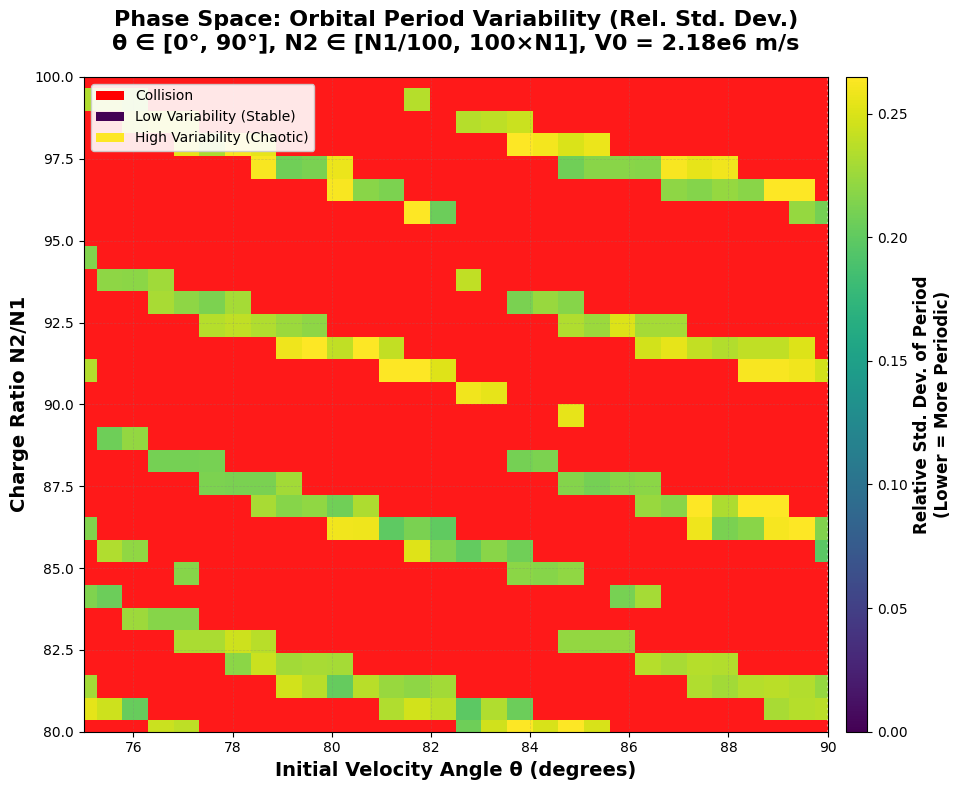


Results saved to 'lowphase_space_heatmap_results.npz'


In [44]:
import numpy as np 

print("\n" + "="*70)
input("Press Enter to start quantitative phase space scan...")

theta_min = 75
theta_max = 90 
n_min = 80
n_max = 100

results_grid, theta_range, n2_range = scan_phase_space_partial(n_theta=30, n_n2=30, theta_min = theta_min, theta_max = theta_max, n_min = n_min, n_max = n_max)

# Plot results
plot_phase_space_partial(results_grid, theta_range, n2_range, theta_min, theta_max, n_min, n_max)

# Save results
np.savez('partial_phase_space_heatmap_results.npz', 
         results_grid=results_grid,
         theta_range=theta_range,
         n2_range=n2_range,
         n1=n1)
print("\nResults saved to 'lowphase_space_heatmap_results.npz'")

**Figure 28**. Zoom-in phase space simulation of collision streaks, with domain $75 \leq \theta \leq 90$ and $80 \leq \frac{N_2}{N_1} \leq 100$. Note that the colours in this phase space are different from the original phase scan, since the range in the colour bar for relative standard deviation of period is lower. The $\frac{N_2}{N_1}$ range is displayed as a linear scale.

The periodic curves of collision orbits seen in the original phase space graph are even more pronounced in **Figure 28** with the red indicating collision orbits, and green indicating orbits with relative standard deviations of approximately 0.2-0.25. This allows us to pick one combination of parameters that is a collision, and one that is not, to study the differences in behaviour more carefully. 

#### Pattern 1: Non-collision Orbit ($N_2 = 82.5 N_1, \theta = 80$)

We first start by looking at the orbital trajectory of a non-collision orbit, where we pick $N_2 = 82.5 N_1, \theta = 80$.

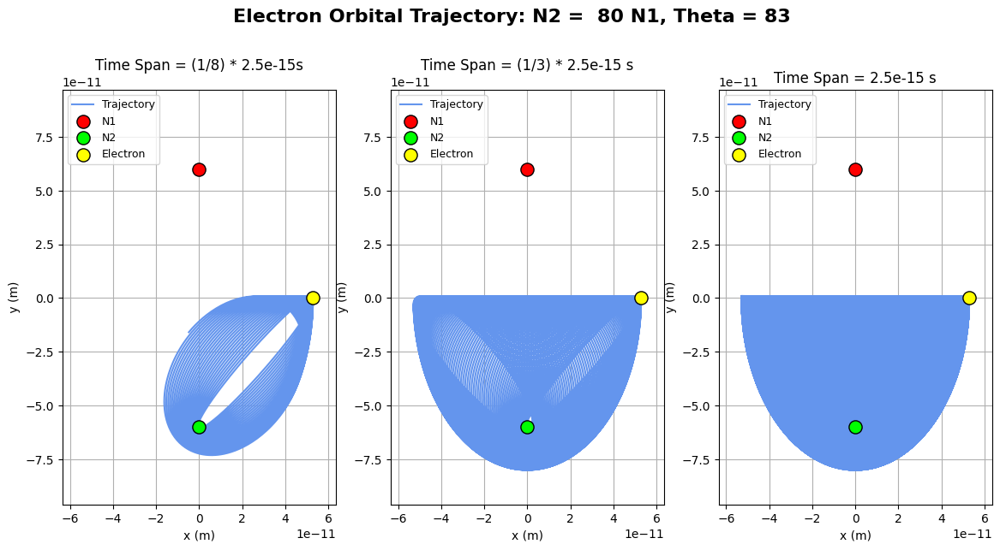

Is this a collision orbit? No


In [23]:
# Parameters to vary
n2 = 80 * 1.6e-19  # Nucleus 2 charge
angle = 83  # Launch angle in degrees
T = 2.5e-15 # time for simulation to run, s

sol = get_trajectory(n2, angle, T)
plot_trajectory(sol, 1.1, T, 80)
# Set up initial conditions


theta = math.radians(angle)
vx0 = math.cos(theta) * v0
vy0 = math.sin(theta) * v0
state0 = (r0, 0, vx0, vy0) 


# Run simulation
t_span = (0, T)

# Check Periodicity
is_periodic = check_periodicity(sol)
is_collision = check_collision(sol) 
print(f"Is this a collision orbit? {'Yes' if is_collision else 'No'}")



**Figure 29**. When $N_2 = 1.3e17 C$ and $\theta = 80$, the electron exhibits a trajectory that does not collide with the nucleus.

From the above, we see that the electron orbits $N_2$ in an elliptical pattern, but exhibits enough drift to vary its periodic position over time, forming a half-elliptical shape. However, this does not tell us much about the collision aspect of the orbit. To understand this deeper, we generate graphs plotting the distance between the electron, $N_1$ and $N_2$; since the electron is much closer to $N_2$, we also include a third subplot that zooms into the graph when the electron nearly meets $N_2$.

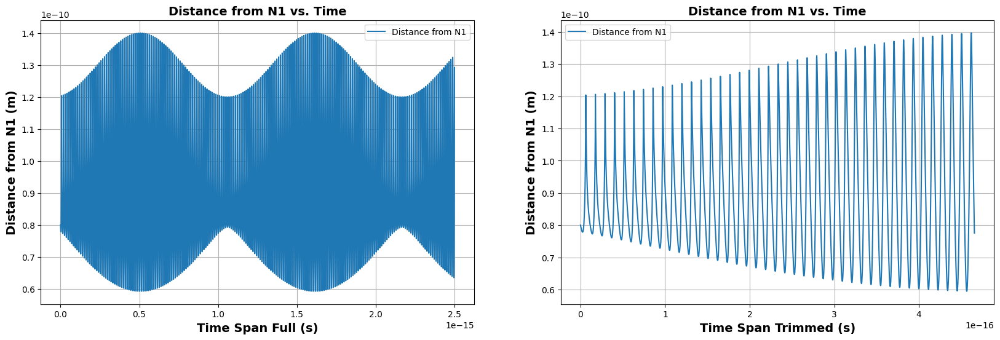

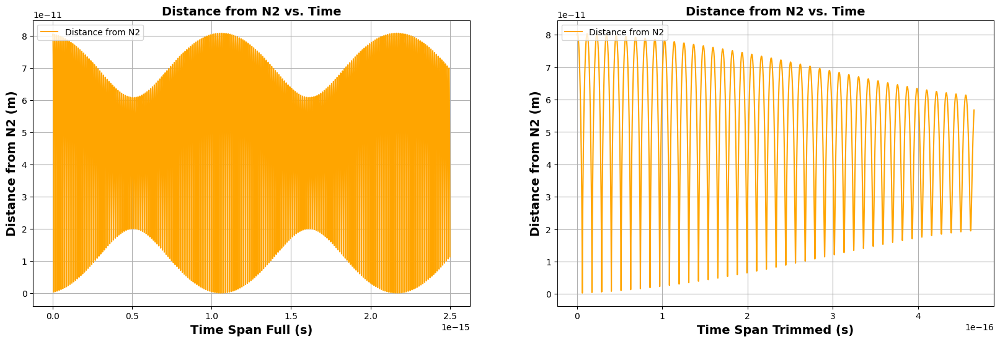

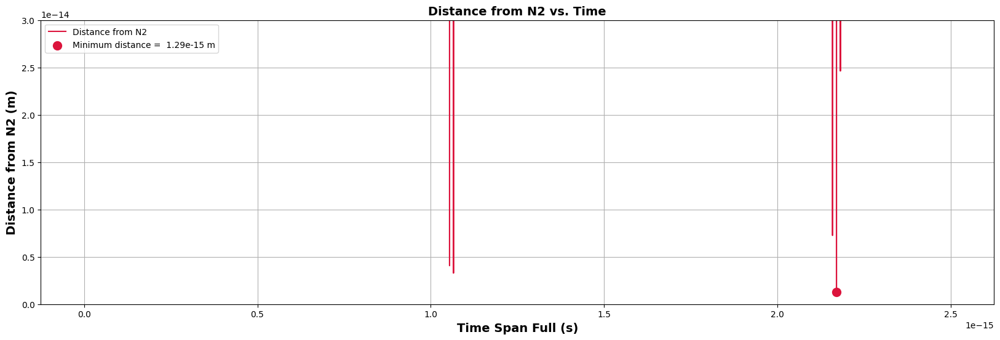

In [143]:

r1 = np.sqrt((sol.y[0] - x1)**2 + (sol.y[1] - y1)**2)
r2 = np.sqrt((sol.y[0] - x2)**2 + (sol.y[1] - y2)**2) 


fig, ax = plt.subplots(1, 2) 
fig.set_size_inches((20,6))
ax[0].plot(sol.t,r1, label = "Distance from N1")
ax[0].set_title(f"Distance from N1 vs. Time", fontweight = "bold", fontsize = 14) 
ax[0].set_ylabel("Distance from N1 (m)", fontweight = "bold", fontsize = 14)
ax[0].set_xlabel("Time Span Full (s)", fontweight = "bold", fontsize = 14)
ax[0].grid(True)
ax[0].legend()

ax[1].plot(sol.t[0:8000],r1[0:8000], label = "Distance from N1")
ax[1].set_title(f"Distance from N1 vs. Time", fontweight = "bold", fontsize = 14) 
ax[1].set_ylabel("Distance from N1 (m)", fontweight = "bold", fontsize = 14)
ax[1].set_xlabel("Time Span Trimmed (s)", fontweight = "bold", fontsize = 14)
ax[1].grid(True) 
ax[1].legend(loc = "upper left")

fig, ax = plt.subplots(1, 2) 
fig.set_size_inches((20,6))
ax[0].plot(sol.t,r2, c = "orange", label = "Distance from N2")
ax[0].set_title(f"Distance from N2 vs. Time", fontweight = "bold", fontsize = 14) 
ax[0].set_ylabel("Distance from N2 (m)", fontweight = "bold", fontsize = 14)
ax[0].set_xlabel("Time Span Full (s)", fontweight = "bold", fontsize = 14)
ax[0].grid(True) 
ax[0].legend(loc = "upper left")

ax[1].plot(sol.t[0:8000],r2[0:8000], c = "orange", label = "Distance from N2")
ax[1].set_title(f"Distance from N2 vs. Time", fontweight = "bold", fontsize = 14) 
ax[1].set_ylabel("Distance from N2 (m)", fontweight = "bold", fontsize = 14)
ax[1].set_xlabel("Time Span Trimmed (s)", fontweight = "bold", fontsize = 14)
ax[1].grid(True) 
ax[1].legend(loc = "upper left")

fig, ax = plt.subplots(1) 
fig.set_size_inches((20,6))
minimum = min(r2)
index = np.where(r2 == minimum)
ax.plot(sol.t,r2, c = "crimson", label = "Distance from N2") 
ax.scatter(sol.t[index], minimum, c = "crimson",  s = 100, label = f"Minimum distance = {minimum: 0.2e} m")
ax.set_title(f"Distance from N2 vs. Time", fontweight = "bold", fontsize = 14) 
ax.set_ylabel("Distance from N2 (m)", fontweight = "bold", fontsize = 14)
ax.set_xlabel("Time Span Full (s)", fontweight = "bold", fontsize = 14)
ax.set_ylim(0,3e-14) 
ax.grid(True) 
ax.legend(loc = "upper left")

**Figure 30a, b, c**. Subplots of the distances between the electron and $N_1$ (a) and $N_2$ (b, c). We see sinusoidal-like patterns for all three subplots that are packaged in a larger sinusoidal-like shape.

From the above, we see that both electron distances from $N_1$ and $N_2$ exhibit oscillatory patterns, where the distances vary between local minima and maxima; simultaneously, these oscillations are "packaged" in a sinusoidal-like pattern, with the amplitudes of the oscillatory patterns growing and shrinking periodically as well. This matches the trajectory plot from **Figure 29**; while the electron orbits in elliptical patterns around $N_2$, its trajectory also grows and shrinks due to drift. 

Looking at **Figure 30c**, we notice that the minimum distance between $N_2$ and the electron is 1.29e-15m. Hence, this is not counted as a collision orbit. 

#### Pattern 1: Collision Orbit ($N_2 = 85N_1, \theta = 80$)

Next, we look at a collision orbit in this same region: we pick $N_2 = 85N_1, \theta = 80$.

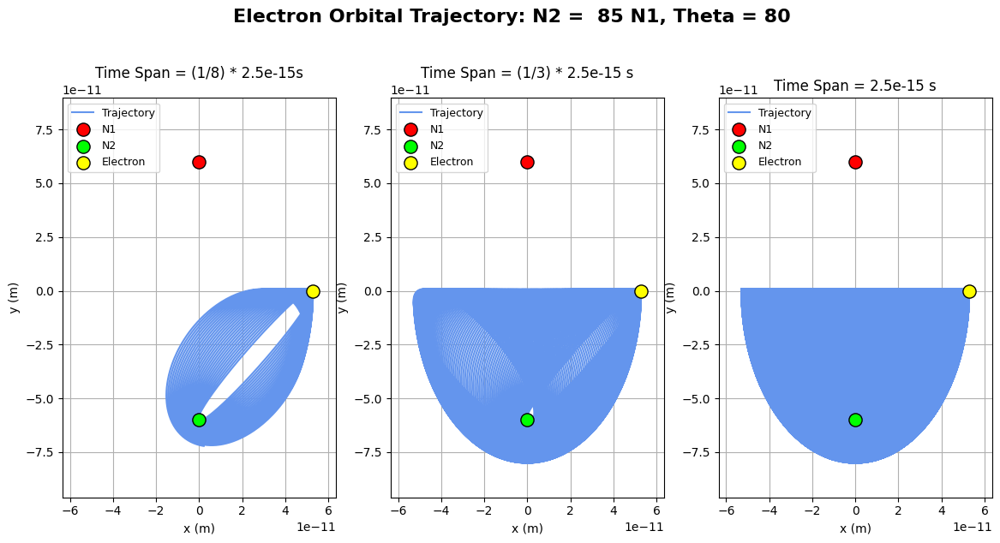

Is this a collision orbit? Yes


In [24]:
# Parameters to vary
n2 = 85 * 1.6e-19  # Nucleus 2 charge
angle = 80  # Launch angle in degrees
T = 2.5e-15 # time for simulation to run, s

sol = get_trajectory(n2, angle, T)
plot_trajectory(sol, 1.1, T, 80)
# Set up initial conditions


theta = math.radians(angle)
vx0 = math.cos(theta) * v0
vy0 = math.sin(theta) * v0
state0 = (r0, 0, vx0, vy0) 


# Run simulation
t_span = (0, T)

# Check Periodicity
is_periodic = check_periodicity(sol)
is_collision = check_collision(sol) 
print(f"Is this a collision orbit? {'Yes' if is_collision else 'No'}")



**Figure 26**. When $N_2 = 85N_1, \theta = 80$, the electron exhibits a very similar trajectory as the non-collision orbit. However, the trajectory slightly varies so that the electron collides with $N_2$.

From above, we see that the path the electron takes is very similar to that of the non-collision orbit, except that the electron does collide with $N_2$. Again, we look at the distances between the eelectorn, $N_1$, adn $N_2$ to quantify this.

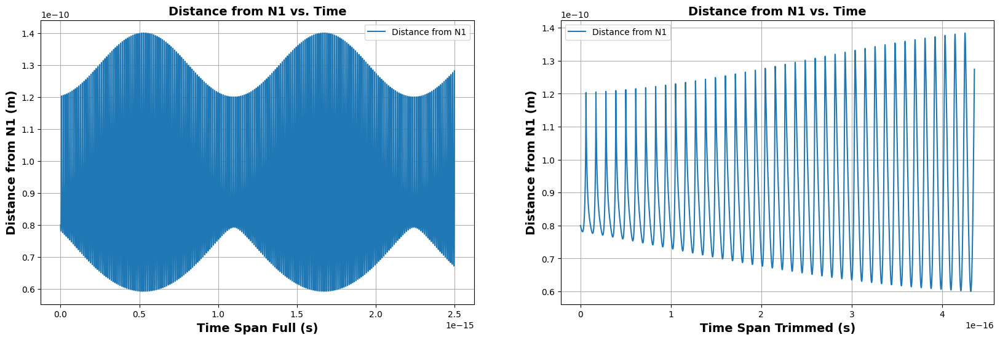

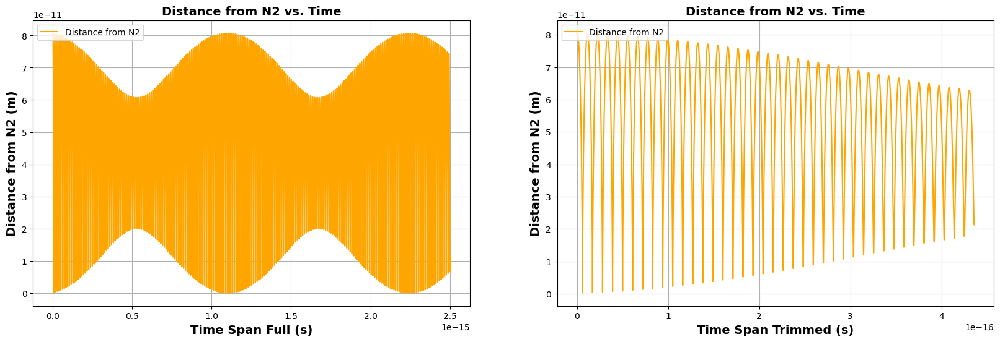

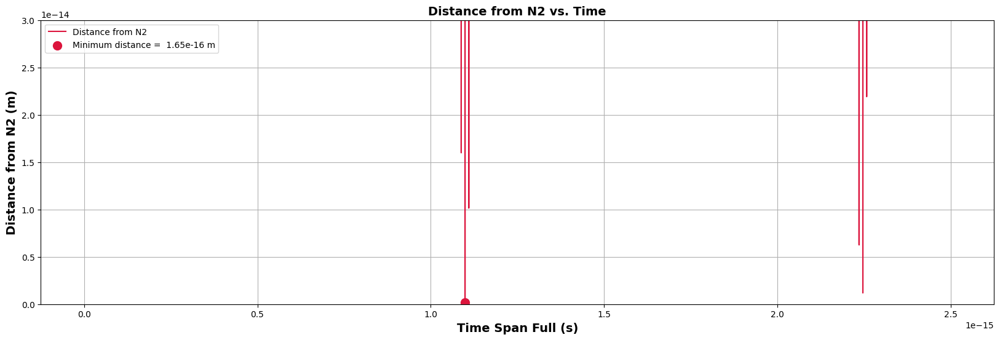

In [ ]:

r1 = np.sqrt((sol.y[0] - x1)**2 + (sol.y[1] - y1)**2)
r2 = np.sqrt((sol.y[0] - x2)**2 + (sol.y[1] - y2)**2) 


fig, ax = plt.subplots(1, 2) 
fig.set_size_inches((20,6))
ax[0].plot(sol.t,r1, label = "Distance from N1")
ax[0].set_title(f"Distance from N1 vs. Time", fontweight = "bold", fontsize = 14) 
ax[0].set_ylabel("Distance from N1 (m)", fontweight = "bold", fontsize = 14)
ax[0].set_xlabel("Time Span Full (s)", fontweight = "bold", fontsize = 14)
ax[0].grid(True)
ax[0].legend()

ax[1].plot(sol.t[0:8000],r1[0:8000], label = "Distance from N1")
ax[1].set_title(f"Distance from N1 vs. Time", fontweight = "bold", fontsize = 14) 
ax[1].set_ylabel("Distance from N1 (m)", fontweight = "bold", fontsize = 14)
ax[1].set_xlabel("Time Span Trimmed (s)", fontweight = "bold", fontsize = 14)
ax[1].grid(True) 
ax[1].legend(loc = "upper left")

fig, ax = plt.subplots(1, 2) 
fig.set_size_inches((20,6))
ax[0].plot(sol.t,r2, c = "orange", label = "Distance from N2")
ax[0].set_title(f"Distance from N2 vs. Time", fontweight = "bold", fontsize = 14) 
ax[0].set_ylabel("Distance from N2 (m)", fontweight = "bold", fontsize = 14)
ax[0].set_xlabel("Time Span Full (s)", fontweight = "bold", fontsize = 14)
ax[0].grid(True) 
ax[0].legend(loc = "upper left")

ax[1].plot(sol.t[0:8000],r2[0:8000], c = "orange", label = "Distance from N2")
ax[1].set_title(f"Distance from N2 vs. Time", fontweight = "bold", fontsize = 14) 
ax[1].set_ylabel("Distance from N2 (m)", fontweight = "bold", fontsize = 14)
ax[1].set_xlabel("Time Span Trimmed (s)", fontweight = "bold", fontsize = 14)
ax[1].grid(True) 
ax[1].legend(loc = "upper left")

fig, ax = plt.subplots(1) 
fig.set_size_inches((20,6))
minimum = min(r2)
index = np.where(r2 == minimum)
ax.plot(sol.t,r2, c = "crimson", label = "Distance from N2") 
ax.scatter(sol.t[index], minimum, c = "crimson",  s = 100, label = f"Minimum distance = {minimum: 0.2e} m")
ax.set_title(f"Distance from N2 vs. Time", fontweight = "bold", fontsize = 14) 
ax.set_ylabel("Distance from N2 (m)", fontweight = "bold", fontsize = 14)
ax.set_xlabel("Time Span Full (s)", fontweight = "bold", fontsize = 14)
ax.set_ylim(0,3e-14) 
ax.grid(True) 
ax.legend(loc = "upper left")

**Figure 31 a, b, c**.  Subplots of the distances between the electron and $N_1$ (a) and $N_2$ (b, c). We see sinusoidal-like patterns for all three subplots that are packaged in a larger sinusoidal-like shape, just like the non-collision orbit. However, the amplitudes of the oscillations are larger.

We see from above that the graphs of Distance from $N_1$ vs. Time and Distance from $N_2$ vs. Time are very similar to that of the non-collision orbit. However, looking at **Figure 27c**, we observe that the amplitudes of the oscillations for $N_2$ are larger; the minimum distance from $N_2$ is 1.65e-16m, yielding a collision with the nucleus. 

Hence, from this comparison, we can infer that the periodic patterns seen in the upper half of the full phase space graph are due to the slight variances in amplitudes in the distances between $N_2$ and the electron, but not due to complete differences in orbital trajectory shapes.

### Pattern 2: Claw-Mark Collisions

![Claw](https://i.imgur.com/7d68nzP.png)

**Figure 32**. Zoomed-in image of claw-mark collisions.

Next, we look at the upper left portion of the graph, where collisions in a claw-mark like pattern are seen. Again, we first zoom into this region to see the patterns in more detail.


PARTIAL 2D QUANTITATIVE PHASE SPACE SCAN: Period Variability
Theta axis: 30 points from 0° to 90°
N2 axis: 30 points from N1/100 to 100*N1
  N2/N1 range: 5.000 to 15.0
Total simulations: 900


N2/N1 = 5.000 (1/30)
  Progress: 30/900 (3.3%) | Rate: 1.7 sim/s | ETA: 501s
N2/N1 = 5.345 (2/30)
  Progress: 60/900 (6.7%) | Rate: 1.7 sim/s | ETA: 496s
N2/N1 = 5.690 (3/30)
  Progress: 90/900 (10.0%) | Rate: 1.6 sim/s | ETA: 494s
N2/N1 = 6.034 (4/30)
  Progress: 120/900 (13.3%) | Rate: 1.6 sim/s | ETA: 486s
N2/N1 = 6.379 (5/30)
  Progress: 150/900 (16.7%) | Rate: 1.6 sim/s | ETA: 477s
N2/N1 = 6.724 (6/30)
  Progress: 180/900 (20.0%) | Rate: 1.5 sim/s | ETA: 469s
N2/N1 = 7.069 (7/30)
  Progress: 210/900 (23.3%) | Rate: 1.5 sim/s | ETA: 460s
N2/N1 = 7.414 (8/30)
  Progress: 240/900 (26.7%) | Rate: 1.5 sim/s | ETA: 448s
N2/N1 = 7.759 (9/30)
  Progress: 270/900 (30.0%) | Rate: 1.4 sim/s | ETA: 436s
N2/N1 = 8.103 (10/30)
  Progress: 300/900 (33.3%) | Rate: 1.4 sim/s | ETA: 424s
N2/N1 = 8.448 (11/30

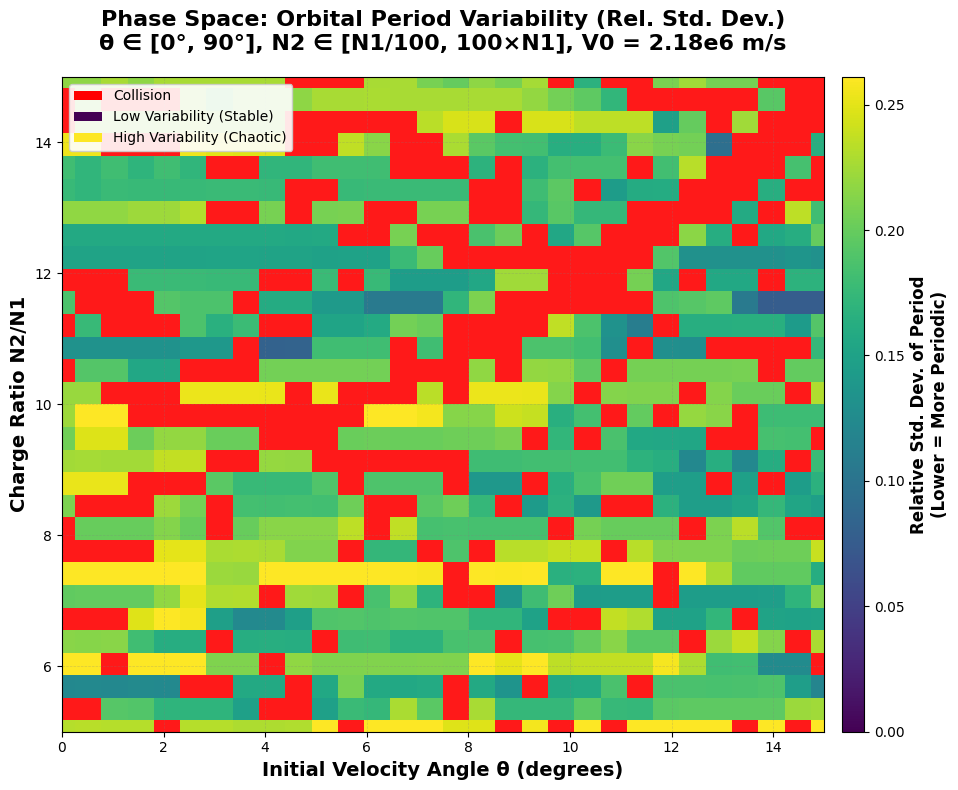


Results saved to 'lowphase_space_heatmap_results.npz'


In [9]:
import numpy as np 

print("\n" + "="*70)
input("Press Enter to start quantitative phase space scan...")

theta_min = 0
theta_max = 15
n_min = 5
n_max = 15

results_grid, theta_range, n2_range = scan_phase_space_partial(n_theta=30, n_n2=30, theta_min = theta_min, theta_max = theta_max, n_min = n_min, n_max = n_max)

# Plot results
plot_phase_space_partial(results_grid, theta_range, n2_range, theta_min, theta_max, n_min, n_max)

# Save results
np.savez('partial_phase_space_heatmap_results.npz', 
         results_grid=results_grid,
         theta_range=theta_range,
         n2_range=n2_range,
         n1=n1)
print("\nResults saved to 'lowphase_space_heatmap_results.npz'")

**Figure 33**. Zoom-in phase space simulation of the region $0 \leq \theta \leq 15$ and $5 \leq \frac{N_2}{N_1} \leq 15$. Streaks of collisions are shown, forming "claw-like" patterns in the phase space graph–this is the "claw mark" we are analyzing. 

From above, we see a diagonal streak of collisions from the top right to the bottom left in the center of the graph. We also see collision orbits surrounding it, which, from the original phase space graph, form the periodic patterns of collisions.

Similar to the analysis from Pattern 1, next we pick 1 parameter combination that allows the "claw mark" streak of collisions, and 1 parameter combination that does not yield a collision. We also compare the former to the collisions found in the periodic patterns in Pattern 1 to see if there are any differences.

#### Pattern 2: Collision Orbit ($N_2 = 18.5 N_1, \theta = 8$)

We first look at a collision orbit allow the path of the "claw-mark streak". We pick $N_2 = 10.5 N_1$ and $\theta = 8 $.

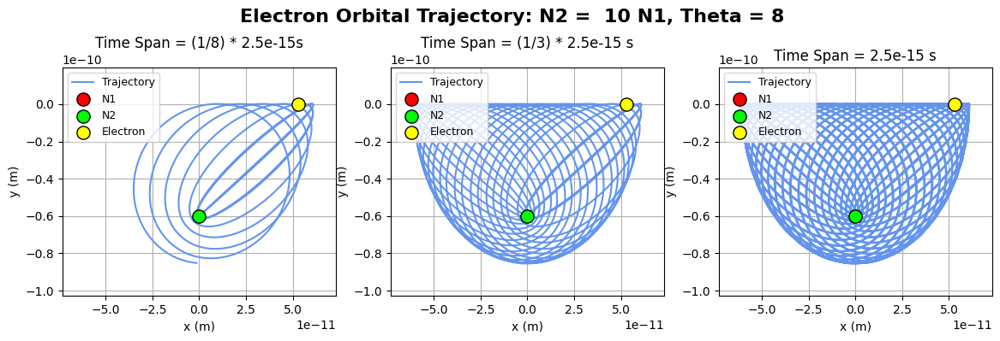

Is this a collision orbit? Yes


In [ ]:
# Parameters to vary
n2 = 10.5 * 1.6e-19  # Nucleus 2 charge
angle = 8  # Launch angle in degrees
T = 2.5e-15 # time for simulation to run, s

sol = get_trajectory(n2, angle, T)
plot_trajectory(sol, 1.4, T, 80)
# Set up initial conditions


theta = math.radians(angle)
vx0 = math.cos(theta) * v0
vy0 = math.sin(theta) * v0
state0 = (r0, 0, vx0, vy0) 


# Run simulation
t_span = (0, T)

# Check Periodicity
is_periodic = check_periodicity(sol)
is_collision = check_collision(sol) 
print(f"Is this a collision orbit? {'Yes' if is_collision else 'No'}")

**Figure 34**. When $N_2 = 10.5 N_1, \theta = 8$, the trajectory made by the electron is similar to that of the periodic collision patterns.

Along the claw-mark, the electron seems to trace a path similar to the periodic collision orbits. However, the electron exhibits much more drift, creating a shape that is much less dense than the previous orbits; even after orbiting for the entire 2.5e-15s, we still see many "holes" in the electron path. We next plot the distances between the electron, $N_1$, and $N_2$.

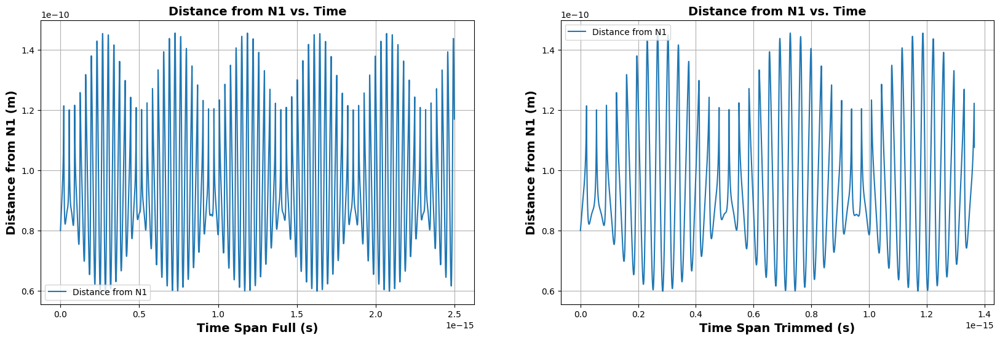

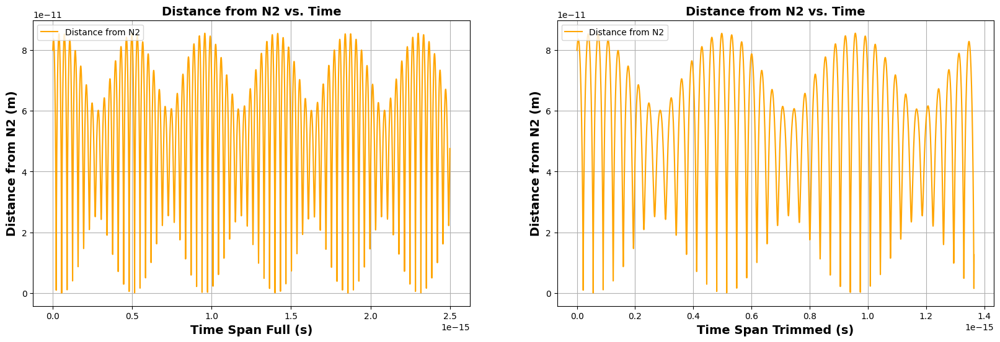

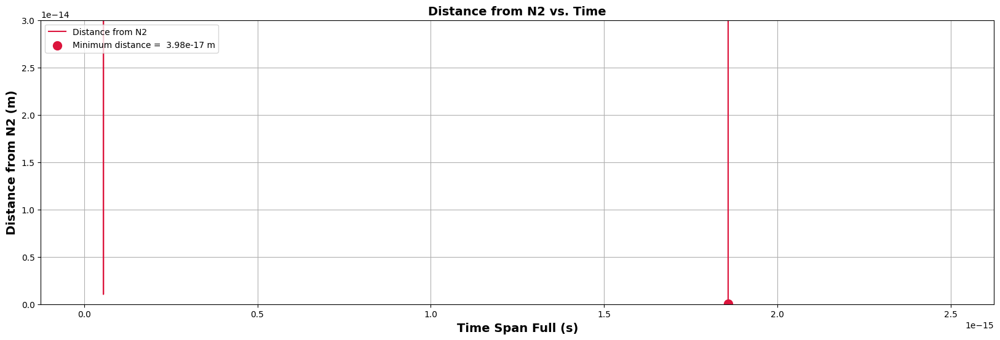

In [14]:

r1 = np.sqrt((sol.y[0] - x1)**2 + (sol.y[1] - y1)**2)
r2 = np.sqrt((sol.y[0] - x2)**2 + (sol.y[1] - y2)**2) 


fig, ax = plt.subplots(1, 2) 
fig.set_size_inches((20,6))
ax[0].plot(sol.t,r1, label = "Distance from N1")
ax[0].set_title(f"Distance from N1 vs. Time", fontweight = "bold", fontsize = 14) 
ax[0].set_ylabel("Distance from N1 (m)", fontweight = "bold", fontsize = 14)
ax[0].set_xlabel("Time Span Full (s)", fontweight = "bold", fontsize = 14)
ax[0].grid(True)
ax[0].legend()

ax[1].plot(sol.t[0:8000],r1[0:8000], label = "Distance from N1")
ax[1].set_title(f"Distance from N1 vs. Time", fontweight = "bold", fontsize = 14) 
ax[1].set_ylabel("Distance from N1 (m)", fontweight = "bold", fontsize = 14)
ax[1].set_xlabel("Time Span Trimmed (s)", fontweight = "bold", fontsize = 14)
ax[1].grid(True) 
ax[1].legend(loc = "upper left")

fig, ax = plt.subplots(1, 2) 
fig.set_size_inches((20,6))
ax[0].plot(sol.t,r2, c = "orange", label = "Distance from N2")
ax[0].set_title(f"Distance from N2 vs. Time", fontweight = "bold", fontsize = 14) 
ax[0].set_ylabel("Distance from N2 (m)", fontweight = "bold", fontsize = 14)
ax[0].set_xlabel("Time Span Full (s)", fontweight = "bold", fontsize = 14)
ax[0].grid(True) 
ax[0].legend(loc = "upper left")

ax[1].plot(sol.t[0:8000],r2[0:8000], c = "orange", label = "Distance from N2")
ax[1].set_title(f"Distance from N2 vs. Time", fontweight = "bold", fontsize = 14) 
ax[1].set_ylabel("Distance from N2 (m)", fontweight = "bold", fontsize = 14)
ax[1].set_xlabel("Time Span Trimmed (s)", fontweight = "bold", fontsize = 14)
ax[1].grid(True) 
ax[1].legend(loc = "upper left")

fig, ax = plt.subplots(1) 
fig.set_size_inches((20,6))
minimum = min(r2)
index = np.where(r2 == minimum)
ax.plot(sol.t,r2, c = "crimson", label = "Distance from N2") 
ax.scatter(sol.t[index], minimum, c = "crimson",  s = 100, label = f"Minimum distance = {minimum: 0.2e} m")
ax.set_title(f"Distance from N2 vs. Time", fontweight = "bold", fontsize = 14) 
ax.set_ylabel("Distance from N2 (m)", fontweight = "bold", fontsize = 14)
ax.set_xlabel("Time Span Full (s)", fontweight = "bold", fontsize = 14)
ax.set_ylim(0,3e-14) 
ax.grid(True) 
ax.legend(loc = "upper left")

**Figure 35 a, b, c**.  Subplots of the distances between the electron and $N_1$ (a) and $N_2$ (b, c). Similar to the previous orbits, we see sinusoidal-like patterns for all three subplots that are packaged in a larger sinusoidal-like shape.

From these subplots, we see that the general graph shows similarities to that of pattern 1: the electrons exhibit oscillatory patterns whose amplitudes vary periodically. However, we notice three stark differences: 

1. **Frequency of Oscillations**: The average frequency of oscillations is much lower; we can see this from the **Figure 35a** on the left, where the spacing between each oscillation can be very visible compared to the distances in the periodic collision patterns, which are so dense that the individual oscillations cannot be seen. 
2. **Frequency of Amplitude Variation**: In contrast, the average time it takes for the amplitude to grow and shrink back to its original value is much quicker; due to this, the graphs no longer look like oscillations packaged in a sinusoidal pattern, but in wavepackets. 
3. **Maximum amplitude of distances**: From **Figure 35c**, the minimum distance between $N_2$ and the electron is nearly an order of magnitude smaller.  

Next, we look at a non-collision orbit.

#### Pattern 2: Non-Collision Orbit ($N_2 = 8N_1$ and $\theta = 4$)

For this, we pick $N_2 = 8N_1$ and $\theta = 4$.

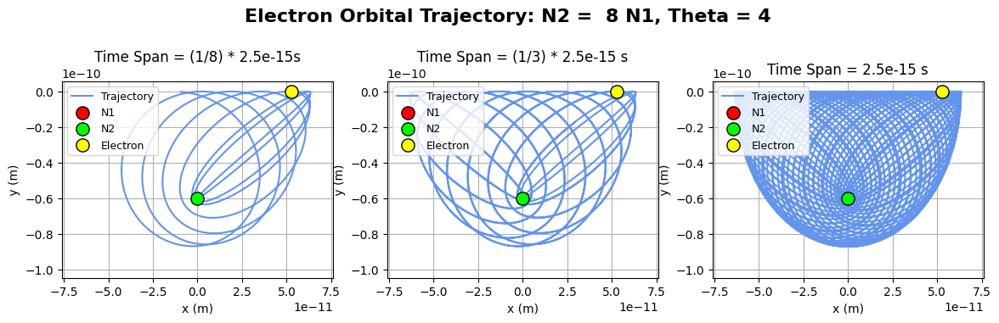

Is this a collision orbit? No


In [76]:
# Parameters to vary
n2 = 8 * 1.6e-19  # Nucleus 2 charge
angle = 4  # Launch angle in degrees
T = 2.5e-15 # time for simulation to run, s

sol = get_trajectory(n2, angle, T)
plot_trajectory(sol, 1.4, T, 80)
# Set up initial conditions


theta = math.radians(angle)
vx0 = math.cos(theta) * v0
vy0 = math.sin(theta) * v0
state0 = (r0, 0, vx0, vy0) 


# Run simulation
t_span = (0, T)

# Check Periodicity
is_periodic = check_periodicity(sol)
is_collision = check_collision(sol) 
print(f"Is this a collision orbit? {'Yes' if is_collision else 'No'}") 

**Figure 36**. When $N_2 = 8N_1, \theta = 4$, the path traced by the electron is very similar to the collision orbit, but the density of the shape it traces is much denser.

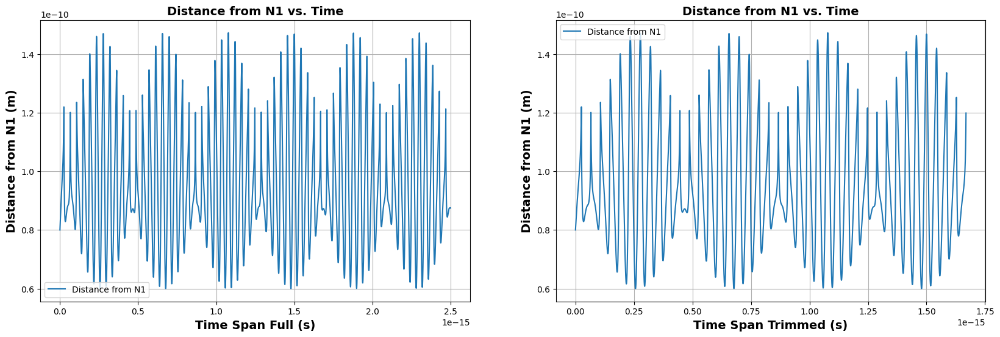

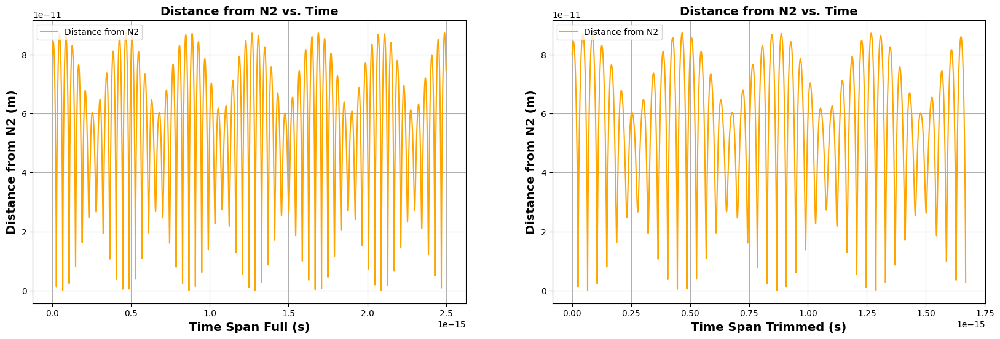

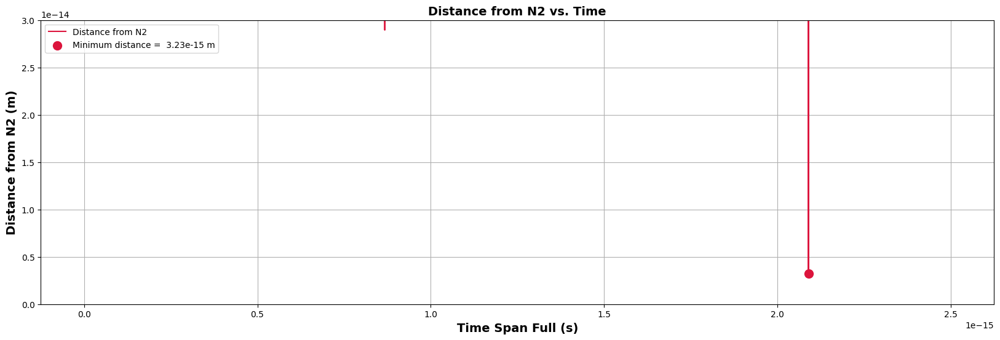

In [17]:

r1 = np.sqrt((sol.y[0] - x1)**2 + (sol.y[1] - y1)**2)
r2 = np.sqrt((sol.y[0] - x2)**2 + (sol.y[1] - y2)**2) 


fig, ax = plt.subplots(1, 2) 
fig.set_size_inches((20,6))
ax[0].plot(sol.t,r1, label = "Distance from N1")
ax[0].set_title(f"Distance from N1 vs. Time", fontweight = "bold", fontsize = 14) 
ax[0].set_ylabel("Distance from N1 (m)", fontweight = "bold", fontsize = 14)
ax[0].set_xlabel("Time Span Full (s)", fontweight = "bold", fontsize = 14)
ax[0].grid(True)
ax[0].legend()

ax[1].plot(sol.t[0:8000],r1[0:8000], label = "Distance from N1")
ax[1].set_title(f"Distance from N1 vs. Time", fontweight = "bold", fontsize = 14) 
ax[1].set_ylabel("Distance from N1 (m)", fontweight = "bold", fontsize = 14)
ax[1].set_xlabel("Time Span Trimmed (s)", fontweight = "bold", fontsize = 14)
ax[1].grid(True) 
ax[1].legend(loc = "upper left")

fig, ax = plt.subplots(1, 2) 
fig.set_size_inches((20,6))
ax[0].plot(sol.t,r2, c = "orange", label = "Distance from N2")
ax[0].set_title(f"Distance from N2 vs. Time", fontweight = "bold", fontsize = 14) 
ax[0].set_ylabel("Distance from N2 (m)", fontweight = "bold", fontsize = 14)
ax[0].set_xlabel("Time Span Full (s)", fontweight = "bold", fontsize = 14)
ax[0].grid(True) 
ax[0].legend(loc = "upper left")

ax[1].plot(sol.t[0:8000],r2[0:8000], c = "orange", label = "Distance from N2")
ax[1].set_title(f"Distance from N2 vs. Time", fontweight = "bold", fontsize = 14) 
ax[1].set_ylabel("Distance from N2 (m)", fontweight = "bold", fontsize = 14)
ax[1].set_xlabel("Time Span Trimmed (s)", fontweight = "bold", fontsize = 14)
ax[1].grid(True) 
ax[1].legend(loc = "upper left")

fig, ax = plt.subplots(1) 
fig.set_size_inches((20,6))
minimum = min(r2)
index = np.where(r2 == minimum)
ax.plot(sol.t,r2, c = "crimson", label = "Distance from N2") 
ax.scatter(sol.t[index], minimum, c = "crimson",  s = 100, label = f"Minimum distance = {minimum: 0.2e} m")
ax.set_title(f"Distance from N2 vs. Time", fontweight = "bold", fontsize = 14) 
ax.set_ylabel("Distance from N2 (m)", fontweight = "bold", fontsize = 14)
ax.set_xlabel("Time Span Full (s)", fontweight = "bold", fontsize = 14)
ax.set_ylim(0,3e-14) 
ax.grid(True) 
ax.legend(loc = "upper left")

**Figure 37**. When $N_2 = 8N_1$ and $\theta = 4$, the distance between the electron, $N_1$, and $N_2$ show very similar graphs, with oscillatory and wavepacket-like behaviour.

From these subplots, we see that the difference described in the collision orbit also applies to the non-collision orbit. Hence, it is not due to these attributes that a claw-mark collision streak is seen. However, the minimum distance between $N_2$ and the electron is an entire two orders of magnitude less than the collision orbit. So again, the collision orbit is simply due to the slight variances in amplitudes in the distances between $N_2$ and the electron, but not due to complete differences in orbital trajectory shapes.

### Pattern 3: Neon Band above Lower Third Region 

![Neon2](https://i.imgur.com/uLobMgJ.png) 

**Figure 38**. Zoomed-in image of neon band above the lower third region.

Next, we look at the neon band above the lower third region of the phase space analysis. From above, we see that there are very distinct changes in stability, from purple to green to neon yellow; here, we try to understand why this might be the case. Again, we first conduct a partial phase space analysis to zoom into this region.


PARTIAL 2D QUANTITATIVE PHASE SPACE SCAN: Period Variability
Theta axis: 50 points from 0° to 90°
N2 axis: 50 points from N1/100 to 100*N1
  N2/N1 range: 0.050 to 0.1
Total simulations: 2500


N2/N1 = 0.050 (1/50)
  Progress: 50/2500 (2.0%) | Rate: 19.3 sim/s | ETA: 127s
N2/N1 = 0.052 (2/50)
  Progress: 100/2500 (4.0%) | Rate: 18.6 sim/s | ETA: 129s
N2/N1 = 0.054 (3/50)
  Progress: 150/2500 (6.0%) | Rate: 18.7 sim/s | ETA: 126s
N2/N1 = 0.056 (4/50)
  Progress: 200/2500 (8.0%) | Rate: 18.1 sim/s | ETA: 127s
N2/N1 = 0.058 (5/50)
  Progress: 250/2500 (10.0%) | Rate: 17.7 sim/s | ETA: 127s
N2/N1 = 0.060 (6/50)
  Progress: 300/2500 (12.0%) | Rate: 17.5 sim/s | ETA: 126s
N2/N1 = 0.062 (7/50)
  Progress: 350/2500 (14.0%) | Rate: 17.4 sim/s | ETA: 124s
N2/N1 = 0.064 (8/50)
  Progress: 400/2500 (16.0%) | Rate: 17.3 sim/s | ETA: 122s
N2/N1 = 0.066 (9/50)
  Progress: 450/2500 (18.0%) | Rate: 17.2 sim/s | ETA: 120s
N2/N1 = 0.068 (10/50)
  Progress: 500/2500 (20.0%) | Rate: 17.0 sim/s | ETA: 118s


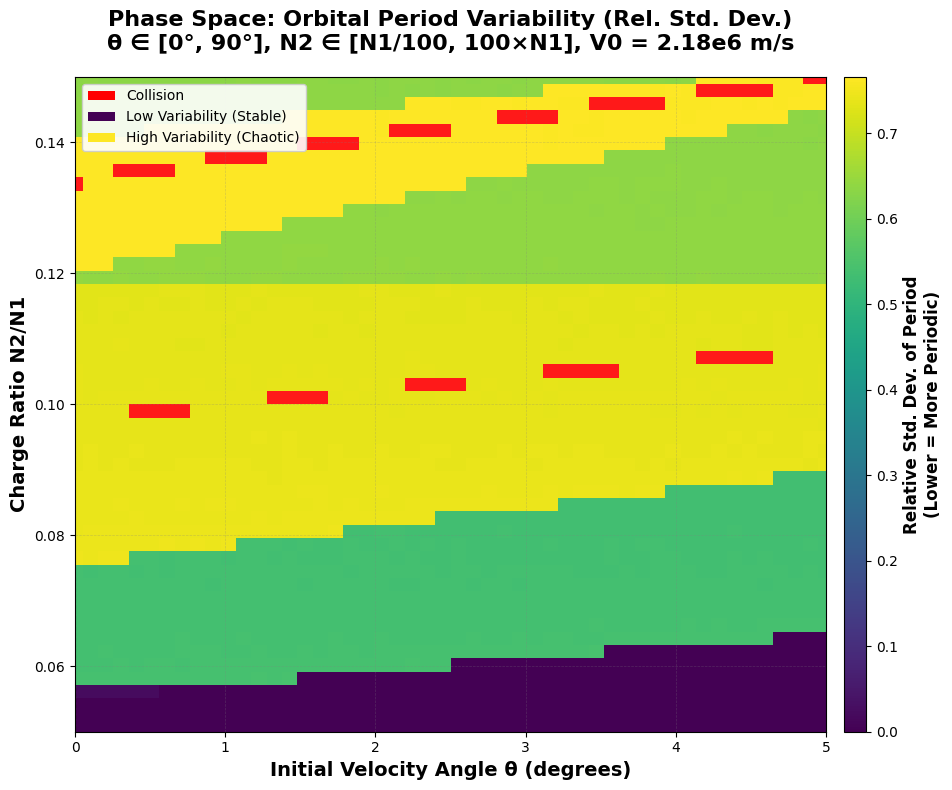


Results saved to 'lowphase_space_heatmap_results.npz'


In [19]:
import numpy as np 

print("\n" + "="*70)
input("Press Enter to start quantitative phase space scan...")

theta_min = 0
theta_max = 5
n_min = 0.05
n_max = 0.15

results_grid, theta_range, n2_range = scan_phase_space_partial(n_theta=50, n_n2=50, theta_min = theta_min, theta_max = theta_max, n_min = n_min, n_max = n_max)

# Plot results
plot_phase_space_partial(results_grid, theta_range, n2_range, theta_min, theta_max, n_min, n_max)

# Save results
np.savez('partial_phase_space_heatmap_results.npz', 
         results_grid=results_grid,
         theta_range=theta_range,
         n2_range=n2_range,
         n1=n1)
print("\nResults saved to 'lowphase_space_heatmap_results.npz'")

**Figure 39**. Partial phase space graph of the domain $0 \leq \theta \leq 5$ and $0 \leq \frac{N_2}{N_1} \leq 0.15$. Stark differences in relative standard deviation of the period ranging from 0 to 0.7. 

From this partial phase space, we see in further detail that there are very stark differences in the relative standard deviation of the period, with horizontal regions of solid colour. Crucially, these regions of distinct colour do not fade into one another, indicating a gradual change in stability. Instead, we see very sudden streaks of colour. To understand this more in  detail, we pick three different parameter combinations to analyse: one with a relative standard deviation of 0-0.1 (purple), one from 0.4-0.6 (green), and one higher than 0.7 (yellow).

#### Pattern 3: Relative Standard Deviation 0-0.1 ($N_2 = 0.02N_1, \theta = 5$)

We first investigate an orbit with a relative standard deviation of under 10%. We pick $N_2 = 0.02N_1, \theta = 5$.

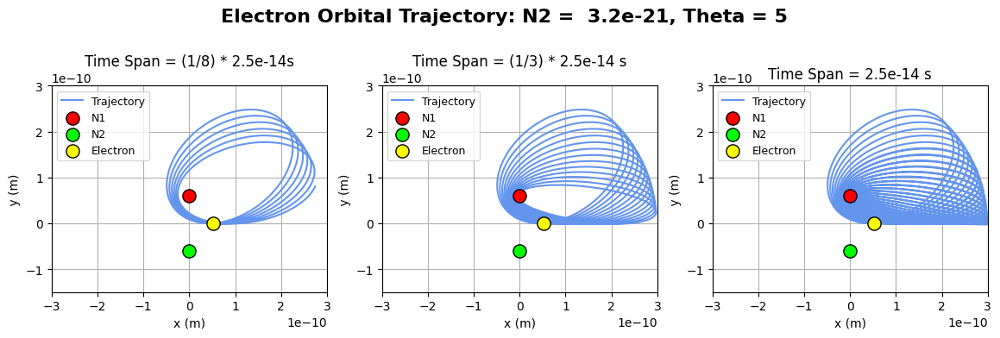

Is this a collision orbit? Yes


In [81]:
# Parameters to vary
n2 = 0.02 * 1.6e-19  # Nucleus 2 charge
angle = 5 # Launch angle in degrees
T = 2.5e-14 # time for simulation to run, s

sol1 = get_trajectory(n2, angle, T)


#Plot trajectory 

fig, ax = plt.subplots(1, 3)
fig.set_size_inches(14, 12)
fig.suptitle(f'Electron Orbital Trajectory: N2 = {n2: 0.2g}, Theta = {angle}', fontsize=16, fontweight='bold')
plt.subplots_adjust(top=1.5) 

ax[2].plot(sol1.y[0], sol1.y[1], label = "Trajectory",c = "cornflowerblue") 
ax[2].set_aspect("equal") 
ax[2].set_title(f"Time Span = {T} s") 
ax[2].set_xlabel("x (m)")
ax[2].set_ylabel(" y (m) ")
ax[2].grid(True) 
ax[2].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
ax[2].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
ax[2].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
ax[2].legend(loc='upper left', fontsize=9) 

# Get the one-third index
idx1 = len(sol1.t) // 3

# Plot only the first one-third of the data
ax[1].plot(sol1.y[0][:idx1], sol1.y[1][:idx1], label="Trajectory", c="cornflowerblue")
ax[1].set_aspect("equal") 
ax[1].set_title(f"Time Span = (1/3) * {T} s") 
ax[1].set_xlabel("x (m)")
ax[1].set_ylabel(" y (m) ")
ax[1].grid(True) 
ax[1].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
ax[1].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
ax[1].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
ax[1].legend(loc='upper left', fontsize=9) 

# Get the one-tenth index
idx2 = len(sol1.t) // 8

# Plot only the first one-third of the data
ax[0].plot(sol1.y[0][:idx2], sol1.y[1][:idx2], label="Trajectory", c="cornflowerblue")
ax[0].set_aspect("equal") 
ax[0].set_title(f"Time Span = (1/8) * {T}s") 
ax[0].set_xlabel("x (m)")
ax[0].set_ylabel(" y (m) ")
ax[0].grid(True) 
ax[0].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
ax[0].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
ax[0].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
ax[0].legend(loc='upper left', fontsize=9) 

# Find global min and max for x and y
#x_min, x_max = 1.2 * sol1.y[0].min(), 1.2 * sol1.y[0].max()
#y_min, y_max = 1.2 * sol1.y[1].min(), 1.2 * sol1.y[1].max()

# Apply limits to all subplots
for a in ax:
    a.set_ylim(-15e-11, 30e-11)
    a.set_xlim(-3e-10,3e-10)
plt.show()

# Set up initial conditions


theta = math.radians(angle)
vx0 = math.cos(theta) * v0
vy0 = math.sin(theta) * v0
state0 = (r0, 0, vx0, vy0) 


# Run simulation
t_span = (0, T)

# Check Periodicity
is_periodic = check_periodicity(sol)
is_collision = check_collision(sol) 
print(f"Is this a collision orbit? {'Yes' if is_collision else 'No'}") 

**Figure 40**. When $N_2 = 0.02 N_1, \theta = 5$, we see trajectory where the electron only orbits $N_1$ in an off-center elliptical path, with drift causing it to form a shell-like shape.

From these plots, we see that the electron orbits $N_1$ elliptically, with drift to the left; this creates a shell-like shape, which would eventually form a half-sphere. To understand the relative standard deviation more thoroughly, we look at the histogram of periodicities.


ORBITAL PERIOD STATISTICS
Number of complete orbits: 2
Mean period: 7.36e-16 s
Standard deviation: 1.55e-19 s
Relative std dev: 0.02%
Minimum period: 7.36e-16 s
Maximum period: 7.36e-16 s
Range: 3.11e-19 s 

Is the orbit periodic? Yes


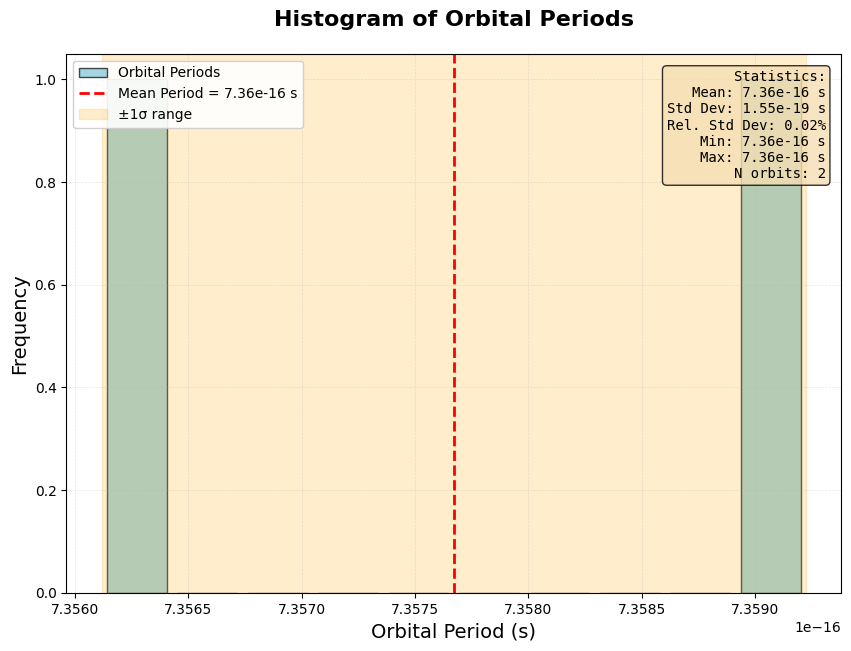

In [60]:
# Set up initial conditions


angle = 5
theta = math.radians(angle)
vx0 = math.cos(theta) * v0
vy0 = math.sin(theta) * v0
state0 = (r0, 0, vx0, vy0) 

T = 2.5e-15  # time for simulation to run, s

# Set n2 as global for diff_eqns to use
n2 = 0.02 * 1.6e-19

# Run simulation
t_span = (0, T)
sol = solve_ivp(diff_eqns, t_span, state0, 
rtol=1e-9, atol=1e-9, 
max_step=1e-17) 

# Check Periodicity
is_periodic = check_periodicity(sol)

# Generate Graph of Periods  
# Calculate distance from starting position
x0, y0 = sol.y[0][0], sol.y[1][0]
distances = np.sqrt((sol.y[0] - x0)**2 + (sol.y[1] - y0)**2)

# Find local minima (returns to starting region)
peaks, _ = find_peaks(-distances, distance=len(distances)//20)

# Calculate periods
periods = np.diff(sol.t[peaks])

# Calculate relative standard deviation
period_mean = np.mean(periods)
period_std = np.std(periods)
period_std_rel = period_std / period_mean 

n = []
for i in range(len(periods)):
    n.append(i+1)



# Make histogram of periods
figsize = (10, 7)
plt.figure(figsize=figsize)

# Create histogram
counts, bins, patches = plt.hist(periods, bins=10, color="#7cc4d6", 
                                  rwidth=0.85, label='Orbital Periods', 
                                  edgecolor='black', alpha=0.7)
# Graph vertical line at mean period
plt.axvline(x=period_mean, color='red', linestyle='--', linewidth=2, 
            label=f'Mean Period = {period_mean:.2e} s') 



stats_text = f'Statistics:\n' \
             f'Mean: {period_mean:.2e} s\n' \
             f'Std Dev: {period_std:.2e} s\n' \
             f'Rel. Std Dev: {period_std_rel:.2%}\n' \
             f'Min: {np.min(periods):.2e} s\n' \
             f'Max: {np.max(periods):.2e} s\n' \
             f'N orbits: {len(periods)}'

props = dict(boxstyle='round', facecolor='wheat', alpha=0.8)
plt.text(0.98, 0.97, stats_text, transform=plt.gca().transAxes, 
         fontsize=10, verticalalignment='top', horizontalalignment='right',
         bbox=props, family='monospace')

# Grid for easier reading
plt.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)

plt.axvspan(period_mean - period_std, period_mean + period_std, 
            alpha=0.2, color='orange', label='±1σ range')

# Legend
plt.legend(loc='upper left', fontsize=10, framealpha=0.9)

plt.title('Histogram of Orbital Periods', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Orbital Period (s)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

print("\n" + "="*50)
print("ORBITAL PERIOD STATISTICS")
print("="*50)
print(f"Number of complete orbits: {len(periods)}")
print(f"Mean period: {period_mean:.2e} s")
print(f"Standard deviation: {period_std:.2e} s")
print(f"Relative std dev: {period_std_rel:.2%}")
print(f"Minimum period: {np.min(periods):.2e} s")
print(f"Maximum period: {np.max(periods):.2e} s")
print(f"Range: {np.max(periods) - np.min(periods):.2e} s \n")
print(f"Is the orbit periodic? {'Yes' if is_periodic else 'No'}")
print("="*50)

**Figure 41**. Histogram of orbital periods when $N_2 = 0.02 N_1, \theta = 5$. All orbital periods lie in two bins, with the relative standard deviation being 0.02%.

From the above, we see that the relative standard deviation is 0.02%. This is compatible with **Figure 40**, where we see that while the electron experiences drift, its orbital shape generally does not change. 

#### Pattern 3: Relative Standard Deviation 0.4-0.6 ($N_2 = 0.08N_1, \theta = 5$)

We first investigate an orbit with a relative standard deviation of under 10%. We pick $N_2 = 0.08N_1, \theta = 5$.

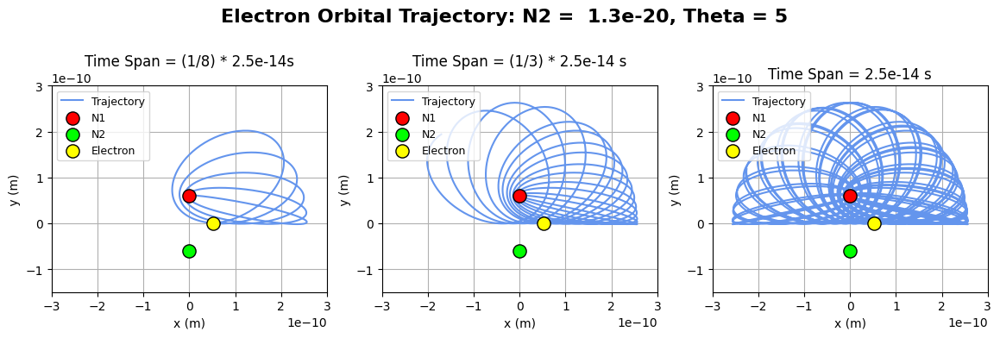

Is this a collision orbit? Yes


In [80]:
# Parameters to vary
n2 = 0.08 * 1.6e-19  # Nucleus 2 charge
angle = 5 # Launch angle in degrees
T = 2.5e-14 # time for simulation to run, s

sol1 = get_trajectory(n2, angle, T)


#Plot trajectory 

fig, ax = plt.subplots(1, 3)
fig.set_size_inches(14, 12)
fig.suptitle(f'Electron Orbital Trajectory: N2 = {n2: 0.2g}, Theta = {angle}', fontsize=16, fontweight='bold')
plt.subplots_adjust(top=1.5) 

ax[2].plot(sol1.y[0], sol1.y[1], label = "Trajectory",c = "cornflowerblue") 
ax[2].set_aspect("equal") 
ax[2].set_title(f"Time Span = {T} s") 
ax[2].set_xlabel("x (m)")
ax[2].set_ylabel(" y (m) ")
ax[2].grid(True) 
ax[2].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
ax[2].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
ax[2].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
ax[2].legend(loc='upper left', fontsize=9) 

# Get the one-third index
idx1 = len(sol1.t) // 3

# Plot only the first one-third of the data
ax[1].plot(sol1.y[0][:idx1], sol1.y[1][:idx1], label="Trajectory", c="cornflowerblue")
ax[1].set_aspect("equal") 
ax[1].set_title(f"Time Span = (1/3) * {T} s") 
ax[1].set_xlabel("x (m)")
ax[1].set_ylabel(" y (m) ")
ax[1].grid(True) 
ax[1].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
ax[1].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
ax[1].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
ax[1].legend(loc='upper left', fontsize=9) 

# Get the one-tenth index
idx2 = len(sol1.t) // 8

# Plot only the first one-third of the data
ax[0].plot(sol1.y[0][:idx2], sol1.y[1][:idx2], label="Trajectory", c="cornflowerblue")
ax[0].set_aspect("equal") 
ax[0].set_title(f"Time Span = (1/8) * {T}s") 
ax[0].set_xlabel("x (m)")
ax[0].set_ylabel(" y (m) ")
ax[0].grid(True) 
ax[0].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
ax[0].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
ax[0].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
ax[0].legend(loc='upper left', fontsize=9) 

# Find global min and max for x and y
#x_min, x_max = 1.2 * sol1.y[0].min(), 1.2 * sol1.y[0].max()
#y_min, y_max = 1.2 * sol1.y[1].min(), 1.2 * sol1.y[1].max()

# Apply limits to all subplots
for a in ax:
    a.set_ylim(-15e-11, 30e-11)
    a.set_xlim(-3e-10,3e-10)
plt.show()

# Set up initial conditions


theta = math.radians(angle)
vx0 = math.cos(theta) * v0
vy0 = math.sin(theta) * v0
state0 = (r0, 0, vx0, vy0) 


# Run simulation
t_span = (0, T)

# Check Periodicity
is_periodic = check_periodicity(sol)
is_collision = check_collision(sol) 
print(f"Is this a collision orbit? {'Yes' if is_collision else 'No'}") 

**Figure 42**. When $N_2 = 0.02 N_1, \theta = 5$. A similar shape is traced, where the electron ellptically orbits $N_1$ but drifts so that its trajectory forms a half-spherical shape.

From above, we see that the electron orbital trajectory is very similar to the first combination of parameters. However, we notice several differences: 

1. **Drift**: The electron experiences much more drift with  this parameter combination. By the end of the time span, we see that the electron has already traced an entire half-sphere, which is not seen in **Figure 40**. 
2. **Orbital Shape Variation**: As the electron experiences high drift, the eccentricity of the electron's orbits also changes drastically. From the first subplot, we see that the electron's path transforms from a very eccentric elliptical orbit to a much lesser one within 1/8 of its time span. This could possibly affect the variations of orbital periods drastically. We confirm this below with our histograms of orbital periods.


ORBITAL PERIOD STATISTICS
Number of complete orbits: 4
Mean period: 4.31e-16 s
Standard deviation: 2.31e-16 s
Relative std dev: 53.50%
Minimum period: 3.22e-17 s
Maximum period: 5.74e-16 s
Range: 5.42e-16 s 

Is the orbit periodic? No


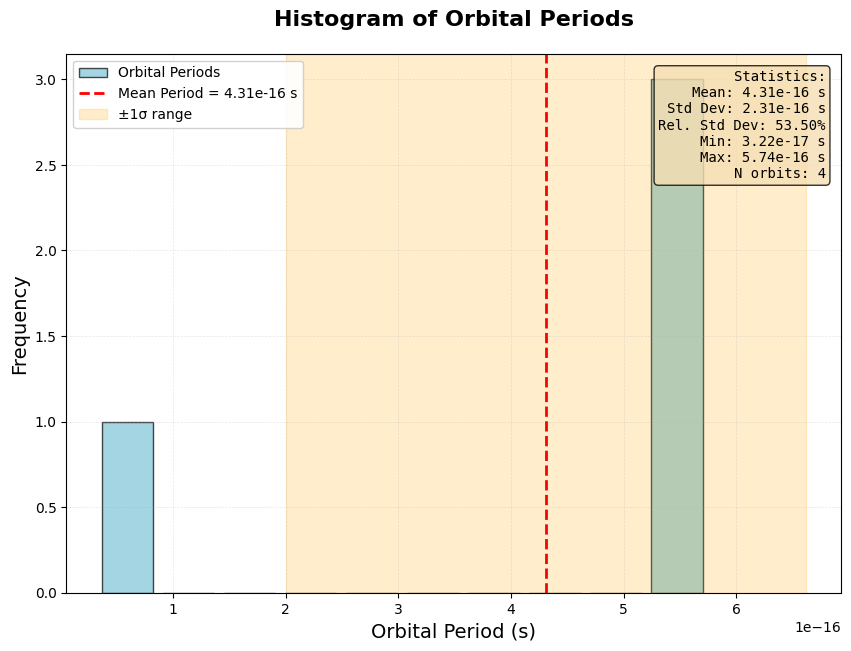

In [63]:
theta = math.radians(angle)
vx0 = math.cos(theta) * v0
vy0 = math.sin(theta) * v0
state0 = (r0, 0, vx0, vy0) 

T = 2.5e-15  # time for simulation to run, s


# Run simulation
t_span = (0, T)
sol = solve_ivp(diff_eqns, t_span, state0, 
rtol=1e-9, atol=1e-9, 
max_step=1e-17) 

# Check Periodicity
is_periodic = check_periodicity(sol)

# Generate Graph of Periods  
# Calculate distance from starting position
x0, y0 = sol.y[0][0], sol.y[1][0]
distances = np.sqrt((sol.y[0] - x0)**2 + (sol.y[1] - y0)**2)

# Find local minima (returns to starting region)
peaks, _ = find_peaks(-distances, distance=len(distances)//20)

# Calculate periods
periods = np.diff(sol.t[peaks])

# Calculate relative standard deviation
period_mean = np.mean(periods)
period_std = np.std(periods)
period_std_rel = period_std / period_mean 

n = []
for i in range(len(periods)):
    n.append(i+1)



# Make histogram of periods
figsize = (10, 7)
plt.figure(figsize=figsize)

# Create histogram
counts, bins, patches = plt.hist(periods, bins=10, color="#7cc4d6", 
                                  rwidth=0.85, label='Orbital Periods', 
                                  edgecolor='black', alpha=0.7)
# Graph vertical line at mean period
plt.axvline(x=period_mean, color='red', linestyle='--', linewidth=2, 
            label=f'Mean Period = {period_mean:.2e} s') 



stats_text = f'Statistics:\n' \
             f'Mean: {period_mean:.2e} s\n' \
             f'Std Dev: {period_std:.2e} s\n' \
             f'Rel. Std Dev: {period_std_rel:.2%}\n' \
             f'Min: {np.min(periods):.2e} s\n' \
             f'Max: {np.max(periods):.2e} s\n' \
             f'N orbits: {len(periods)}'

props = dict(boxstyle='round', facecolor='wheat', alpha=0.8)
plt.text(0.98, 0.97, stats_text, transform=plt.gca().transAxes, 
         fontsize=10, verticalalignment='top', horizontalalignment='right',
         bbox=props, family='monospace')

# Grid for easier reading
plt.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)

plt.axvspan(period_mean - period_std, period_mean + period_std, 
            alpha=0.2, color='orange', label='±1σ range')

# Legend
plt.legend(loc='upper left', fontsize=10, framealpha=0.9)

plt.title('Histogram of Orbital Periods', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Orbital Period (s)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

print("\n" + "="*50)
print("ORBITAL PERIOD STATISTICS")
print("="*50)
print(f"Number of complete orbits: {len(periods)}")
print(f"Mean period: {period_mean:.2e} s")
print(f"Standard deviation: {period_std:.2e} s")
print(f"Relative std dev: {period_std_rel:.2%}")
print(f"Minimum period: {np.min(periods):.2e} s")
print(f"Maximum period: {np.max(periods):.2e} s")
print(f"Range: {np.max(periods) - np.min(periods):.2e} s \n")
print(f"Is the orbit periodic? {'Yes' if is_periodic else 'No'}")
print("="*50)

**Figure 43**.  Histogram of orbital periods when $N_2 = 0.08 N_1, \theta = 5$. All orbital periods lie in two bins, with the relative standard deviation being 53.5%.

As seen from the histogram, the relative standard deviation has skyrocketed to 53.5%, most likely due to both the electron drift and its change in eccentricity in orbits. This explains why there is a stark difference in relative standard deviation in the original phase space graph. We expect the difference to be even more pronounced when the charge ratio is slightly higher; we check this in our third iteration.

#### Pattern 3: Relative Standard Deviation > 0.7 ($N_2 = 0.115N_1, \theta = 5$)

We first investigate an orbit with a relative standard deviation of under 10%. We pick $N_2 = 0.0115N_1, \theta = 5$.

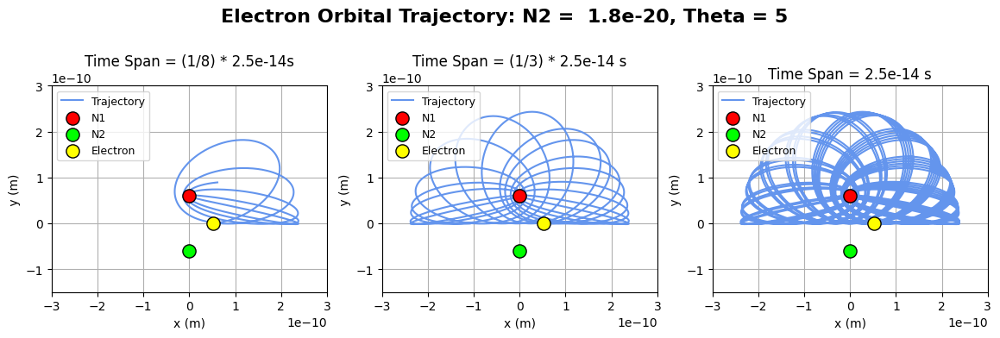

Is this a collision orbit? Yes


In [79]:
# Parameters to vary
n2 = 0.115 * 1.6e-19  # Nucleus 2 charge
angle = 5 # Launch angle in degrees
T = 2.5e-14 # time for simulation to run, s

sol1 = get_trajectory(n2, angle, T)


#Plot trajectory 

fig, ax = plt.subplots(1, 3)
fig.set_size_inches(14, 12)
fig.suptitle(f'Electron Orbital Trajectory: N2 = {n2: 0.2g}, Theta = {angle}', fontsize=16, fontweight='bold')
plt.subplots_adjust(top=1.5) 

ax[2].plot(sol1.y[0], sol1.y[1], label = "Trajectory",c = "cornflowerblue") 
ax[2].set_aspect("equal") 
ax[2].set_title(f"Time Span = {T} s") 
ax[2].set_xlabel("x (m)")
ax[2].set_ylabel(" y (m) ")
ax[2].grid(True) 
ax[2].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
ax[2].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
ax[2].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
ax[2].legend(loc='upper left', fontsize=9) 

# Get the one-third index
idx1 = len(sol1.t) // 3

# Plot only the first one-third of the data
ax[1].plot(sol1.y[0][:idx1], sol1.y[1][:idx1], label="Trajectory", c="cornflowerblue")
ax[1].set_aspect("equal") 
ax[1].set_title(f"Time Span = (1/3) * {T} s") 
ax[1].set_xlabel("x (m)")
ax[1].set_ylabel(" y (m) ")
ax[1].grid(True) 
ax[1].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
ax[1].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
ax[1].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
ax[1].legend(loc='upper left', fontsize=9) 

# Get the one-tenth index
idx2 = len(sol1.t) // 8

# Plot only the first one-third of the data
ax[0].plot(sol1.y[0][:idx2], sol1.y[1][:idx2], label="Trajectory", c="cornflowerblue")
ax[0].set_aspect("equal") 
ax[0].set_title(f"Time Span = (1/8) * {T}s") 
ax[0].set_xlabel("x (m)")
ax[0].set_ylabel(" y (m) ")
ax[0].grid(True) 
ax[0].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
ax[0].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
ax[0].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
ax[0].legend(loc='upper left', fontsize=9) 

# Find global min and max for x and y
#x_min, x_max = 1.2 * sol1.y[0].min(), 1.2 * sol1.y[0].max()
#y_min, y_max = 1.2 * sol1.y[1].min(), 1.2 * sol1.y[1].max()

# Apply limits to all subplots
for a in ax:
    a.set_ylim(-15e-11, 30e-11)
    a.set_xlim(-3e-10,3e-10)
plt.show()

# Set up initial conditions


theta = math.radians(angle)
vx0 = math.cos(theta) * v0
vy0 = math.sin(theta) * v0
state0 = (r0, 0, vx0, vy0) 


# Run simulation
t_span = (0, T)

# Check Periodicity
is_periodic = check_periodicity(sol)
is_collision = check_collision(sol) 
print(f"Is this a collision orbit? {'Yes' if is_collision else 'No'}") 

**Figure 44**. When $N_2 = 0.0115 N_1, \theta = 5$, the same half=spherical shape is traced, with an even larger electron drift and change in eccentric orbit. 


ORBITAL PERIOD STATISTICS
Number of complete orbits: 5
Mean period: 3.07e-16 s
Standard deviation: 2.25e-16 s
Relative std dev: 73.30%
Minimum period: 3.16e-17 s
Maximum period: 5.08e-16 s
Range: 4.77e-16 s 

Is the orbit periodic? No


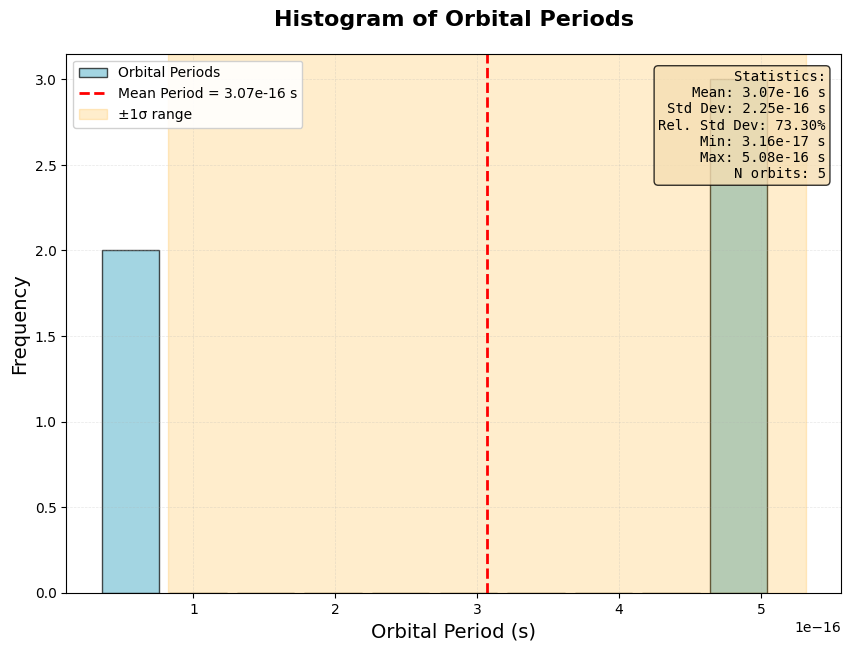

In [74]:
theta = math.radians(angle)
vx0 = math.cos(theta) * v0
vy0 = math.sin(theta) * v0
state0 = (r0, 0, vx0, vy0) 

T = 2.5e-15  # time for simulation to run, s


# Run simulation
t_span = (0, T)
sol = solve_ivp(diff_eqns, t_span, state0, 
rtol=1e-9, atol=1e-9, 
max_step=1e-17) 

# Check Periodicity
is_periodic = check_periodicity(sol)

# Generate Graph of Periods  
# Calculate distance from starting position
x0, y0 = sol.y[0][0], sol.y[1][0]
distances = np.sqrt((sol.y[0] - x0)**2 + (sol.y[1] - y0)**2)

# Find local minima (returns to starting region)
peaks, _ = find_peaks(-distances, distance=len(distances)//20)

# Calculate periods
periods = np.diff(sol.t[peaks])

# Calculate relative standard deviation
period_mean = np.mean(periods)
period_std = np.std(periods)
period_std_rel = period_std / period_mean 

n = []
for i in range(len(periods)):
    n.append(i+1)



# Make histogram of periods
figsize = (10, 7)
plt.figure(figsize=figsize)

# Create histogram
counts, bins, patches = plt.hist(periods, bins=10, color="#7cc4d6", 
                                  rwidth=0.85, label='Orbital Periods', 
                                  edgecolor='black', alpha=0.7)
# Graph vertical line at mean period
plt.axvline(x=period_mean, color='red', linestyle='--', linewidth=2, 
            label=f'Mean Period = {period_mean:.2e} s') 



stats_text = f'Statistics:\n' \
             f'Mean: {period_mean:.2e} s\n' \
             f'Std Dev: {period_std:.2e} s\n' \
             f'Rel. Std Dev: {period_std_rel:.2%}\n' \
             f'Min: {np.min(periods):.2e} s\n' \
             f'Max: {np.max(periods):.2e} s\n' \
             f'N orbits: {len(periods)}'

props = dict(boxstyle='round', facecolor='wheat', alpha=0.8)
plt.text(0.98, 0.97, stats_text, transform=plt.gca().transAxes, 
         fontsize=10, verticalalignment='top', horizontalalignment='right',
         bbox=props, family='monospace')

# Grid for easier reading
plt.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)

plt.axvspan(period_mean - period_std, period_mean + period_std, 
            alpha=0.2, color='orange', label='±1σ range')

# Legend
plt.legend(loc='upper left', fontsize=10, framealpha=0.9)

plt.title('Histogram of Orbital Periods', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Orbital Period (s)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

print("\n" + "="*50)
print("ORBITAL PERIOD STATISTICS")
print("="*50)
print(f"Number of complete orbits: {len(periods)}")
print(f"Mean period: {period_mean:.2e} s")
print(f"Standard deviation: {period_std:.2e} s")
print(f"Relative std dev: {period_std_rel:.2%}")
print(f"Minimum period: {np.min(periods):.2e} s")
print(f"Maximum period: {np.max(periods):.2e} s")
print(f"Range: {np.max(periods) - np.min(periods):.2e} s \n")
print(f"Is the orbit periodic? {'Yes' if is_periodic else 'No'}")

**Figure 45**.  Histogram of orbital periods when $N_2 = 0.115 N_1, \theta = 5$. All orbital periods lie in two bins, with the relative standard deviation being 73.3%.

With the relative standard deviation being 73.3%, we see that this is indeed the case.

Hence, the neon bands above the third region occur most likely due to an increase in electron drift, as well as increased change in orbital eccentricities.

### Pattern 4: Curves of Periodicity 
![Periodicity](https://i.imgur.com/GZwbMFZ.png)

**Figure 46.** Images of curves of periodicity.

Finally, we look at the curve of periodicity above. We first conduct a partial phase space scan of the region.


PARTIAL 2D QUANTITATIVE PHASE SPACE SCAN: Period Variability
Theta axis: 50 points from 0° to 90°
N2 axis: 50 points from N1/100 to 100*N1
  N2/N1 range: 0.500 to 1.0
Total simulations: 2500


N2/N1 = 0.500 (1/50)
  Progress: 45/2500 (1.8%) | Rate: 7.1 sim/s | ETA: 345s
N2/N1 = 0.510 (2/50)
  Progress: 90/2500 (3.6%) | Rate: 7.1 sim/s | ETA: 341s
N2/N1 = 0.520 (3/50)
  Progress: 150/2500 (6.0%) | Rate: 7.2 sim/s | ETA: 327s
N2/N1 = 0.531 (4/50)
  Progress: 195/2500 (7.8%) | Rate: 7.1 sim/s | ETA: 325s
N2/N1 = 0.541 (5/50)
  Progress: 240/2500 (9.6%) | Rate: 7.0 sim/s | ETA: 322s
N2/N1 = 0.551 (6/50)
  Progress: 300/2500 (12.0%) | Rate: 7.1 sim/s | ETA: 312s
N2/N1 = 0.561 (7/50)
  Progress: 345/2500 (13.8%) | Rate: 7.0 sim/s | ETA: 307s
N2/N1 = 0.571 (8/50)
  Progress: 390/2500 (15.6%) | Rate: 7.0 sim/s | ETA: 302s
N2/N1 = 0.582 (9/50)
  Progress: 450/2500 (18.0%) | Rate: 7.0 sim/s | ETA: 294s
N2/N1 = 0.592 (10/50)
  Progress: 495/2500 (19.8%) | Rate: 6.9 sim/s | ETA: 290s
N2/N1 = 0.60

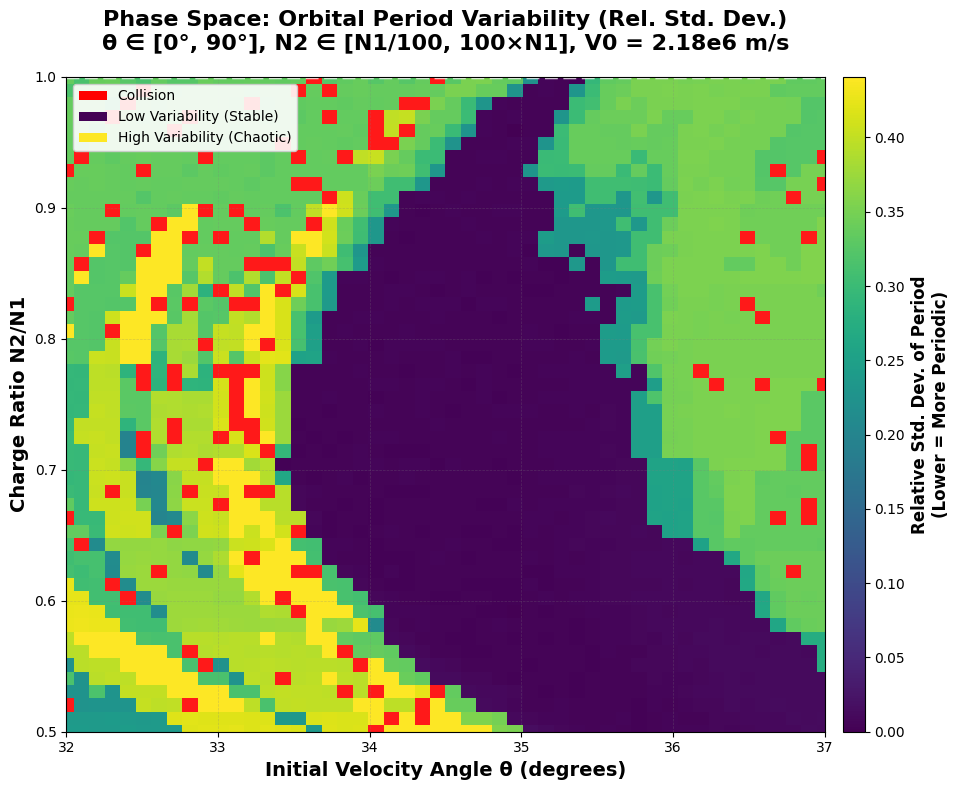


Results saved to 'lowphase_space_heatmap_results.npz'


In [75]:
import numpy as np 

print("\n" + "="*70)
input("Press Enter to start quantitative phase space scan...")

theta_min = 32
theta_max = 37
n_min = 0.5
n_max = 1

results_grid, theta_range, n2_range = scan_phase_space_partial(n_theta=50, n_n2=50, theta_min = theta_min, theta_max = theta_max, n_min = n_min, n_max = n_max)

# Plot results
plot_phase_space_partial(results_grid, theta_range, n2_range, theta_min, theta_max, n_min, n_max)

# Save results
np.savez('partial_phase_space_heatmap_results.npz', 
         results_grid=results_grid,
         theta_range=theta_range,
         n2_range=n2_range,
         n1=n1)
print("\nResults saved to 'lowphase_space_heatmap_results.npz'")

**Figure 47**. Partial phase space graph when $32 \leq \theta \leq 37, 0.5 \leq \frac{N_2}{N_1} \leq 1$. Curve of periodicity seen surrounded by quasi-periodic, unstable orbits.

We pick one stable orbit and one unstable orbit to analyze their differences.

#### Pattern 4: Stable Orbit ($N_2 = 0.7N_1, \theta = 35$) 

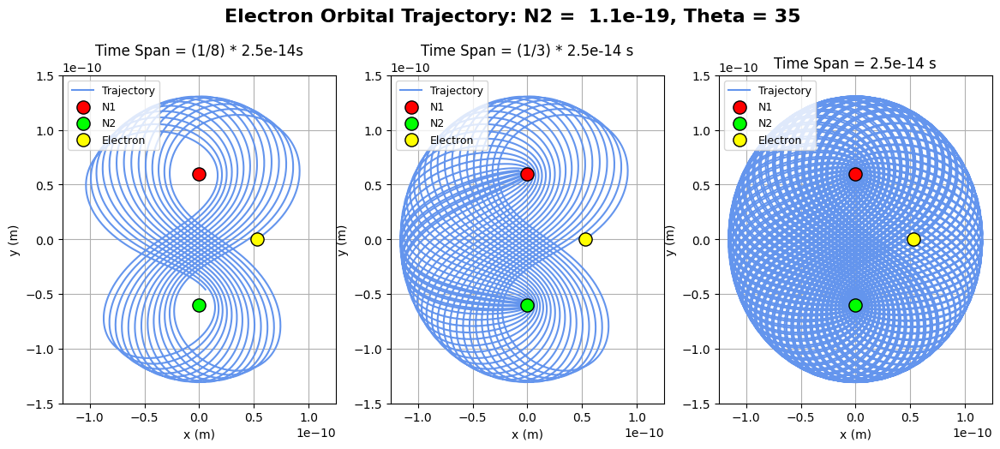

Is this a collision orbit? Yes


In [78]:
# Parameters to vary
n2 = 0.7 * 1.6e-19  # Nucleus 2 charge
angle = 35 # Launch angle in degrees
T = 2.5e-14 # time for simulation to run, s

sol1 = get_trajectory(n2, angle, T)


#Plot trajectory 

fig, ax = plt.subplots(1, 3)
fig.set_size_inches(14, 12)
fig.suptitle(f'Electron Orbital Trajectory: N2 = {n2: 0.2g}, Theta = {angle}', fontsize=16, fontweight='bold')
plt.subplots_adjust(top=1.4) 

ax[2].plot(sol1.y[0], sol1.y[1], label = "Trajectory",c = "cornflowerblue") 
ax[2].set_aspect("equal") 
ax[2].set_title(f"Time Span = {T} s") 
ax[2].set_xlabel("x (m)")
ax[2].set_ylabel(" y (m) ")
ax[2].grid(True) 
ax[2].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
ax[2].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
ax[2].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
ax[2].legend(loc='upper left', fontsize=9) 

# Get the one-third index
idx1 = len(sol1.t) // 3

# Plot only the first one-third of the data
ax[1].plot(sol1.y[0][:idx1], sol1.y[1][:idx1], label="Trajectory", c="cornflowerblue")
ax[1].set_aspect("equal") 
ax[1].set_title(f"Time Span = (1/3) * {T} s") 
ax[1].set_xlabel("x (m)")
ax[1].set_ylabel(" y (m) ")
ax[1].grid(True) 
ax[1].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
ax[1].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
ax[1].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
ax[1].legend(loc='upper left', fontsize=9) 

# Get the one-tenth index
idx2 = len(sol1.t) // 8

# Plot only the first one-third of the data
ax[0].plot(sol1.y[0][:idx2], sol1.y[1][:idx2], label="Trajectory", c="cornflowerblue")
ax[0].set_aspect("equal") 
ax[0].set_title(f"Time Span = (1/8) * {T}s") 
ax[0].set_xlabel("x (m)")
ax[0].set_ylabel(" y (m) ")
ax[0].grid(True) 
ax[0].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
ax[0].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
ax[0].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
ax[0].legend(loc='upper left', fontsize=9) 

# Find global min and max for x and y
#x_min, x_max = 1.2 * sol1.y[0].min(), 1.2 * sol1.y[0].max()
#y_min, y_max = 1.2 * sol1.y[1].min(), 1.2 * sol1.y[1].max()

# Apply limits to all subplots
for a in ax:
    a.set_ylim(-15e-11, 15e-11)
    a.set_xlim(-1.25e-10,1.25e-10)
plt.show()

# Set up initial conditions


theta = math.radians(angle)
vx0 = math.cos(theta) * v0
vy0 = math.sin(theta) * v0
state0 = (r0, 0, vx0, vy0) 


# Run simulation
t_span = (0, T)

# Check Periodicity
is_periodic = check_periodicity(sol)
is_collision = check_collision(sol) 
print(f"Is this a collision orbit? {'Yes' if is_collision else 'No'}") 

**Figure 48**. When $N_2 = 0.7N_1, \theta = 35$, the electron follows a figure-eight pattern, with its drift forming an ellipsoid-like shape. 

We now compare this to an unstable orbit.

#### Pattern 4: Unstable Orbit ($N_2 = 0.6N_1, \theta = 32$) 

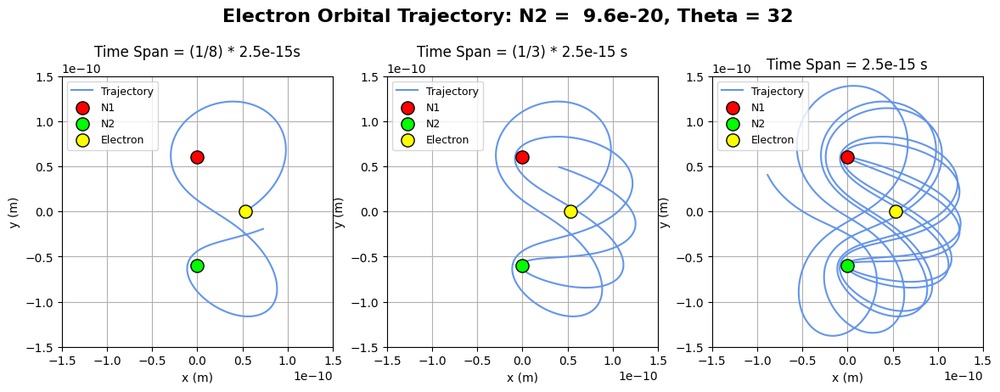

Is this a collision orbit? Yes


In [25]:
# Parameters to vary
n2 = 0.6 * 1.6e-19  # Nucleus 2 charge
angle = 32 # Launch angle in degrees
T = 2.5e-15 # time for simulation to run, s

sol1 = get_trajectory(n2, angle, T)


#Plot trajectory 

fig, ax = plt.subplots(1, 3)
fig.set_size_inches(14, 12)
fig.suptitle(f'Electron Orbital Trajectory: N2 = {n2: 0.2g}, Theta = {angle}', fontsize=16, fontweight='bold')
plt.subplots_adjust(top=1.45) 

ax[2].plot(sol1.y[0], sol1.y[1], label = "Trajectory",c = "cornflowerblue") 
ax[2].set_aspect("equal") 
ax[2].set_title(f"Time Span = {T} s") 
ax[2].set_xlabel("x (m)")
ax[2].set_ylabel(" y (m) ")
ax[2].grid(True) 
ax[2].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
ax[2].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
ax[2].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
ax[2].legend(loc='upper left', fontsize=9) 

# Get the one-third index
idx1 = len(sol1.t) // 3

# Plot only the first one-third of the data
ax[1].plot(sol1.y[0][:idx1], sol1.y[1][:idx1], label="Trajectory", c="cornflowerblue")
ax[1].set_aspect("equal") 
ax[1].set_title(f"Time Span = (1/3) * {T} s") 
ax[1].set_xlabel("x (m)")
ax[1].set_ylabel(" y (m) ")
ax[1].grid(True) 
ax[1].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
ax[1].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
ax[1].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
ax[1].legend(loc='upper left', fontsize=9) 

# Get the one-tenth index
idx2 = len(sol1.t) // 8

# Plot only the first one-third of the data
ax[0].plot(sol1.y[0][:idx2], sol1.y[1][:idx2], label="Trajectory", c="cornflowerblue")
ax[0].set_aspect("equal") 
ax[0].set_title(f"Time Span = (1/8) * {T}s") 
ax[0].set_xlabel("x (m)")
ax[0].set_ylabel(" y (m) ")
ax[0].grid(True) 
ax[0].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
ax[0].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
ax[0].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
ax[0].legend(loc='upper left', fontsize=9) 

# Find global min and max for x and y
#x_min, x_max = 1.2 * sol1.y[0].min(), 1.2 * sol1.y[0].max()
#y_min, y_max = 1.2 * sol1.y[1].min(), 1.2 * sol1.y[1].max()

# Apply limits to all subplots
for a in ax:
    a.set_ylim(-15e-11, 15e-11)
    a.set_xlim(-1.5e-10,1.5e-10)
plt.show()

# Set up initial conditions


theta = math.radians(angle)
vx0 = math.cos(theta) * v0
vy0 = math.sin(theta) * v0
state0 = (r0, 0, vx0, vy0) 


# Run simulation
t_span = (0, T)

# Check Periodicity
is_periodic = check_periodicity(sol)
is_collision = check_collision(sol) 
print(f"Is this a collision orbit? {'Yes' if is_collision else 'No'}") 

**Figure 49**. When $N_2 = 0.6N_1, \theta = 32$, the electron follows a completely different pattern, but still ultimately traces an ellipsoid-like shape. Time span is reduced to see orbital path more clearly.

Comparing this to **Figure 48**, we see that although the electron's path ultimately still creates an ellipsoid-like shape, its orbital path is drastically different. On one hand, in the stable orbit, the electron follows a figure-eight-like pattern, with slight drift, creating an ellipsoid; crucially, because of the drift, we see that the orbital shapes are roughly the same, contributing to a low relative standard deviation. On the other hand, in the unstable orbit, the electron seems to circle $N_1$ and $N_2$ in a on on the right side, with its orbital shape growing rapidly to produce an ellipsoid. As such, it is reasonable for the orbital period relative standard deviation to be much larger.

Hence, we attribute this pattern to the rate of drift change the electron undergoes.

In Part III, we looked at some unique patterns stemming from our continuous phase space analysis. In the final part of our analysis, we analyze possible numerical artifacts in our heat map and connect this to limitations in our quantification of stability.

## Part IV: Analyzing Numerical Artifacts and Quantification of Stability 

![Artifact](https://i.imgur.com/se9U14v.png)

**Figure 50**. Zoomed-in image of possible numerical artifact.

In our final section, we analyze some of the numerical artifacts that are seen in our continuous phase space scan. We specifically look at the above region, where we see unexpected shifts in color that do not align with the curves seen in the broader graph. We first conduct a partial phase space scan of the region.


PARTIAL 2D QUANTITATIVE PHASE SPACE SCAN: Period Variability
Theta axis: 50 points from 0° to 90°
N2 axis: 50 points from N1/100 to 100*N1
  N2/N1 range: 0.050 to 0.1
Total simulations: 2500


N2/N1 = 0.050 (1/50)
  Progress: 45/2500 (1.8%) | Rate: 18.2 sim/s | ETA: 135s
N2/N1 = 0.051 (2/50)
  Progress: 90/2500 (3.6%) | Rate: 18.1 sim/s | ETA: 133s
N2/N1 = 0.052 (3/50)
  Progress: 150/2500 (6.0%) | Rate: 18.0 sim/s | ETA: 130s
N2/N1 = 0.053 (4/50)
  Progress: 195/2500 (7.8%) | Rate: 17.9 sim/s | ETA: 128s
N2/N1 = 0.054 (5/50)
  Progress: 240/2500 (9.6%) | Rate: 17.9 sim/s | ETA: 126s
N2/N1 = 0.055 (6/50)
  Progress: 300/2500 (12.0%) | Rate: 17.6 sim/s | ETA: 125s
N2/N1 = 0.056 (7/50)
  Progress: 345/2500 (13.8%) | Rate: 16.8 sim/s | ETA: 129s
N2/N1 = 0.057 (8/50)
  Progress: 390/2500 (15.6%) | Rate: 16.7 sim/s | ETA: 127s
N2/N1 = 0.058 (9/50)
  Progress: 450/2500 (18.0%) | Rate: 16.3 sim/s | ETA: 125s
N2/N1 = 0.059 (10/50)
  Progress: 495/2500 (19.8%) | Rate: 16.1 sim/s | ETA: 124s
N2

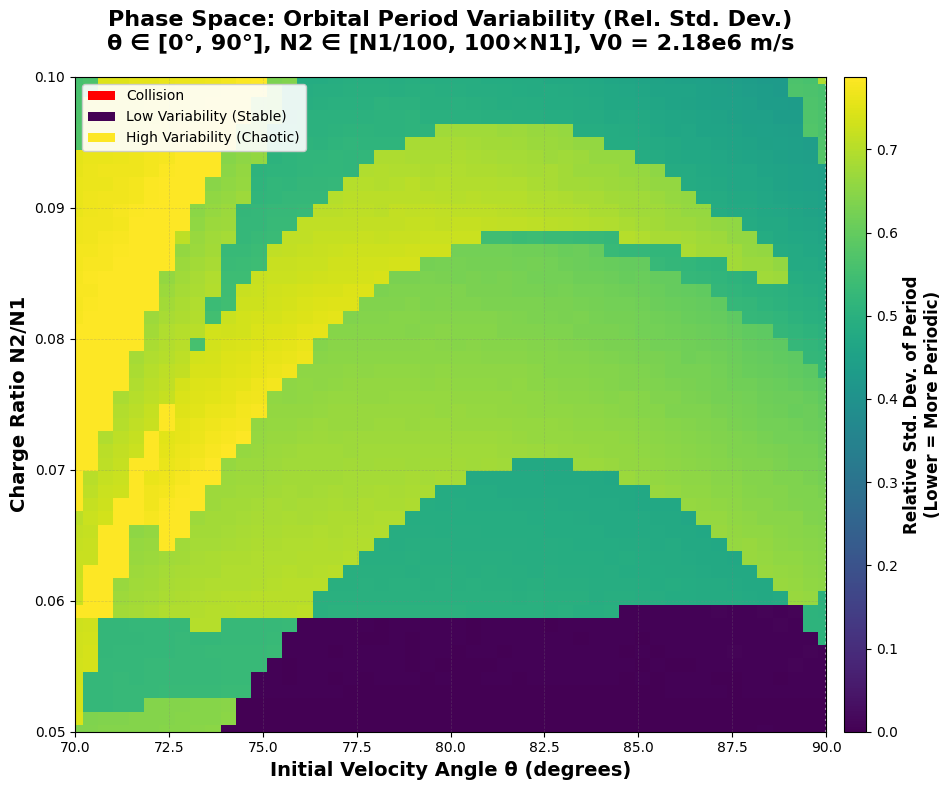


Results saved to 'lowphase_space_heatmap_results.npz'


In [91]:
import numpy as np 

print("\n" + "="*70)
input("Press Enter to start quantitative phase space scan...")

theta_min = 70
theta_max = 90
n_min = 0.05
n_max = 0.1

results_grid, theta_range, n2_range = scan_phase_space_partial(n_theta=50, n_n2=50, theta_min = theta_min, theta_max = theta_max, n_min = n_min, n_max = n_max)

# Plot results
plot_phase_space_partial(results_grid, theta_range, n2_range, theta_min, theta_max, n_min, n_max)

# Save results
np.savez('partial_phase_space_heatmap_results.npz', 
         results_grid=results_grid,
         theta_range=theta_range,
         n2_range=n2_range,
         n1=n1)
print("\nResults saved to 'lowphase_space_heatmap_results.npz'")

**Figure 51**. Partial phase space simulation with the domain $70 \leq \theta \leq 90$, $0.05 \leq \frac{N_2}{N_1} \leq 0.1$. Possible numerical artifacts or shown.

![Artifact2](https://i.imgur.com/Rup8aL7.png)

**Figure 52**. More zoomed-in image of numerical artifact.

From above, we see a partial phase space with possible numerical artifacts, characterized by sudden changes of colour. For instance, there is an abrupt change in colour from purple to green at the bottom of the graph. These results are different than the ones analyzed in Part III, since they do not follow any predictable curve or pattern. We look more into the subregion above, picking one parameter combination in the green portion and one in the purple. 

### Green Portion: $N_2 = 0.065N_1, \theta = 82.5$ 

We first find a parameter combination in the green portion of the subregion. We pick  $N_2 = 0.065N_1, \theta = 82.5$.

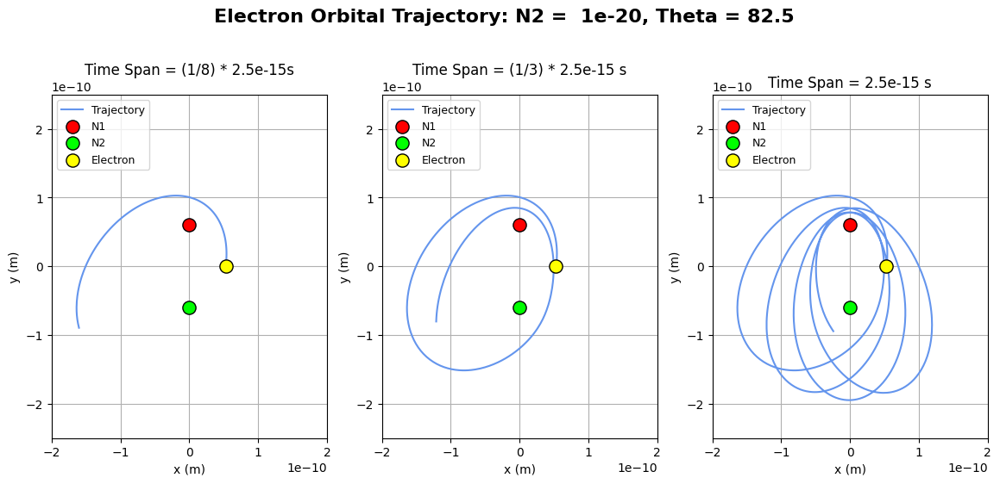

Is this a collision orbit? No


In [21]:
# Parameters to vary
n2 = 0.065 * 1.6e-19  # Nucleus 2 charge
angle = 82.5 # Launch angle in degrees
T = 2.5e-15 # time for simulation to run, s

sol1 = get_trajectory(n2, angle, T)


#Plot trajectory 

fig, ax = plt.subplots(1, 3)
fig.set_size_inches(14, 12)
fig.suptitle(f'Electron Orbital Trajectory: N2 = {n2: 0.2g}, Theta = {angle}', fontsize=16, fontweight='bold')
plt.subplots_adjust(top=1.35) 

ax[2].plot(sol1.y[0], sol1.y[1], label = "Trajectory",c = "cornflowerblue") 
ax[2].set_aspect("equal") 
ax[2].set_title(f"Time Span = {T} s") 
ax[2].set_xlabel("x (m)")
ax[2].set_ylabel(" y (m) ")
ax[2].grid(True) 
ax[2].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
ax[2].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
ax[2].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
ax[2].legend(loc='upper left', fontsize=9) 

# Get the one-third index
idx1 = len(sol1.t) // 3

# Plot only the first one-third of the data
ax[1].plot(sol1.y[0][:idx1], sol1.y[1][:idx1], label="Trajectory", c="cornflowerblue")
ax[1].set_aspect("equal") 
ax[1].set_title(f"Time Span = (1/3) * {T} s") 
ax[1].set_xlabel("x (m)")
ax[1].set_ylabel(" y (m) ")
ax[1].grid(True) 
ax[1].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
ax[1].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
ax[1].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
ax[1].legend(loc='upper left', fontsize=9) 

# Get the one-tenth index
idx2 = len(sol1.t) // 8

# Plot only the first one-third of the data
ax[0].plot(sol1.y[0][:idx2], sol1.y[1][:idx2], label="Trajectory", c="cornflowerblue")
ax[0].set_aspect("equal") 
ax[0].set_title(f"Time Span = (1/8) * {T}s") 
ax[0].set_xlabel("x (m)")
ax[0].set_ylabel(" y (m) ")
ax[0].grid(True) 
ax[0].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
ax[0].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
ax[0].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
ax[0].legend(loc='upper left', fontsize=9) 

# Find global min and max for x and y
#x_min, x_max = 1.2 * sol1.y[0].min(), 1.2 * sol1.y[0].max()
#y_min, y_max = 1.2 * sol1.y[1].min(), 1.2 * sol1.y[1].max()

# Apply limits to all subplots
for a in ax:
    a.set_ylim(-25e-11, 25e-11)
    a.set_xlim(-2e-10,2e-10)
plt.show()

# Set up initial conditions


theta = math.radians(angle)
vx0 = math.cos(theta) * v0
vy0 = math.sin(theta) * v0
state0 = (r0, 0, vx0, vy0) 


# Run simulation
t_span = (0, T)

# Check Periodicity
is_periodic = check_periodicity(sol)
is_collision = check_collision(sol) 
print(f"Is this a collision orbit? {'Yes' if is_collision else 'No'}") 

**Figure 53**. When $N_2 = 0.065 N_1, \theta = 82.5$ the electron follows elliptical paths orbiting around both $N_1$ and $N_2$, with drift shfting the ellptical orbits counterclockwise.

We also include a histogram of the orbital periods.


ORBITAL PERIOD STATISTICS
Number of complete orbits: 4
Mean period: 4.61e-16 s
Standard deviation: 2.25e-16 s
Relative std dev: 48.81%
Minimum period: 7.14e-17 s
Maximum period: 5.95e-16 s
Range: 5.24e-16 s 

Is the orbit periodic? No


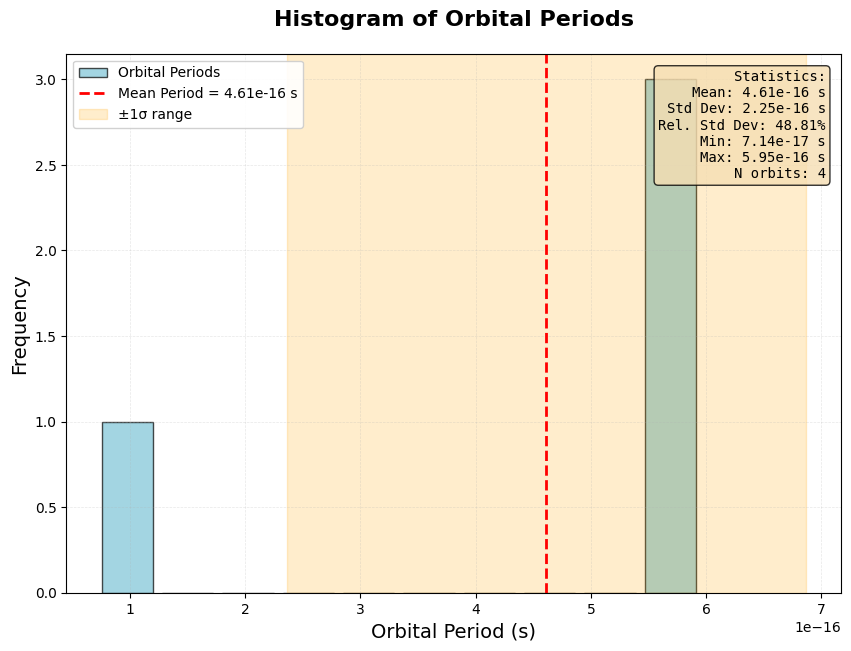

In [118]:
theta = math.radians(angle)
vx0 = math.cos(theta) * v0
vy0 = math.sin(theta) * v0
state0 = (r0, 0, vx0, vy0) 

T = 2.5e-15  # time for simulation to run, s


# Run simulation
t_span = (0, T)
sol = solve_ivp(diff_eqns, t_span, state0, 
rtol=1e-9, atol=1e-9, 
max_step=1e-17) 

# Check Periodicity
is_periodic = check_periodicity(sol)

# Generate Graph of Periods  
# Calculate distance from starting position
x0, y0 = sol.y[0][0], sol.y[1][0]
distances = np.sqrt((sol.y[0] - x0)**2 + (sol.y[1] - y0)**2)

# Find local minima (returns to starting region)
peaks, _ = find_peaks(-distances, distance=len(distances)//20)

# Calculate periods
periods = np.diff(sol.t[peaks])

# Calculate relative standard deviation
period_mean = np.mean(periods)
period_std = np.std(periods)
period_std_rel = period_std / period_mean 

n = []
for i in range(len(periods)):
    n.append(i+1)



# Make histogram of periods
figsize = (10, 7)
plt.figure(figsize=figsize)

# Create histogram
counts, bins, patches = plt.hist(periods, bins=10, color="#7cc4d6", 
                                  rwidth=0.85, label='Orbital Periods', 
                                  edgecolor='black', alpha=0.7)
# Graph vertical line at mean period
plt.axvline(x=period_mean, color='red', linestyle='--', linewidth=2, 
            label=f'Mean Period = {period_mean:.2e} s') 



stats_text = f'Statistics:\n' \
             f'Mean: {period_mean:.2e} s\n' \
             f'Std Dev: {period_std:.2e} s\n' \
             f'Rel. Std Dev: {period_std_rel:.2%}\n' \
             f'Min: {np.min(periods):.2e} s\n' \
             f'Max: {np.max(periods):.2e} s\n' \
             f'N orbits: {len(periods)}'

props = dict(boxstyle='round', facecolor='wheat', alpha=0.8)
plt.text(0.98, 0.97, stats_text, transform=plt.gca().transAxes, 
         fontsize=10, verticalalignment='top', horizontalalignment='right',
         bbox=props, family='monospace')

# Grid for easier reading
plt.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)

plt.axvspan(period_mean - period_std, period_mean + period_std, 
            alpha=0.2, color='orange', label='±1σ range')

# Legend
plt.legend(loc='upper left', fontsize=10, framealpha=0.9)

plt.title('Histogram of Orbital Periods', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Orbital Period (s)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

print("\n" + "="*50)
print("ORBITAL PERIOD STATISTICS")
print("="*50)
print(f"Number of complete orbits: {len(periods)}")
print(f"Mean period: {period_mean:.2e} s")
print(f"Standard deviation: {period_std:.2e} s")
print(f"Relative std dev: {period_std_rel:.2%}")
print(f"Minimum period: {np.min(periods):.2e} s")
print(f"Maximum period: {np.max(periods):.2e} s")
print(f"Range: {np.max(periods) - np.min(periods):.2e} s \n")
print(f"Is the orbit periodic? {'Yes' if is_periodic else 'No'}")

**Figure 54**.  Histogram of orbital periods when $N_2 = 0.065 N_1, \theta = 82.5$. All orbital periods lie in two bins, with the relative standard deviation being 48.81%.

We do the exact same thing with a combination of parameters in the purple region.

### Purple Portion: $N_2 = 0.05N_1, \theta = 82.5$ 

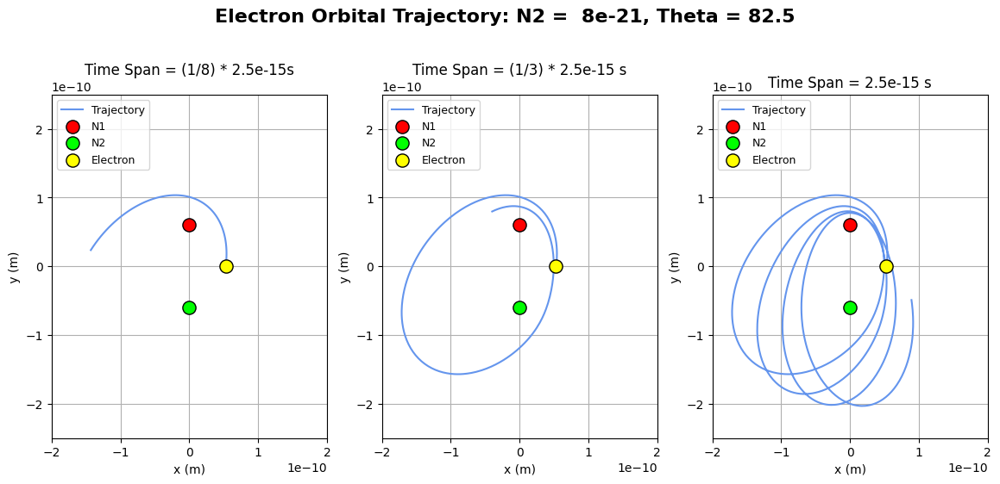

Is this a collision orbit? No


In [22]:
# Parameters to vary
n2 = 0.05 * 1.6e-19  # Nucleus 2 charge
angle = 82.5 # Launch angle in degrees
T = 2.5e-15 # time for simulation to run, s

sol1 = get_trajectory(n2, angle, T)


#Plot trajectory 

fig, ax = plt.subplots(1, 3)
fig.set_size_inches(14, 12)
fig.suptitle(f'Electron Orbital Trajectory: N2 = {n2: 0.2g}, Theta = {angle}', fontsize=16, fontweight='bold')
plt.subplots_adjust(top=1.35) 

ax[2].plot(sol1.y[0], sol1.y[1], label = "Trajectory",c = "cornflowerblue") 
ax[2].set_aspect("equal") 
ax[2].set_title(f"Time Span = {T} s") 
ax[2].set_xlabel("x (m)")
ax[2].set_ylabel(" y (m) ")
ax[2].grid(True) 
ax[2].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
ax[2].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
ax[2].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
ax[2].legend(loc='upper left', fontsize=9) 

# Get the one-third index
idx1 = len(sol1.t) // 3

# Plot only the first one-third of the data
ax[1].plot(sol1.y[0][:idx1], sol1.y[1][:idx1], label="Trajectory", c="cornflowerblue")
ax[1].set_aspect("equal") 
ax[1].set_title(f"Time Span = (1/3) * {T} s") 
ax[1].set_xlabel("x (m)")
ax[1].set_ylabel(" y (m) ")
ax[1].grid(True) 
ax[1].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
ax[1].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
ax[1].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
ax[1].legend(loc='upper left', fontsize=9) 

# Get the one-tenth index
idx2 = len(sol1.t) // 8

# Plot only the first one-third of the data
ax[0].plot(sol1.y[0][:idx2], sol1.y[1][:idx2], label="Trajectory", c="cornflowerblue")
ax[0].set_aspect("equal") 
ax[0].set_title(f"Time Span = (1/8) * {T}s") 
ax[0].set_xlabel("x (m)")
ax[0].set_ylabel(" y (m) ")
ax[0].grid(True) 
ax[0].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
ax[0].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
ax[0].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
ax[0].legend(loc='upper left', fontsize=9) 

# Find global min and max for x and y
#x_min, x_max = 1.2 * sol1.y[0].min(), 1.2 * sol1.y[0].max()
#y_min, y_max = 1.2 * sol1.y[1].min(), 1.2 * sol1.y[1].max()

# Apply limits to all subplots
for a in ax:
    a.set_ylim(-25e-11, 25e-11)
    a.set_xlim(-2e-10,2e-10)
plt.show()

# Set up initial conditions


theta = math.radians(angle)
vx0 = math.cos(theta) * v0
vy0 = math.sin(theta) * v0
state0 = (r0, 0, vx0, vy0) 


# Run simulation
t_span = (0, T)

# Check Periodicity
is_periodic = check_periodicity(sol)
is_collision = check_collision(sol) 
print(f"Is this a collision orbit? {'Yes' if is_collision else 'No'}") 

**Figure 55**. A similar trajectory can be seen in the purple region when  $N_2 = 0.05N_1, \theta = 82.5$ .


ORBITAL PERIOD STATISTICS
Number of complete orbits: 2
Mean period: 6.34e-16 s
Standard deviation: 1.12e-20 s
Relative std dev: 0.00%
Minimum period: 6.34e-16 s
Maximum period: 6.34e-16 s
Range: 2.24e-20 s 

Is the orbit periodic? Yes


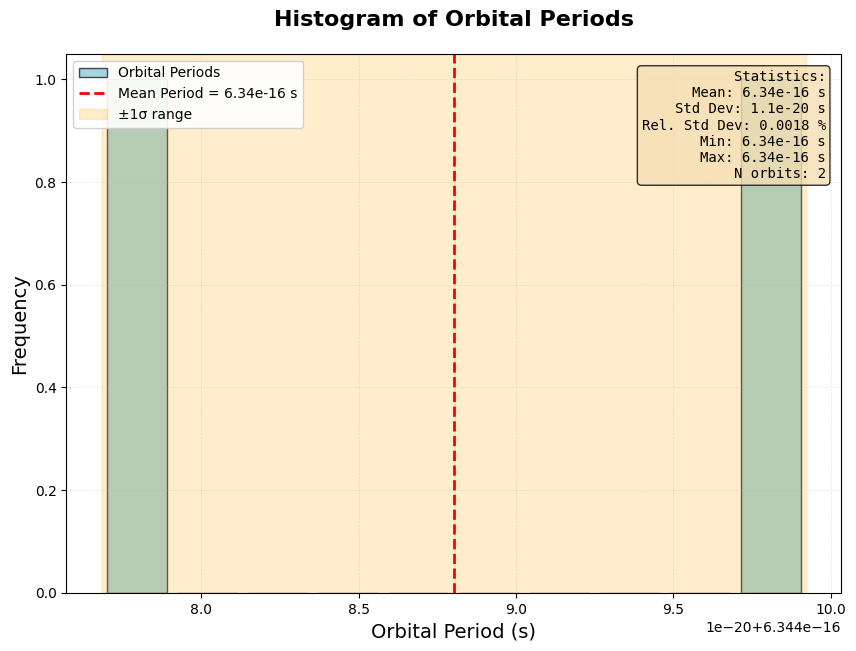

In [130]:
theta = math.radians(angle)
vx0 = math.cos(theta) * v0
vy0 = math.sin(theta) * v0
state0 = (r0, 0, vx0, vy0) 

T = 2.5e-15  # time for simulation to run, s


# Run simulation
t_span = (0, T)
sol = solve_ivp(diff_eqns, t_span, state0, 
rtol=1e-9, atol=1e-9, 
max_step=1e-17) 

# Check Periodicity
is_periodic = check_periodicity(sol)

# Generate Graph of Periods  
# Calculate distance from starting position
x0, y0 = sol.y[0][0], sol.y[1][0]
distances = np.sqrt((sol.y[0] - x0)**2 + (sol.y[1] - y0)**2)

# Find local minima (returns to starting region)
peaks, _ = find_peaks(-distances, distance=len(distances)//20)

# Calculate periods
periods = np.diff(sol.t[peaks])

# Calculate relative standard deviation
period_mean = np.mean(periods)
period_std = np.std(periods)
period_std_rel = period_std / period_mean 

n = []
for i in range(len(periods)):
    n.append(i+1)



# Make histogram of periods
figsize = (10, 7)
plt.figure(figsize=figsize)

# Create histogram
counts, bins, patches = plt.hist(periods, bins=10, color="#7cc4d6", 
                                  rwidth=0.85, label='Orbital Periods', 
                                  edgecolor='black', alpha=0.7)
# Graph vertical line at mean period
plt.axvline(x=period_mean, color='red', linestyle='--', linewidth=2, 
            label=f'Mean Period = {period_mean:.2e} s') 



stats_text = f'Statistics:\n' \
             f'Mean: {period_mean:.2e} s\n' \
             f'Std Dev: {period_std:.2g} s\n' \
             f'Rel. Std Dev: {period_std_rel * 100:.2g} %\n' \
             f'Min: {np.min(periods):.2e} s\n' \
             f'Max: {np.max(periods):.2e} s\n' \
             f'N orbits: {len(periods)}'

props = dict(boxstyle='round', facecolor='wheat', alpha=0.8)
plt.text(0.98, 0.97, stats_text, transform=plt.gca().transAxes, 
         fontsize=10, verticalalignment='top', horizontalalignment='right',
         bbox=props, family='monospace')

# Grid for easier reading
plt.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)

plt.axvspan(period_mean - period_std, period_mean + period_std, 
            alpha=0.2, color='orange', label='±1σ range')

# Legend
plt.legend(loc='upper left', fontsize=10, framealpha=0.9)

plt.title('Histogram of Orbital Periods', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Orbital Period (s)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

print("\n" + "="*50)
print("ORBITAL PERIOD STATISTICS")
print("="*50)
print(f"Number of complete orbits: {len(periods)}")
print(f"Mean period: {period_mean:.2e} s")
print(f"Standard deviation: {period_std:.2e} s")
print(f"Relative std dev: {period_std_rel:.2%}")
print(f"Minimum period: {np.min(periods):.2e} s")
print(f"Maximum period: {np.max(periods):.2e} s")
print(f"Range: {np.max(periods) - np.min(periods):.2e} s \n")
print(f"Is the orbit periodic? {'Yes' if is_periodic else 'No'}")

**Figure 56**.  Histogram of orbital periods when  $N_2 = 0.05N_1, \theta = 82.5$. All orbital periods lie in two bins, with the relative standard deviation being 0.0018%.

Comparing the green and purple regions, we see that the green region has a standard deviation of nearly 50%, while the purple region has essentially no standard deviation. In **Figure 45**, we see that the reason the standard deviation is so high is due to one occurrence of an orbital period being close to 1e-16 seconds. This is more than five times less than the other periods. Why might this be? Looking at the orbital paths in the green region (**Figure 44**), a possible explanation for this is the last orbit the electron makes around $N_1$ and $N_2$ in the time span. In the last orbit, the electron first travels near $N_1$, yielding a local minimum; it then travels past $N_1$, turns around, and travels downwards towards $N_2$. Because of the unique eccentricity of the electron's elliptical path, another local minimum is measured as the electron switches direction and  approaches $N_2$. As a result, a very brief period is detected by the function that quantifies stability, even though it should not. This is most likely why the standard deviation is so large in the green region. Since the green region is due to a detection of an inaccurate period, we can classify this occurrence in our phase space as a numerical artifact.   


More generally, this analysis shows that there are limitations in this project's quantification of stability. Specifically, there are occurrences where orbital periods are detected that do not exist, and vice versa. This will affect the accuracy of the standard deviation calculated by the simulation, which in turn affects the accuracy of the continuous phase space simulation.

# Results and Discussion

## Part I General Analysis 
From Part I, electrons create four kinds of trajectories: **ellipsoids, partial/half ellipsoids, rings, and flat elliptical rings**. These shapes are traced by various **periodic and aperiodic electron paths**, ranging from **infinity rings** to **ellipses** to other forms of **loops**
* From **Cycle 1, $N_2 = N_1$**: The electrons trace a 3-dimensional ellipsoid, with path densities changing due to differences in $\theta$. The trajectory of the electron is roughly symmetric, which is expected since we have set $N_1 = N_2$.
* From **Cycle 2 $N_2 = 5 N_1$**: The electrons trace a partial ellipsoid due to the larger $N_2$ force, with the curving of the partial ellipsoid increasing as $\theta$ approaches 90 degrees. This is due to the vertical initial velocity component; as $\theta$ nears 90, the y-velocity increases, allowing the electron to travel further towards $N_1$ before its direction reverses towards $N_2$. In Cycle 2, the force of $N_1$ is still relatively large enough to influence the path of the electron, as seen by the elliptical shape of the trajectory; if there were no $N_1$ influence, the electron should trace a flat elliptical pattern, as seen in Cycle 4.
* From **Cycle 3 $N_2 = \frac{1}{5}N_1$**: The electrons range between tracing ring-like shapes and partial ellipsoids, depending on $\theta$. As $\theta$ approaches 90 degrees, the electrons have enough vertical velocity to trace a ring-like shape; this occurs due to the low $N_2$ force, allowing the electrons to pass" $N_1$ and $N_2$ before reversing direction towards the other proton. As $\theta$ moves away from 90, the decrease in vertical component velocity gradually increases the thickness of the traced ring until the ring diverges into a partial ellipsoid, as seen in Cycle 2. 
* From **Cycle 4: $N_2 = 50N_1$**: The electron traces a flat elliptical path with drift, creating a rubber-band-like trajectory. This trajectory is different from that of Cycle 2, since the force of $N_2$ is magnitudes larger than $N_1$; now that $N_1$ has a negligible effect on the electron, there is no longer a partial ellipsoid. The electron still experiences drift due to the chosen initial velocity and variable angle; its orbit is non-Keplerian, meaning that its path will never be a two-dimensional ellipse.

Overall, Part I demonstrates that electrons exhibit a wide range of shapes and trajectories in response to varying nucleic charge and angle. This is due to the interactions between $N_2$ and $N_1$ Coulomb force, as well as the initial y and x velocity components from $\theta$.  

## Part II General Analysis  

### Discrete Phase-Space Diagram

![Typical](https://i.imgur.com/wNkSzAw.png) 
![Band](https://i.imgur.com/ZfbTYxP.png) 
![Chaotic](https://i.imgur.com/dewEIyl.png)

**Figure 57**. Screenshots of three stability regions. From top to bottom, left to right: Low $\frac{N_2}{N_1}$ ratio, curving band, and chaotic region.

From Part II, there are three key regions where stable orbits are achieved:  
1. **Low $\frac{N_2}{N_1}$ ratio**: This is the region with the most prevalent stable orbits. When the charge ratio is between 0.01 and ~0.08, nearly all orbits are stable, with some exceptions when the initial velocity angle is between 60 and 70 degrees. Past this charge ratio, most orbits become either unstable due to lack of periodicity or collide into 1 of two protons, with the latter chance increasing as the charge ratio increases. Upon analyzing a stable orbit in this region, we see that the electrons follow an elliptical path with circular drift, creating a partial ellipsoid described in Cycle 2 of the Part I analysis. 
2. **Curving Band**: Above the low $\frac{N_2}{N_1}$ ratio region, we see a curving band of stable orbits. Upon analyzing a stable orbit in this region, we see that the electrons follow a figure-eight path, with its trajectory growing each cycle. The electron's path traces a full ellipsoid similar to the ones described in Cycle 1 of the Part I analysis.
3. **Chaotic Region**: In the top right portion of the phase space diagram, there is a chaotic region of stable, unstable, and collision orbits. Upon analyzing a stable orbit in this region, we see that the electron traces a very similar orbit to Trial 2 of Cycle 1, where the electron follows a looping pattern up towards $N_1$ then down towards $N_2$, also tracing out an ellipsoid, but of a higher eccentricity. Interestingly, when we change $N_2$ by $0.005e-19C$, the orbit changes from stable to a collision with the nucleus. This shows how fragile the system in the chaotic region can be; just by varying $N_2$ by $0.03 \%$, the orbit transitions from a stable one to a collision wth the nucleus. 

## Part III and IV General Analyses

### Continuous Phase-Space Heat Map
From the continuous phase-space heat map, we see all the patterns that the discrete phase-space diagram presents with further detail. Three additional key observations are made. Firstly, there is a neon band of quasi-periodic orbits immediately above the lower third region, with a very stark contrast in relative standard deviations between the two regions. Secondly, the collision patterns towards the top of the graphs show three swooping curves, along with repeating horizontal patterns. Finally, curves of quasi-periodicity can be seen in the middle of the graph, where streaks of turquoise and purple connect to the lower portion of the graph and transition to less stable orbits (yellow) as the charge ratio decreases. A more detailed analysis of the patterns yields the following conclusions: 


(1) **Periodic and Claw-Mark Collision**: The periodic and claw-mark collisions seen at the top of the continuous phase space diagrams are due to slight variations in the amplitude of electron distances from $N_2$. 

(2) **Neon bands in lower third region**: The abrupt neon bands above the lower region of stable orbits are most likely due to a combination of electron drift and its change in eccentricity in orbits. This in turn creates variations in the electron's orbital periods, contributing to a higher relative standard deviation.

(3) **Curves of periodicity**: The curves of periodicity in the center of the graph can be attributed to a low drift change of the electron's orbit, characterized by stable figure-eight-like orbits

(4) **Numerical artifacts**: Numerical artifacts in the lower right portion of the phase space graph can be seen, where certain parameter combinations miscount the number of periods due to the quantification of stability through local minimum distances. This affects the accuracy of the simulation and may lead to unrepresentative results coming from our data.




## Limitations & Next Steps 

### Technical Limitations  
* **Machine Precision**: Since we used Solve_IVP in this project, we will have limitations in machine precision– we are approximating the velocity and position by *discretizing* our calculations, reducing the accuracy of our simulation. While Solve_IVP is most likely more precise than simply using Euler's method, the function will still have uncertainty.
* **CPU Memory & Simplistic Model**: Since we are running this project on a limited CPU memory, we cannot run each simulation for a very long period to more accurately determine stability. For context, the phase-space simulation in this project took nearly two hours to run on VS code! This limits the extent and complexity that we can make our simulations.
* **Approximating Periodicity**: In this project, we approximated periodicity by taking the local minima of the distance between the electron and its original position. However, it is possible that this is not representative of the actual period; the electron may return to its original position, but that point does not mark a period, such as if it does multiple loops around a nucleus before completing a cycle. This is a technical limitation of our simulation, since its approximation of periodicity may not be accurate.  
* **Periodicity Limitations in Precessions**: Furthermore, by the quantification of stability, electrons with high precession, or qualitatively, "orbital drift", will be categorized by unstable; this is because the relative standard deviation of the electron orbital periods will most likely change. This is a limitation in our quantification of stability, since electrons with drift that are still periodic should still be a stable orbit.
* **Other Stability Quantification Limitations**: As discussed in Part IV of the analysis, the presence of numerical artifacts is due to limitations in the way this project defined stability. This means that some of the results seen in our phase spaces may not be truly representative of teh electron orbital trajectories.

### Next Steps 
* **Improving Phase Space Resolution**: In our Part II analysis, we see that our phase space resolution is very low, even after running our phase space over 900 parameter combinations. Running the phase space over more combinations woudl increase the resolution of the graph, allowing us to observe more relevant patterns in the graph.
* **Better definition of stability**: A more reliable quantifcation of stability could be developed so that there are very few (if not none) numerical artifacts in the simulated results.
* **Understanding mechanisms to orbital stability**: Further effort could go into understanding why certain combinations of charge ratio and initial velocity angle produce stable orbits, while others do not.

# Acknowledgements

* I acknowledge the use of Claude AI for helping me develop the functions to extend my simulation code to scan for and plot my 2-D phase space.
* I acknowledge Sumaiya Hussain and Sam Quastel for providing me with preliminary feedback on choosing a phase space for my project.

# References

[1] https://en.wikipedia.org/wiki/Coulomb%27s_law 

[2] https://docs.scipy.org/doc/scipy/reference/generated/scipy.integrate.solve_ivp.html

# Appendix 1: Code validation

### A1.1: Check for Initial Velocity Angle, $\theta = 0$

Our first validation task is extremely brief, where we check that the initial velocity angle is implemented correctly. We specifically test $\theta = 0$ with $N_1 = N_2$, in which the electron's initial velocity will be to the right. Due to this, the forces of $N_2$ and $N_1$ on the electron will be purely horizontal, meaning that we expect the electron's trajectory to oscillate left and right. 

In [ ]:

def plot_trajectory(sol1, top, T, c):
    # Plot y vs x for theta = 5
    fig, ax = plt.subplots(1, 3)
    fig.set_size_inches(14, 9)
    fig.suptitle(f'Electron Orbital Trajectory: N2 = {n2: 0.2g}, Theta = {angle}', fontsize=16, fontweight='bold')
    plt.subplots_adjust(top=top) 

    ax[2].plot(sol1.y[0], sol1.y[1], label = "Trajectory",c = "cornflowerblue") 
    ax[2].set_aspect("equal") 
    ax[2].set_title(f"Time Span = {T} s") 
    ax[2].set_xlabel("x (m)")
    ax[2].set_ylabel(" y (m) ")
    ax[2].grid(True) 
    ax[2].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
    ax[2].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
    ax[2].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
    ax[2].legend(loc='upper left', fontsize=9) 

    # Get the one-third index
    idx1 = len(sol1.t) // 3

    # Plot only the first one-third of the data
    ax[1].plot(sol1.y[0][:idx1], sol1.y[1][:idx1], label="Trajectory", c="cornflowerblue")
    ax[1].set_aspect("equal") 
    ax[1].set_title(f"Time Span = (1/3) * {T} s") 
    ax[1].set_xlabel("x (m)")
    ax[1].set_ylabel(" y (m) ")
    ax[1].grid(True) 
    ax[1].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
    ax[1].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
    ax[1].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
    ax[1].legend(loc='upper left', fontsize=9) 

    # Get the one-tenth index
    idx2 = len(sol1.t) // 8

    # Plot only the first one-third of the data
    ax[0].plot(sol1.y[0][:idx2], sol1.y[1][:idx2], label="Trajectory", c="cornflowerblue")
    ax[0].set_aspect("equal") 
    ax[0].set_title(f"Time Span = (1/8) * {T}s") 
    ax[0].set_xlabel("x (m)")
    ax[0].set_ylabel(" y (m) ")
    ax[0].grid(True) 
    ax[0].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
    ax[0].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
    ax[0].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
    ax[0].legend(loc='upper left', fontsize=9) 

    # Find global min and max for x and y
    x_min, x_max = 1.2 * sol1.y[0].min(), 1.2 * sol1.y[0].max()
    y_min, y_max = 1.2 * sol1.y[1].min(), 1.2 * sol1.y[1].max()

    # Apply limits to all subplots

    plt.show()

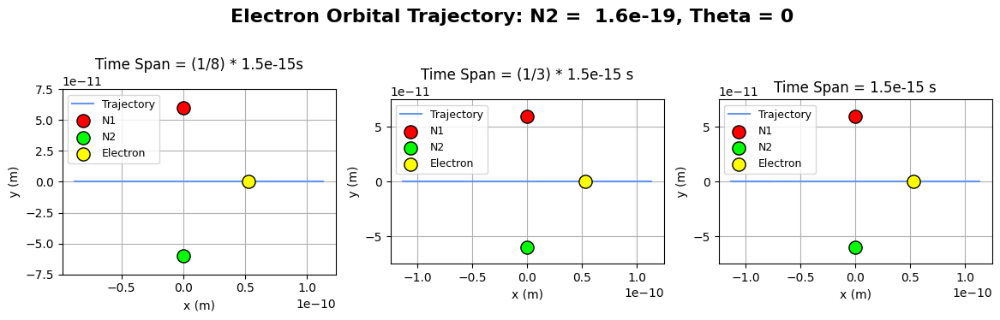

In [97]:
# Parameters to vary
n2 = 1.6e-19  # Nucleus 2 charge
angle = 0   # Launch angle in degrees
T = 1.5e-15 # time for simulation to run, s

sol1 = get_trajectory(n2, angle, T)

# Plot y vs x for theta = 5
fig, ax = plt.subplots(1, 3)
fig.set_size_inches(14, 9)
fig.suptitle(f'Electron Orbital Trajectory: N2 = {n2: 0.2g}, Theta = {angle}', fontsize=16, fontweight='bold')
plt.subplots_adjust(top=1.4) 

ax[2].plot(sol1.y[0], sol1.y[1], label = "Trajectory",c = "cornflowerblue") 
ax[2].set_aspect("equal") 
ax[2].set_title(f"Time Span = {T} s") 
ax[2].set_xlabel("x (m)")
ax[2].set_ylabel(" y (m) ")
ax[2].set_ylim(-7.5e-11,7.5e-11)
ax[2].grid(True) 
ax[2].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
ax[2].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
ax[2].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
ax[2].legend(loc='upper left', fontsize=9) 

# Get the one-third index
idx1 = len(sol1.t) // 3

# Plot only the first one-third of the data
ax[1].plot(sol1.y[0][:idx1], sol1.y[1][:idx1], label="Trajectory", c="cornflowerblue")
ax[1].set_aspect("equal") 
ax[1].set_title(f"Time Span = (1/3) * {T} s") 
ax[1].set_xlabel("x (m)")
ax[1].set_ylabel(" y (m) ")
ax[1].set_ylim(-7.5e-11,7.5e-11)
ax[1].grid(True) 
ax[1].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
ax[1].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
ax[1].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
ax[1].legend(loc='upper left', fontsize=9) 


# Get the one-tenth index
idx2 = len(sol1.t) // 8

# Plot only the first one-third of the data
ax[0].plot(sol1.y[0][:idx2], sol1.y[1][:idx2], label="Trajectory", c="cornflowerblue")
ax[0].set_aspect("equal") 
ax[0].set_title(f"Time Span = (1/8) * {T}s") 
ax[0].set_xlabel("x (m)")
ax[0].set_ylabel(" y (m) ")
ax[0].set_ylim(-7.5e-11,7.5e-11)
ax[0].grid(True) 
ax[0].scatter(x1,y1, s = 120, c = "red", zorder = 10, label = "N1", edgecolors='black', linewidth=1) 
ax[0].scatter(x2,y2, s = 120, c = "lime", zorder = 10, label = "N2", edgecolors='black', linewidth=1) 
ax[0].scatter(r0,0, s = 120, c = "yellow", zorder = 10, label = "Electron", edgecolors='black', linewidth=1)  
ax[0].legend(loc='upper left', fontsize=9)  

# Apply limits to all subplots

plt.show()

We see that this is indeed the case.

### A1.2: Check for Extreme, $\frac{N_2}{N_1}$ Very large
Our second validation task will be to check for the electron trajectory when $\frac{N_2}{N_1}$ is very large. When $N_2$ is big, we expect that the orbital trajectory is a very eccentric ellipse where the electron purely orbits $N_2$, since the relative strength of $N_1$ on the electron is negligible. The force on the electron by $N_2$ should be so large that the electron's trajectory is nearly a straight line, indicating an eccentricity of ~1. We use $N_2 = 5000N_1$, $\theta = 90$ to check this: 

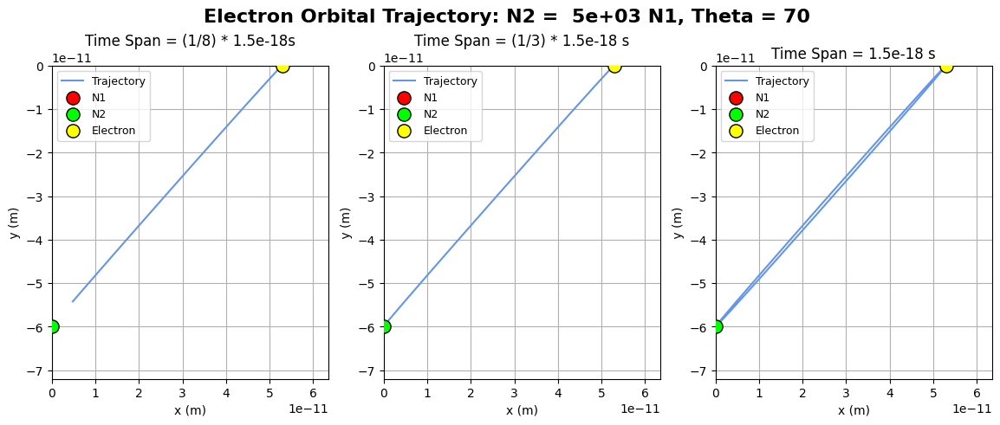

In [83]:
# Parameters to vary
n2 = 5000 * 1.6e-19  # Nucleus 2 charge
angle = 70   # Launch angle in degrees
T = 1.5e-18 # time for simulation to run, s

sol1 = get_trajectory(n2, angle, T)
plot_trajectory(sol1, 1.3, T, 1)

This is indeed what we see, indicating that our simulation is working as planned.